In [1]:
# w = 15 로 돌려보자
# lr = 0.0001
# lambda_1 = 0.01

In [1]:
# 모듈 import
from datetime import datetime
import numpy as np
import os
import pandas as pd

#from google.colab import drive
#drive.mount('/content/gdrive')
#os.chdir('/content/gdrive/MyDrive/python/python_dong/data_axis_transform1')

import torch
import torch.nn as nn
from torch import optim
import torch.nn.functional as F
from torch.autograd import Variable

#!pip install torchmetrics
import torchmetrics

#!pip install torchinfo
from torchinfo import summary

import matplotlib.pyplot as plt
import math


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")



# 1. 데이터 전처리

In [2]:
# data path 지정
raw_data_path = './data/stocknet-dataset/price/raw'

if 'stocknet' in raw_data_path:
    tra_date = '2014-01-02'
    val_date = '2015-08-03'
    tes_date = '2015-10-01'
    end_date = '2015-12-31'
elif 'kdd17' in raw_data_path:
    tra_date = '2007-01-03'
    val_date = '2015-01-02'
    tes_date = '2016-01-04'
    end_date = '2016-12-31'
else:
    print('unexpected path: %s' % raw_data_path)

# os.path.isfile : 파일이 있는지 없는 지 체크
# os.path.join(data_path, fname) : 폴더 디렉터리와 fname(stockname.csv) 붙임
fnames = [fname for fname in os.listdir(raw_data_path) if
            os.path.isfile(os.path.join(raw_data_path,fname))]

COLUMNS_FEATURE_DATA_V1 = ['open_close_ratio', 'high_close_ratio', 
                           'low_close_ratio', 'close_lastclose_ratio', 
                           'adjclose_lastadjclose_ratio', 'close_ma5_ratio', 
                           'close_ma10_ratio', 'close_ma15_ratio', 'close_ma20_ratio', 
                           'close_ma25_ratio', 'close_ma30_ratio']

ver = 'v1' # ver in ['v1', 'v2']
if ver == 'v1':
    COLUMNS_FEATURE = COLUMNS_FEATURE_DATA_V1

In [3]:
windows = [5,10,15,20,25,30]

def preprocess(df, windows):
   '''
   전처리 함수 역할 : 전체 feature생성하여 df column에 추가
   '''
   data = df
   data['open_close_ratio'] = data['Open'] / data['Close'] - 1
   data['high_close_ratio'] = data['High'] / data['Close'] - 1
   data['low_close_ratio'] = data['Low'] / data['Close'] - 1

   data['close_lastclose_ratio'] = np.zeros(len(data))
   data.loc[1:, 'close_lastclose_ratio'] = data['Close'][1:].values / data['Close'][:-1].values - 1

   data['adjclose_lastadjclose_ratio'] = np.zeros(len(data))
   data.loc[1:, 'adjclose_lastadjclose_ratio'] = data['Adj Close'][1:].values / data['Adj Close'][:-1].values - 1

   for window in windows:
      data[f'close_ma{window}_ratio'] = data['Adj Close'].rolling(window).mean()/data['Adj Close'] - 1
   
   data['label'] = np.append((data['Close'][1:].values > data['Close'][:-1].values)*1,0)

   return data

In [4]:
feature_data_path = './data/stocknet-dataset/price/feature'

for fname in fnames:
   if not os.path.isfile(os.path.join(feature_data_path,fname)):
      df_raw = pd.read_csv(os.path.join(raw_data_path,fname))
      data = preprocess(df_raw, windows)

      # 폴더 없으면 생성
      try:
         if not os.path.exists(feature_data_path):
            os.makedirs(feature_data_path)
      except OSError:
         print ('Error: Creating directory. ' +  feature_data_path)

      #csv 파일 저장
      data.to_csv(os.path.join(feature_data_path,fname))



# train, validation, test data 나누기

## 1. input data 3차원으로 쌓기
shape = (stock 종류수, date, feature)



요건
1. 모든 티커 데이터의 date가 맞는지?
2. 결측치는 없는지?
3. 티커와 데이터 메치 가능해야함

In [5]:
raw_data_path = './data/stocknet-dataset/price/raw'


tra_data_X = []
tra_data_Y = []
val_data_X = []
val_data_Y = []
test_data_X = []
test_data_Y = []
tickers = []

cnt = 0
fail_cnt = 0

fnames = [fname for fname in os.listdir(raw_data_path) if
            os.path.isfile(os.path.join(raw_data_path,fname))]

for fname in fnames:

    df = pd.read_csv(os.path.join(raw_data_path,fname))
    data = preprocess(df, windows)

    learning_data = data[(data['Date'] >= tra_date) & (data['Date'] <= end_date)]['Date']
    tra_data_X_ticker = data[(data['Date'] >= tra_date) & (data['Date'] < val_date)][COLUMNS_FEATURE]
    tra_data_Y_ticker = data[(data['Date'] >= tra_date) & (data['Date'] < val_date)]['label']

    val_data_X_ticker = data[(data['Date'] >= val_date) & (data['Date'] < tes_date)][COLUMNS_FEATURE]
    val_data_Y_ticker = data[(data['Date'] >= val_date) & (data['Date'] < tes_date)]['label']

    test_data_X_ticker = data[(data['Date'] >= tes_date) & (data['Date'] <= end_date)][COLUMNS_FEATURE]
    test_data_Y_ticker = data[(data['Date'] >= tes_date) & (data['Date'] <= end_date)]['label']


    if cnt == 0:
        target_dates = learning_data
    
    print('ticker : {}, date check : {}'.format(fname, np.array_equal(target_dates.values, learning_data.values)))
    if np.array_equal(target_dates.values, learning_data.values): 
        
        tra_data_X.append(tra_data_X_ticker.values)
        tra_data_Y.append(tra_data_Y_ticker.values)

        val_data_X.append(val_data_X_ticker.values)
        val_data_Y.append(val_data_Y_ticker.values)
        
        test_data_X.append(test_data_X_ticker.values)
        test_data_Y.append(test_data_Y_ticker.values)

        tickers.append(fname)
    else : 
        fail_cnt += 1
    
    cnt += 1

print(cnt, len(fnames))
print('fail_cnt :', fail_cnt)

# 마지막에 index 종목 넣기
raw_data_index_path = './data/stocknet-dataset/price/raw/index'

fname = os.listdir(raw_data_index_path)[0]

df = pd.read_csv(os.path.join(raw_data_index_path,fname))
data = preprocess(df, windows)

learning_data = data[(data['Date'] >= tra_date) & (data['Date'] <= end_date)]['Date']
tra_data_X_ticker = data[(data['Date'] >= tra_date) & (data['Date'] < val_date)][COLUMNS_FEATURE]
tra_data_Y_ticker = data[(data['Date'] >= tra_date) & (data['Date'] < val_date)]['label']

val_data_X_ticker = data[(data['Date'] >= val_date) & (data['Date'] < tes_date)][COLUMNS_FEATURE]
val_data_Y_ticker = data[(data['Date'] >= val_date) & (data['Date'] < tes_date)]['label']

test_data_X_ticker = data[(data['Date'] >= tes_date) & (data['Date'] <= end_date)][COLUMNS_FEATURE]
test_data_Y_ticker = data[(data['Date'] >= tes_date) & (data['Date'] <= end_date)]['label']

print('ticker : {}, date check : {}'.format(fname, np.array_equal(target_dates.values, learning_data.values)))
if np.array_equal(target_dates.values, learning_data.values):
    
    tra_data_X.append(tra_data_X_ticker.values)
    # tra_data_Y.append(tra_data_Y_ticker.values)

    val_data_X.append(val_data_X_ticker.values)
    # val_data_Y.append(val_data_Y_ticker.values)
    
    test_data_X.append(test_data_X_ticker.values)
    # test_data_Y.append(test_data_Y_ticker.values)

    tickers.append(fname)

# tra_data_X

ticker : AAPL.csv, date check : True
ticker : ABB.csv, date check : True
ticker : ABBV.csv, date check : True
ticker : AEP.csv, date check : True
ticker : AGFS.csv, date check : False
ticker : AMGN.csv, date check : True
ticker : AMZN.csv, date check : True
ticker : BA.csv, date check : True
ticker : BABA.csv, date check : False
ticker : BAC.csv, date check : True
ticker : BBL.csv, date check : True
ticker : BCH.csv, date check : True
ticker : BHP.csv, date check : True
ticker : BP.csv, date check : True
ticker : BRK-A.csv, date check : True
ticker : BSAC.csv, date check : True
ticker : BUD.csv, date check : True
ticker : C.csv, date check : True
ticker : CAT.csv, date check : True
ticker : CELG.csv, date check : True
ticker : CHL.csv, date check : True
ticker : CHTR.csv, date check : True
ticker : CMCSA.csv, date check : True
ticker : CODI.csv, date check : True
ticker : CSCO.csv, date check : True
ticker : CVX.csv, date check : True
ticker : D.csv, date check : True
ticker : DHR.csv,

In [6]:
def list_to_tensor(list_):
    return torch.Tensor(np.array(list_))

In [7]:
tensor_tra_data_X = list_to_tensor(tra_data_X)
tensor_tra_data_Y = list_to_tensor(tra_data_Y).view((len(tra_data_Y),-1,1))
tensor_val_data_X = list_to_tensor(val_data_X)
tensor_val_data_Y = list_to_tensor(val_data_Y).view((len(val_data_Y),-1,1))
tensor_test_data_X = list_to_tensor(test_data_X)
tensor_test_data_Y = list_to_tensor(test_data_Y).view((len(test_data_Y),-1,1))

## Hyperparameter setting

In [8]:
w = 15 # window size w in {10, 15}
beta = 0.01 # market context weight beta in {0.01, 0.1, 1}
h = 64 # hidden layer size h in {64, 128}
learning_rate = 0.0001 # in {0.001, 0.0001}
lambda_1 = 0.01 # selective regularzation lambda = 1
drop_rate = 0.15
feature_size = len(COLUMNS_FEATURE)

In [9]:
class Feature_transformation_layer(nn.Module):
    """Feature transformation layer in DTML"""

    def __init__(self, feature_size, h):
        super(Feature_transformation_layer, self).__init__()
        self.feature_size = feature_size
        self.h = h

        self.linear = nn.Linear(self.feature_size, self.h)
    
    def forward(self, X):
        output = torch.tanh(self.linear(X))
        return output

In [10]:
def layer_normalization(tensor):
    h = tensor.size()[-1]
    return (tensor - torch.std_mean(tensor, dim=1, unbiased=False)[1].repeat((h,1)).transpose(-2,-1))/torch.std_mean(tensor, dim=1, unbiased=False)[0].repeat((h,1)).transpose(-2,-1)

In [11]:
class Nonlinear_transformation(nn.Module):
    """Nonlinear transformation in DTML"""

    def __init__(self, h):
        super(Nonlinear_transformation, self).__init__()
        self.h = h


        self.mlp1 = nn.Linear(self.h, self.h * 4)
        self.mlp2 = nn.Linear(self.h * 4, h)
    
    def forward(self, H, H_tilda, on_train=True):
        H_p = H + H_tilda
        H_p = self.mlp1(H_p)
        H_p = nn.ReLU()(H_p)
        H_p = self.mlp2(H_p)
        H_p = H + H_tilda + H_p
        H_p = nn.Tanh()(H_p)

        # dropout and layer normalization
        if on_train == True:
            H_p = nn.Dropout(p=drop_rate)(H_p)
        H_p = layer_normalization(H_p)
        return H_p

In [12]:
class Final_prediction(nn.Module):
    """final prediction in DTML"""

    def __init__(self, h):
        super(Final_prediction, self).__init__()
        self.h = h

        self.pred_linear = nn.Linear(h,1)
    
    def forward(self, H_p):
        y_hat = self.pred_linear(H_p)
        y_hat = nn.Sigmoid()(y_hat).view((-1))

        return y_hat

In [13]:
class DTML(nn.Module):
    ''' DTML '''

    def __init__(self, X, y, w, h, beta, vali_X, vali_y, test_X, test_y,
                 batch_size,
                 learning_rate, epochs):
        """ Initialize """
        super(DTML, self).__init__()
        self.X = X
        self.y = y
        self.vali_X = vali_X
        self.vali_y = vali_y
        self.test_X = test_X
        self.test_y = test_y
        self.w = w
        self.h = h
        self.beta = beta
        self.batch_size = batch_size
        self.learning_rate = learning_rate
        self.epochs = epochs
        self.train_timesteps = train_timesteps = int(X.size()[1]) - w

        self.device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
        print("==> Use accelerator : ", self.device)

        self.Feature_transformation_layer = Feature_transformation_layer(feature_size=self.X.size()[-1],
                                                                         h=self.h)
        
        # 티커별로 lstm 층 개별로 만들기
        for i in range(self.X.size()[0]): # 마지막은 index용 lstm
            self._modules['lstm_{}'.format(0)] = nn.LSTM(input_size = self.h, hidden_size=self.h, batch_first=True)
        
        # ticker별로 linear layer 생성
        for i in range(self.X.size()[0]):
            self._modules['ContextNormalLinearLayer_{}'.format(0)] = nn.Linear(h, h)

        self.multihead_attn = nn.MultiheadAttention(embed_dim=self.h, num_heads=8, dropout=drop_rate)
        self.query_layer = nn.Linear(self.h, self.h)
        self.key_layer = nn.Linear(self.h, self.h)
        self.value_layer = nn.Linear(self.h, self.h)

        self.Nonlinear_transformation = Nonlinear_transformation(h=self.h)

        self.Final_prediction = Final_prediction(h=self.h)

        # Loss funciton
        self.criterion = nn.BCELoss()

        self.optimizer = optim.Adam(params=self.parameters(), lr=self.learning_rate)

    def window_(self, tensor, time_idx, window_size):
        # tensor size = (ticker_number, dates, feature_size)    
        return tensor[:, time_idx:time_idx + self.w, :]


    def train(self):
        mode = 'train'
        if mode == 'train':
            X = self.X
            y_data = self.y
            epochs = self.epochs
        elif mode == 'validation':
            X = self.vali_X
            y_data = self.vali_y
            epochs = 1
        
        elif mode == 'test':
            X = self.test_X
            y_data = self.test_y
            epochs = 1

        else:
            print('유효하지 않는 mode입니다.')
            

        timesteps = int(X.size()[1]) - w

        """training process"""
        # epoch당 iteration 수
        iter_per_epoch = int(np.ceil(timesteps * 1. / self.batch_size))
        # 전체 iteration에서 loss (전체 iteration 수 = epoch수 * epoch당 iteration 수)
        self.iter_losses = np.zeros(epochs * iter_per_epoch)
        self.iter_acc = np.zeros(epochs * iter_per_epoch)
        self.iter_mcc = np.zeros(epochs * iter_per_epoch)
        self.iter_precision = np.zeros(epochs * iter_per_epoch)
        self.return_rate = np.zeros((epochs, timesteps)) # batch_size 관련해서 수정필요
        self.index_return_rate = np.zeros((epochs, timesteps)) # batch_size 관련해서 수정필요
        self.com_return_rate = np.zeros((epochs, timesteps)) # batch_size 관련해서 수정필요
        self.index_com_return_rate = np.zeros((epochs, timesteps))

        # epoch당 loss
        self.epoch_losses = np.zeros(epochs)
        self.epoch_acc = np.zeros(epochs)
        self.epoch_mcc = np.zeros(epochs)
        self.epoch_precision = np.zeros(epochs)

        # epoch당 loss (Validation)
        self.vali_epoch_losses = np.zeros(epochs)
        self.vali_epoch_acc = np.zeros(epochs)
        self.vali_epoch_mcc = np.zeros(epochs)
        self.vali_epoch_precision = np.zeros(epochs)

        vali_timesteps = int(self.vali_X.size()[1]) - w

        """training process"""
        # epoch당 iteration 수
        vali_iter_per_epoch = int(np.ceil(vali_timesteps * 1. / self.batch_size))
        # 전체 iteration에서 loss (전체 iteration 수 = epoch수 * epoch당 iteration 수)
        self.vali_iter_losses = np.zeros(epochs * vali_iter_per_epoch)
        self.vali_iter_acc = np.zeros(epochs * vali_iter_per_epoch)
        self.vali_iter_mcc = np.zeros(epochs * vali_iter_per_epoch)
        self.vali_iter_precision = np.zeros(epochs * vali_iter_per_epoch)
        self.vali_return_rate = np.zeros((epochs, vali_timesteps)) # batch_size 관련해서 수정필요
        self.vali_index_return_rate = np.zeros((epochs, vali_timesteps)) # batch_size 관련해서 수정필요
        self.vali_com_return_rate = np.zeros((epochs, vali_timesteps)) # batch_size 관련해서 수정필요
        self.vali_index_com_return_rate = np.zeros((epochs, vali_timesteps))

        train_n_iter = 0

        for epoch in range(self.epochs):
            time_idx = 0
            com_return_rate = 1
            index_com_return_rate = 1
            output = self.Feature_transformation_layer(X)

            while (time_idx < timesteps):
                #print('time_idx : {}, train_timesteps : {}'.format(time_idx, self.train_timesteps))
                
                Z_tilda = self.window_(output, time_idx=time_idx, window_size=self.w)
                tra_data_Y_w = self.window_(y_data, time_idx=time_idx, window_size=self.w)

                # hidden state ticker별 쌓기
                H_n = torch.Tensor().new_zeros((X.size()[0],w,h)) # +1은 index

                for ticker_idx in range(X.size()[0]):
                    # print('ticker_idx', ticker_idx)
                    i = 0
                    z_tilda = Z_tilda[ticker_idx,:,:].view(1,Z_tilda.size()[1], Z_tilda.size()[2])
                    lstm_output, (h_n, c_n) = self._modules['lstm_{}'.format(0)](z_tilda[:,i,:].view(1,1,Z_tilda.size()[2]))
                    H_n[ticker_idx,0,:] = h_n
                    for i in range(1,w):
                        lstm_output, (h_n, c_n) = self._modules['lstm_{}'.format(0)](z_tilda[:,i,:].view(1,1,Z_tilda.size()[2]), (h_n, c_n))
                        H_n[ticker_idx,i,:] = h_n

                H_n_dot = torch.Tensor().new_zeros((X.size()[0],self.w)) # 알파_i 계산하기전 ticker별로 dot(h_i, h_T) 계산
                # size (len(tickers), window_size w)
                # https://pytorch.org/docs/stable/generated/torch.matmul.html
                # torch.mul broadcasting 볼수 있음
                for i in range(X.size()[0]):
                    H_n_dot[i,:] = torch.matmul(H_n[i], H_n[i][-1])

                # https://pytorch.org/docs/stable/generated/torch.nn.Softmax.html
                Alpha = nn.Softmax(dim=1)(torch.exp(H_n_dot))

                H_n_tilde = torch.Tensor().new_zeros((X.size()[0], self.h))
                for i in range(self.X.size()[0]):
                    H_n_tilde[i,:] = torch.matmul(H_n[i].transpose(-2,-1), Alpha[i])

                pre_H_c_n = layer_normalization(H_n_tilde)

                H_c_n = torch.Tensor().new_zeros(X.size()[0], self.h)
                for i in range(X.size()[0]):
                    H_c_n[i,:]= self._modules['ContextNormalLinearLayer_{}'.format(0)](pre_H_c_n[i])

                H = H_c_n + self.beta*H_c_n[-1]
                H = H[:-1] # 마지막 index context vector 제외


                H_tilda, attn_output_weights = self.multihead_attn(query=H.view([1,H.size()[0], H.size()[1]]), key=H.view([1,H.size()[0], H.size()[1]]), value=H.view([1,H.size()[0], H.size()[1]]))
                H_tilda = H_tilda[0]
                #Q = self.query_layer(H)
                #K = self.key_layer(H)
                #V = self.value_layer(H)

                # S 생성
                #S = torch.matmul(Q, K.transpose(-2,-1))
                #S = S/math.sqrt(h)
                #S = nn.Softmax(dim=1)(S)

                # H_tilda 생성
                #H_tilda = torch.matmul(S,V)

                # dropout and layer normailzation --> attention후, drop-out 하라고 논문에 있음
                #H_tilda = nn.Dropout(p=drop_rate)(H_tilda) -> multihead에 dropout 포함되어있습니다.
                H_tilda = layer_normalization(H_tilda)

                if mode == 'train':
                    H_p = self.Nonlinear_transformation(H, H_tilda, on_train=True)
                else:
                    H_p = self.Nonlinear_transformation(H, H_tilda, on_train=False)

                y_hat = self.Final_prediction(H_p)
                y = tra_data_Y_w[:,w-1,:].view((-1))

                if mode == 'train':
                    self.optimizer.zero_grad()

                ## Selective Regularization
                loss_reg = self.criterion(y_hat,y) + lambda_1*(torch.norm(list(self.Final_prediction.parameters())[0]).pow(2)
                                 + torch.norm(list(self.Final_prediction.parameters())[1]).pow(2))
                
                acc = torchmetrics.functional.accuracy(y_hat,y.int())
                mcc = torchmetrics.MatthewsCorrcoef(num_classes=2)(y_hat, y.int())
                precision = torchmetrics.Precision()(y_hat, y.int())
                return_rate = X[y_hat.topk(3)[1],time_idx + w,4].sum()*(1/3)
                index_return_rate = X[-1, time_idx + w, 4]
                com_return_rate *= 1 + return_rate
                index_com_return_rate *= 1 + index_return_rate

                if mode == 'train':
                    loss_reg.backward(retain_graph=True)
                    self.optimizer.step()
              

                self.iter_losses[int(epoch * iter_per_epoch + time_idx / self.batch_size)] = loss_reg
                self.iter_acc[int(epoch * iter_per_epoch + time_idx / self.batch_size)] = acc
                self.iter_mcc[int(epoch * iter_per_epoch + time_idx / self.batch_size)] = mcc
                self.iter_precision[int(epoch * iter_per_epoch + time_idx / self.batch_size)] = precision
                self.return_rate[epoch, time_idx] = return_rate # batch_size 적용하면 수정해야함
                self.index_return_rate[epoch, time_idx] = index_return_rate
                self.com_return_rate[epoch, time_idx] = com_return_rate # batch_size 적용하면 수정해야함
                self.index_com_return_rate[epoch, time_idx] = index_com_return_rate # batch_size 적용하면 수정해야함    

                '''
                if time_idx % 1000 == 0:
                    print('epoch : ',epoch, "time_idx : ", time_idx, 
                          "loss_reg : ", loss_reg, 
                          "acc : ", acc, 
                          "mcc : ", mcc,
                          "precision : ", precision,
                          "return_rate", return_rate,
                          "com_return_rate", com_return_rate)
                '''
                

                time_idx += self.batch_size
                train_n_iter += 1                

                if train_n_iter % 100 == 0 and train_n_iter != 0:
                    for param_group in self.optimizer.param_groups:
                        param_group['lr'] = param_group['lr'] * 0.9
                
                ######### 공통부분 끝, 데이터 수집 시작

            self.epoch_losses[epoch] = np.mean(self.iter_losses[range(
                epoch * iter_per_epoch, (epoch + 1) * iter_per_epoch)])
            
            self.epoch_acc[epoch] = np.mean(self.iter_acc[range(
                epoch * iter_per_epoch, (epoch + 1) * iter_per_epoch)])
            
            self.epoch_mcc[epoch] = np.mean(self.iter_mcc[range(
                epoch * iter_per_epoch, (epoch + 1) * iter_per_epoch)])
            
            self.epoch_precision[epoch] = np.mean(self.iter_precision[range(
                epoch * iter_per_epoch, (epoch + 1) * iter_per_epoch)])

            plt.subplot(3,1,1)
            #plt.figure()
            plt.plot(range(timesteps), self.com_return_rate[epoch][:timesteps], label='portfolio')
            plt.plot(range(timesteps), self.index_com_return_rate[0][ : timesteps], label='index')
            plt.legend(loc='upper left')
            plt.ylabel('com_return_rate')

            plt.subplot(3,1,2)
            plt.plot(range(int(epoch * iter_per_epoch + time_idx / self.batch_size)), self.iter_losses[:int(epoch * iter_per_epoch + time_idx / self.batch_size)], label=mode)
            plt.legend(loc='upper left')
            plt.ylabel('loss_reg')

            plt.subplot(3,1,3)
            plt.plot(range(int(epoch * iter_per_epoch + time_idx / self.batch_size)), self.iter_acc[:int(epoch * iter_per_epoch + time_idx / self.batch_size)], label=mode)
            plt.legend(loc='upper left')
            plt.ylabel('iter_acc')

            plt.show()

            if epoch % 1 == 0:
                plt.subplot(2,1,1)
                plt.plot(range(epoch + 1), self.epoch_losses[:epoch + 1], label=mode)
                plt.legend(loc='upper left')
                plt.ylabel('loss_reg')

                plt.subplot(2,1,2)
                plt.plot(range(epoch + 1), self.epoch_acc[:epoch + 1], label=mode)
                plt.legend(loc='upper left')
                plt.ylabel('acc')

                plt.show()

            if epoch % 1 == 0:
                print("Epochs : ", epoch, "Iterations : ", train_n_iter,
                      "Loss : ", self.epoch_losses[epoch],
                      "ACC : ", self.epoch_acc[epoch],
                      "MCC : ", self.epoch_mcc[epoch],
                      "Precision : ", self.epoch_precision[epoch])
            
            if epoch % 1 == 0:
                self.validation(e=epoch)




            if epoch % 1 == 0:
                plt.subplot(2,1,1)
                plt.plot(range(epoch + 1), self.vali_epoch_losses[:epoch + 1], label='validation')
                plt.legend(loc='upper left')
                plt.ylabel('loss_reg')

                plt.subplot(2,1,2)
                plt.plot(range(epoch + 1), self.vali_epoch_acc[:epoch + 1], label='validation')
                plt.legend(loc='upper left')
                plt.ylabel('acc')

                plt.show()
    
    def validation(self , e):
        mode = 'validation'
        if mode == 'train':
            print('mode :', mode)
            X = self.X
            y_data = self.y
            epochs = self.epochs
        elif mode == 'validation':
            print('mode :', mode)
            X = self.vali_X
            y_data = self.vali_y
            epochs = 1
        
        elif mode == 'test':
            print('mode :', mode)
            X = self.test_X
            y_data = self.test_y
            epochs = 1

        else:
            print('유효하지 않는 mode입니다.')
            
        
        vali_timesteps = int(X.size()[1]) - w

        # epoch당 iteration 수
        vali_iter_per_epoch = int(np.ceil(vali_timesteps * 1. / self.batch_size))
        '''
        """training process"""
        # epoch당 iteration 수
        vali_iter_per_epoch = int(np.ceil(vali_timesteps * 1. / self.batch_size))
        # 전체 iteration에서 loss (전체 iteration 수 = epoch수 * epoch당 iteration 수)
        self.vali_iter_losses = np.zeros(epochs * vali_iter_per_epoch)
        self.vali_iter_acc = np.zeros(epochs * vali_iter_per_epoch)
        self.vali_iter_mcc = np.zeros(epochs * vali_iter_per_epoch)
        self.vali_iter_precision = np.zeros(epochs * vali_iter_per_epoch)
        self.vali_return_rate = np.zeros((epochs, vali_timesteps)) # batch_size 관련해서 수정필요
        self.vali_index_return_rate = np.zeros((epochs, vali_timesteps)) # batch_size 관련해서 수정필요
        self.vali_com_return_rate = np.zeros((epochs, vali_timesteps)) # batch_size 관련해서 수정필요
        self.vali_index_com_return_rate = np.zeros((epochs, vali_timesteps))
        '''
        '''
        # epoch당 loss
        self.vali_epoch_losses = np.zeros(epochs)
        self.vali_epoch_acc = np.zeros(epochs)
        self.vali_epoch_mcc = np.zeros(epochs)
        self.vali_epoch_precision = np.zeros(epochs)
        '''

        vali_n_iter = 0

        for epoch in range(epochs):
            time_idx = 0
            com_return_rate = 1
            index_com_return_rate = 1
            output = self.Feature_transformation_layer(X)

            while (time_idx < vali_timesteps):
                #print('time_idx : {}, train_timesteps : {}'.format(time_idx, self.train_timesteps))
                
                Z_tilda = self.window_(output, time_idx=time_idx, window_size=self.w)
                tra_data_Y_w = self.window_(y_data, time_idx=time_idx, window_size=self.w)

                # hidden state ticker별 쌓기
                H_n = torch.Tensor().new_zeros((X.size()[0],w,h)) # +1은 index

                for ticker_idx in range(X.size()[0]):
                    # print('ticker_idx', ticker_idx)
                    i = 0
                    z_tilda = Z_tilda[ticker_idx,:,:].view(1,Z_tilda.size()[1], Z_tilda.size()[2])
                    lstm_output, (h_n, c_n) = self._modules['lstm_{}'.format(0)](z_tilda[:,i,:].view(1,1,Z_tilda.size()[2]))
                    H_n[ticker_idx,0,:] = h_n
                    for i in range(1,w):
                        lstm_output, (h_n, c_n) = self._modules['lstm_{}'.format(0)](z_tilda[:,i,:].view(1,1,Z_tilda.size()[2]), (h_n, c_n))
                        H_n[ticker_idx,i,:] = h_n

                H_n_dot = torch.Tensor().new_zeros((X.size()[0],self.w)) # 알파_i 계산하기전 ticker별로 dot(h_i, h_T) 계산
                # size (len(tickers), window_size w)
                # https://pytorch.org/docs/stable/generated/torch.matmul.html
                # torch.mul broadcasting 볼수 있음
                for i in range(X.size()[0]):
                    H_n_dot[i,:] = torch.matmul(H_n[i], H_n[i][-1])

                # https://pytorch.org/docs/stable/generated/torch.nn.Softmax.html
                Alpha = nn.Softmax(dim=1)(torch.exp(H_n_dot))

                H_n_tilde = torch.Tensor().new_zeros((X.size()[0], self.h))
                for i in range(self.X.size()[0]):
                    H_n_tilde[i,:] = torch.matmul(H_n[i].transpose(-2,-1), Alpha[i])

                pre_H_c_n = layer_normalization(H_n_tilde)

                H_c_n = torch.Tensor().new_zeros(X.size()[0], self.h)
                for i in range(X.size()[0]):
                    H_c_n[i,:]= self._modules['ContextNormalLinearLayer_{}'.format(0)](pre_H_c_n[i])

                H = H_c_n + self.beta*H_c_n[-1]
                H = H[:-1] # 마지막 index context vector 제외


                H_tilda, attn_output_weights = self.multihead_attn(query=H.view([1,H.size()[0], H.size()[1]]), key=H.view([1,H.size()[0], H.size()[1]]), value=H.view([1,H.size()[0], H.size()[1]]))
                H_tilda = H_tilda[0]
                #Q = self.query_layer(H)
                #K = self.key_layer(H)
                #V = self.value_layer(H)

                # S 생성
                #S = torch.matmul(Q, K.transpose(-2,-1))
                #S = S/math.sqrt(h)
                #S = nn.Softmax(dim=1)(S)

                # H_tilda 생성
                #H_tilda = torch.matmul(S,V)

                # dropout and layer normailzation --> attention후, drop-out 하라고 논문에 있음
                #H_tilda = nn.Dropout(p=drop_rate)(H_tilda) -> multihead에 dropout 포함되어있습니다.
                H_tilda = layer_normalization(H_tilda)

                if mode == 'train':
                    H_p = self.Nonlinear_transformation(H, H_tilda, on_train=True)
                else:
                    H_p = self.Nonlinear_transformation(H, H_tilda, on_train=False)

                y_hat = self.Final_prediction(H_p)
                y = tra_data_Y_w[:,w-1,:].view((-1))

                if mode == 'train':
                    self.optimizer.zero_grad()

                ## Selective Regularization
                loss_reg = self.criterion(y_hat,y) + lambda_1*(torch.norm(list(self.Final_prediction.parameters())[0]).pow(2)
                                 + torch.norm(list(self.Final_prediction.parameters())[1]).pow(2))
                
                acc = torchmetrics.functional.accuracy(y_hat,y.int())
                mcc = torchmetrics.MatthewsCorrcoef(num_classes=2)(y_hat, y.int())
                precision = torchmetrics.Precision()(y_hat, y.int())
                return_rate = X[y_hat.topk(3)[1],time_idx + w,4].sum()*(1/3)
                index_return_rate = X[-1, time_idx + w, 4]
                com_return_rate *= 1 + return_rate
                index_com_return_rate *= 1 + index_return_rate

                if mode == 'train':
                    loss_reg.backward(retain_graph=True)
                    self.optimizer.step()
              

                self.vali_iter_losses[int(e * vali_iter_per_epoch + time_idx / self.batch_size)] = loss_reg
                self.vali_iter_acc[int(e * vali_iter_per_epoch + time_idx / self.batch_size)] = acc
                self.vali_iter_mcc[int(e * vali_iter_per_epoch + time_idx / self.batch_size)] = mcc
                self.vali_iter_precision[int(e * vali_iter_per_epoch + time_idx / self.batch_size)] = precision
                self.vali_return_rate[e, time_idx] = return_rate # batch_size 적용하면 수정해야함
                self.vali_index_return_rate[e, time_idx] = index_return_rate
                self.vali_com_return_rate[e, time_idx] = com_return_rate # batch_size 적용하면 수정해야함
                self.vali_index_com_return_rate[e, time_idx] = index_com_return_rate # batch_size 적용하면 수정해야함    

                '''
                if time_idx % 1000 == 0:
                    print('epoch : ',epoch, "time_idx : ", time_idx, 
                          "loss_reg : ", loss_reg, 
                          "acc : ", acc, 
                          "mcc : ", mcc,
                          "precision : ", precision,
                          "return_rate", return_rate,
                          "com_return_rate", com_return_rate)
                '''
                

                time_idx += self.batch_size
                vali_n_iter += 1                

                '''
                if train_n_iter % 100 == 0 and train_n_iter != 0:
                    for param_group in self.optimizer.param_groups:
                        param_group['lr'] = param_group['lr'] * 0.9
                '''
                
                ######### 공통부분 끝, 데이터 수집 시작

            self.vali_epoch_losses[e] = np.mean(self.vali_iter_losses[range(
                e * vali_iter_per_epoch, (e + 1) * vali_iter_per_epoch)])
            
            self.vali_epoch_acc[e] = np.mean(self.vali_iter_acc[range(
                e * vali_iter_per_epoch, (e + 1) * vali_iter_per_epoch)])
            
            self.vali_epoch_mcc[e] = np.mean(self.vali_iter_mcc[range(
                e * vali_iter_per_epoch, (e + 1) * vali_iter_per_epoch)])
            
            self.vali_epoch_precision[e] = np.mean(self.vali_iter_precision[range(
                e * vali_iter_per_epoch, (e + 1) * vali_iter_per_epoch)])

            plt.subplot(3,1,1)
            #plt.figure()
            plt.plot(range(vali_timesteps), self.vali_com_return_rate[e][:vali_timesteps], label='portfolio')
            plt.plot(range(vali_timesteps), self.vali_index_com_return_rate[0][ : vali_timesteps], label='index')
            plt.legend(loc='upper left')
            plt.ylabel('com_return_rate')

            plt.subplot(3,1,2)
            plt.plot(range(int(e * vali_iter_per_epoch + time_idx / self.batch_size)), self.vali_iter_losses[:int(e * vali_iter_per_epoch + time_idx / self.batch_size)], label=mode)
            plt.legend(loc='upper left')
            plt.ylabel('loss_reg')

            plt.subplot(3,1,3)
            plt.plot(range(int(e * vali_iter_per_epoch + time_idx / self.batch_size)), self.vali_iter_acc[:int(e * vali_iter_per_epoch + time_idx / self.batch_size)], label=mode)
            plt.legend(loc='upper left')
            plt.ylabel('iter_acc')

            plt.show()



            if epoch % 1 == 0:
                print("Epochs : ", e, "Iterations : ", vali_n_iter,
                      "Loss : ", self.vali_epoch_losses[e],
                      "ACC : ", self.vali_epoch_acc[e],
                      "MCC : ", self.vali_epoch_mcc[e],
                      "Precision : ", self.vali_epoch_precision[e])
        
    
    def test(self):
        
        timesteps = int(self.test_X.size()[1]) - w
        epochs = 1
        # epoch당 iteration 수
        iter_per_epoch = int(np.ceil(timesteps * 1. / self.batch_size))
        # 전체 iteration에서 loss (전체 iteration 수 = epoch수 * epoch당 iteration 수)
        self.test_iter_losses = np.zeros(epochs * iter_per_epoch)
        self.test_iter_acc = np.zeros(epochs * iter_per_epoch)
        self.test_iter_mcc = np.zeros(epochs * iter_per_epoch)
        self.test_iter_precision = np.zeros(epochs * iter_per_epoch)
        self.test_return_rate = np.zeros((epochs, timesteps)) # batch_size 관련해서 수정필요
        self.test_index_return_rate = np.zeros((epochs, timesteps))
        self.test_com_return_rate = np.zeros((epochs, timesteps)) # batch_size 관련해서 수정필요
        self.test_index_com_return_rate = np.zeros((epochs, timesteps))

        # epoch당 loss
        self.test_epoch_losses = np.zeros(epochs)
        self.test_epoch_acc = np.zeros(epochs)
        self.test_epoch_mcc = np.zeros(epochs)
        self.test_epoch_precision = np.zeros(epochs)

        n_iter = 0

        for epoch in range(epochs):
            time_idx = 0
            com_return_rate = 1
            index_com_return_rate = 1
            output = self.Feature_transformation_layer(self.test_X)

            while (time_idx < timesteps): # test끝으로 바꿔야함
                #print('time_idx : {}, train_timesteps : {}'.format(time_idx, self.train_timesteps))
                
                Z_tilda = self.window_(output, time_idx=time_idx, window_size=self.w)
                tes_data_Y_w = self.window_(self.test_y, time_idx=time_idx, window_size=self.w)

                # hidden state ticker별 쌓기
                H_n = torch.Tensor().new_zeros((self.test_X.size()[0],w,h)) # +1은 index

                for ticker_idx in range(self.test_X.size()[0]):
                    # print('ticker_idx', ticker_idx)
                    i = 0
                    z_tilda = Z_tilda[ticker_idx,:,:].view(1,Z_tilda.size()[1], Z_tilda.size()[2])
                    lstm_output, (h_n, c_n) = self._modules['lstm_{}'.format(ticker_idx)](z_tilda[:,i,:].view(1,1,Z_tilda.size()[2]))
                    H_n[ticker_idx,0,:] = h_n
                    for i in range(1,w):
                        lstm_output, (h_n, c_n) = self._modules['lstm_{}'.format(ticker_idx)](z_tilda[:,i,:].view(1,1,Z_tilda.size()[2]), (h_n, c_n))
                        H_n[ticker_idx,i,:] = h_n

                H_n_dot = torch.Tensor().new_zeros((self.test_X.size()[0],self.w)) # 알파_i 계산하기전 ticker별로 dot(h_i, h_T) 계산
                # size (len(tickers), window_size w)
                # https://pytorch.org/docs/stable/generated/torch.matmul.html
                # torch.mul broadcasting 볼수 있음
                for i in range(self.test_X.size()[0]):
                    H_n_dot[i,:] = torch.matmul(H_n[i], H_n[i][-1])

                # https://pytorch.org/docs/stable/generated/torch.nn.Softmax.html
                Alpha = nn.Softmax(dim=1)(torch.exp(H_n_dot))

                H_n_tilde = torch.Tensor().new_zeros((self.test_X.size()[0], self.h))
                for i in range(self.test_X.size()[0]):
                    H_n_tilde[i,:] = torch.matmul(H_n[i].transpose(-2,-1), Alpha[i])

                pre_H_c_n = layer_normalization(H_n_tilde)

                H_c_n = torch.Tensor().new_zeros(self.test_X.size()[0], self.h)
                for i in range(self.test_X.size()[0]):
                    H_c_n[i,:]= self._modules['ContextNormalLinearLayer_{}'.format(i)](pre_H_c_n[i])

                H = H_c_n + self.beta*H_c_n[-1]
                H = H[:-1] # 마지막 index context vector 제외

                H_tilda, attn_output_weights = self.multihead_attn(query=H.view([1,H.size()[0], H.size()[1]]), key=H.view([1,H.size()[0], H.size()[1]]), value=H.view([1,H.size()[0], H.size()[1]]))
                H_tilda = H_tilda[0]

                # Q = self.query_layer(H)
                # K = self.key_layer(H)
                # V = self.value_layer(H)

                # S 생성
                # S = torch.matmul(Q, K.transpose(-2,-1))
                # S = S/math.sqrt(h)
                # S = nn.Softmax(dim=1)(S)

                # H_tilda 생성
                # H_tilda = torch.matmul(S,V)

                # dropout and layer normailzation
                # H_tilda = nn.Dropout(p=drop_rate)(H_tilda)
                H_tilda = layer_normalization(H_tilda)


                H_p = self.Nonlinear_transformation(H, H_tilda, on_train=False) # dropout을 없애야한다!
                
                y_hat = self.Final_prediction(H_p)
                # print("y_hat :", y_hat)
                y = tes_data_Y_w[:,w-1,:].view((-1))

                # self.optimizer.zero_grad()
                # test에서는 학습할 필요 없어요

                ## Selective Regularization
                loss_reg = self.criterion(y_hat,y) + lambda_1*(torch.norm(list(self.Final_prediction.parameters())[0]).pow(2)
                                 + torch.norm(list(self.Final_prediction.parameters())[1]).pow(2))
                # loss_reg 달라짐
                # print("loss : ", loss_reg)

                acc = torchmetrics.functional.accuracy(y_hat,y.int())
                mcc = torchmetrics.MatthewsCorrcoef(num_classes=2)(y_hat, y.int())
                precision = torchmetrics.Precision()(y_hat, y.int())
                return_rate = self.test_X[y_hat.topk(3)[1],time_idx + w,4].sum()*(1/3)
                index_return_rate = self.test_X[-1, time_idx + w, 4]
                com_return_rate *= 1 + return_rate
                index_com_return_rate *= 1 + index_return_rate

                # test에서는 학습할 필요 없어요
                # loss_reg.backward(retain_graph=True)
                # self.optimizer.step()

                self.test_iter_losses[int(epoch * iter_per_epoch + time_idx / self.batch_size)] = loss_reg
                self.test_iter_acc[int(epoch * iter_per_epoch + time_idx / self.batch_size)] = acc
                self.test_iter_mcc[int(epoch * iter_per_epoch + time_idx / self.batch_size)] = mcc
                self.test_iter_precision[int(epoch * iter_per_epoch + time_idx / self.batch_size)] = precision
                self.test_return_rate[epoch, time_idx] = return_rate # batch_size 적용하면 수정해야함
                self.test_index_return_rate[epoch, time_idx] = index_return_rate
                self.test_com_return_rate[epoch, time_idx] = com_return_rate # batch_size 적용하면 수정해야함
                self.test_index_com_return_rate[epoch, time_idx] = index_com_return_rate

                if time_idx % 100 == 0:
                    print('epoch : ',epoch, "time_idx : ", time_idx, 
                          "loss_reg : ", loss_reg, 
                          "acc : ", acc, 
                          "mcc : ", mcc,
                          "precision : ", precision)

                time_idx += self.batch_size
                n_iter += 1

                self.test_epoch_losses[epoch] = np.mean(self.test_iter_losses[range(
                    epoch * iter_per_epoch, (epoch + 1) * iter_per_epoch)])
                
                self.test_epoch_acc[epoch] = np.mean(self.test_iter_acc[range(
                    epoch * iter_per_epoch, (epoch + 1) * iter_per_epoch)])
                
                self.test_epoch_mcc[epoch] = np.mean(self.test_iter_mcc[range(
                    epoch * iter_per_epoch, (epoch + 1) * iter_per_epoch)])
                
                self.test_epoch_precision[epoch] = np.mean(self.test_iter_precision[range(
                    epoch * iter_per_epoch, (epoch + 1) * iter_per_epoch)])
                
                # 수익률 계산
                # 수정종가에 매수, 익일 수정종가에 매도
                # adjclose_lastadjclose_ratio 으로 계산 (5번째 있는 column / index는 4)
                # Weight = 동일가중
                # 오를 확률이 제일 높은 3개 Ticker 매수 후, 익일 매도

            plt.subplot(3,1,1)
            #plt.figure()
            plt.plot(range(timesteps), self.test_com_return_rate[0][ : timesteps], label="Portfolio")
            plt.plot(range(timesteps), self.test_index_com_return_rate[0][ : timesteps], label='index')
            plt.legend(loc='upper left')
            plt.ylabel('com_return_rate')

            plt.subplot(3,1,2)
            plt.plot(range(int(epoch * iter_per_epoch + time_idx / self.batch_size)), self.test_iter_losses[:int(epoch * iter_per_epoch + time_idx / self.batch_size)], label='test')
            plt.legend(loc='upper left')
            plt.ylabel('loss_reg')

            plt.subplot(3,1,3)
            plt.plot(range(int(epoch * iter_per_epoch + time_idx / self.batch_size)), self.test_iter_acc[:int(epoch * iter_per_epoch + time_idx / self.batch_size)], label='test')
            plt.legend(loc='upper left')
            plt.ylabel('iter_acc')

            plt.show()    


            if epoch % 10 == 0:
                print("Epochs : ", epoch, "Iterations : ", n_iter,
                      "Loss : ", self.test_epoch_losses[epoch],
                      "ACC : ", self.test_epoch_acc[epoch],
                      "MCC : ", self.test_epoch_mcc[epoch],
                      "Precision : ", self.test_epoch_precision[epoch])


                

In [14]:
model = DTML(
    X=tensor_tra_data_X,
    y=tensor_tra_data_Y,
    vali_X = tensor_val_data_X,
    vali_y = tensor_val_data_Y,
    test_X = tensor_test_data_X,
    test_y=tensor_test_data_Y,
     w=w, h=h, batch_size=1, beta = 0.01,
     learning_rate=learning_rate, epochs=100)

==> Use accelerator :  cpu


In [15]:
summary(model)

Layer (type:depth-idx)                             Param #
DTML                                               --
├─Feature_transformation_layer: 1-1                --
│    └─Linear: 2-1                                 768
├─LSTM: 1-2                                        33,280
├─Linear: 1-3                                      4,160
├─MultiheadAttention: 1-4                          --
│    └─NonDynamicallyQuantizableLinear: 2-2        4,160
├─Linear: 1-5                                      4,160
├─Linear: 1-6                                      4,160
├─Linear: 1-7                                      4,160
├─Nonlinear_transformation: 1-8                    --
│    └─Linear: 2-3                                 16,640
│    └─Linear: 2-4                                 16,448
├─Final_prediction: 1-9                            --
│    └─Linear: 2-5                                 65
├─BCELoss: 1-10                                    --
Total params: 88,001
Trainable params: 88,001
Non

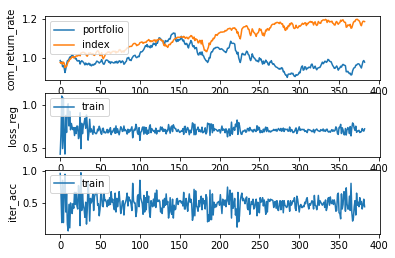

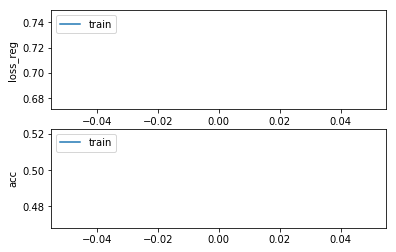

Epochs :  0 Iterations :  383 Loss :  0.7103970389297675 ACC :  0.4954692201966094 MCC :  nan Precision :  0.5033004858479994
mode : validation


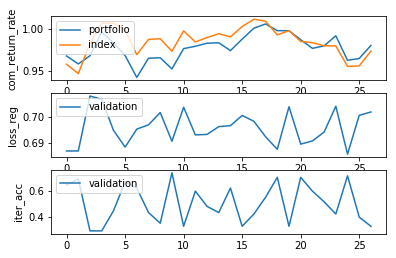

Epochs :  0 Iterations :  27 Loss :  0.6959582147774873 ACC :  0.5076252862259194 MCC :  nan Precision :  0.49104369141989285


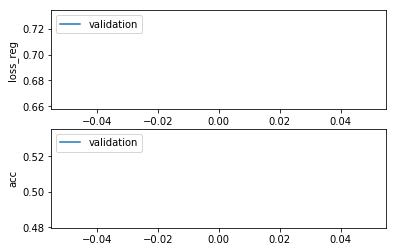

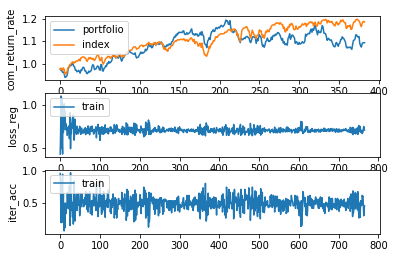

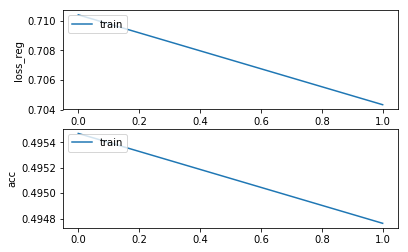

Epochs :  1 Iterations :  766 Loss :  0.7043339946251314 ACC :  0.49476272346301114 MCC :  -0.0005874241566694009 Precision :  0.5104771044504082
mode : validation


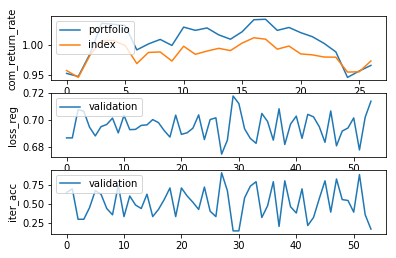

Epochs :  1 Iterations :  27 Loss :  0.6955464239473697 ACC :  0.5202614493944027 MCC :  nan Precision :  0.5053786915485505


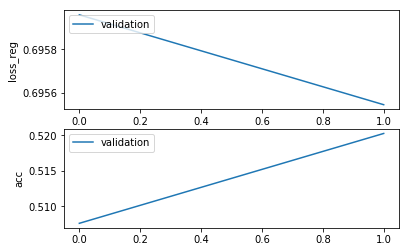

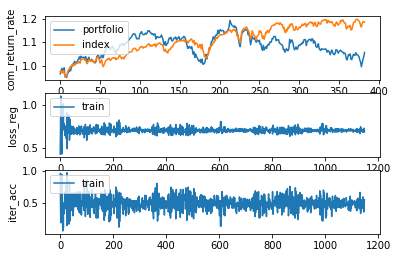

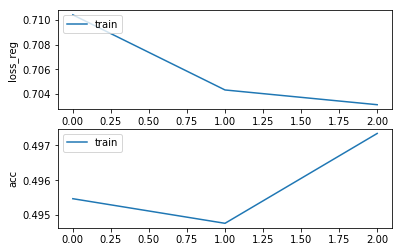

Epochs :  2 Iterations :  1149 Loss :  0.7031436486281551 ACC :  0.49734297297486435 MCC :  -0.0013442686701183725 Precision :  0.5111325821904927
mode : validation


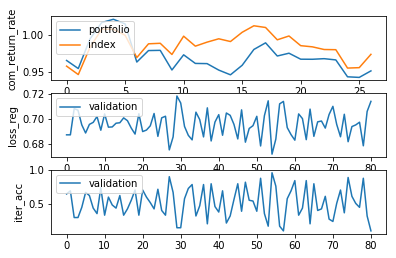

Epochs :  2 Iterations :  27 Loss :  0.6953609298776697 ACC :  0.5180827997348927 MCC :  nan Precision :  0.500956431583122


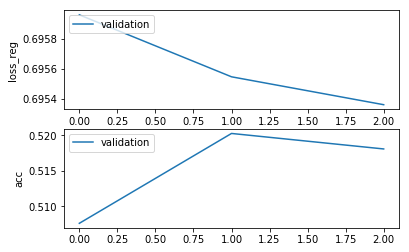

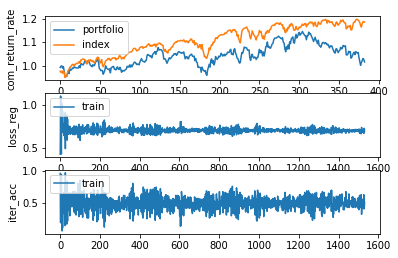

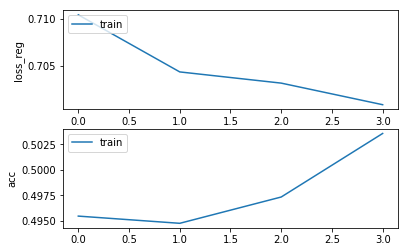

Epochs :  3 Iterations :  1532 Loss :  0.7008498905532976 ACC :  0.5035785744380079 MCC :  0.002788647853218593 Precision :  0.5131744413147863
mode : validation


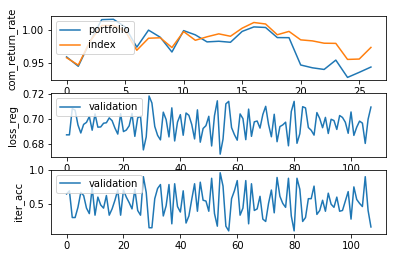

Epochs :  3 Iterations :  27 Loss :  0.6959275934431288 ACC :  0.516775612477903 MCC :  nan Precision :  0.4919291130370564


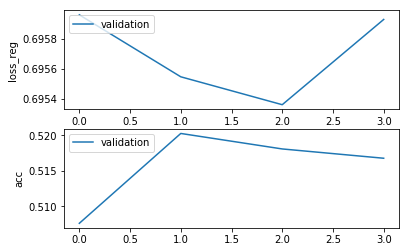

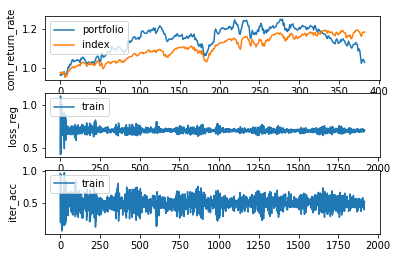

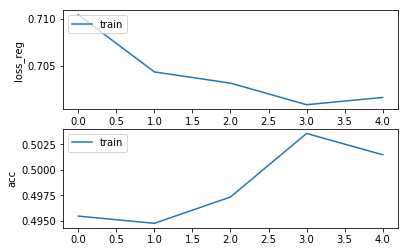

Epochs :  4 Iterations :  1915 Loss :  0.7016203320991277 ACC :  0.5014898023779647 MCC :  -0.0023967034522961953 Precision :  0.5109037124787703
mode : validation


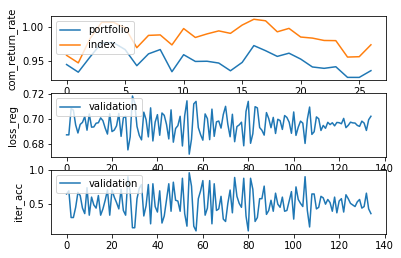

Epochs :  4 Iterations :  27 Loss :  0.6955812396826567 ACC :  0.5137255059348212 MCC :  nan Precision :  0.499870248414852


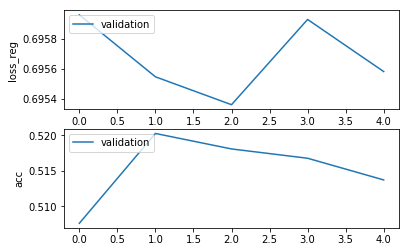

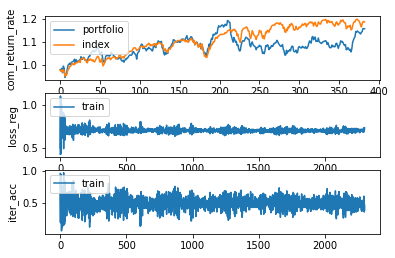

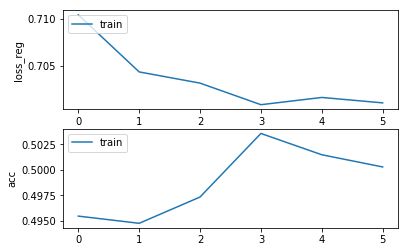

Epochs :  5 Iterations :  2298 Loss :  0.7010447347133029 ACC :  0.5002918290095915 MCC :  -0.0032212177944106997 Precision :  0.5098876484399831
mode : validation


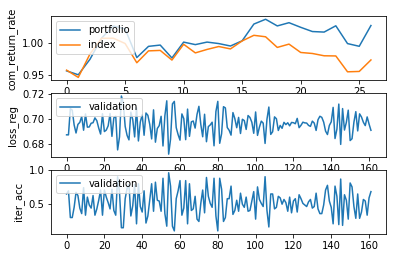

Epochs :  5 Iterations :  27 Loss :  0.6959161316906964 ACC :  0.5145969639221827 MCC :  nan Precision :  0.4968122155578048


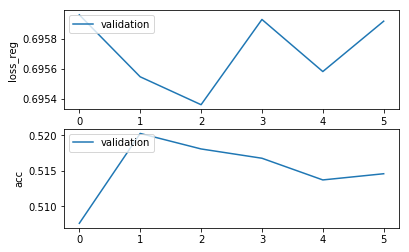

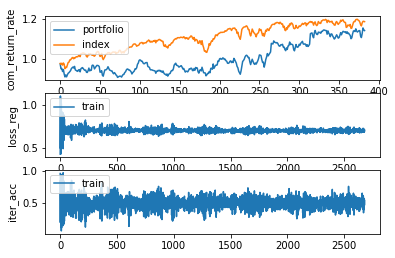

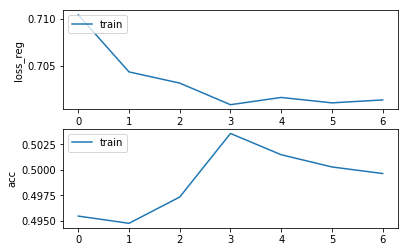

Epochs :  6 Iterations :  2681 Loss :  0.7013562637583083 ACC :  0.49964676622311066 MCC :  0.0004482565285983269 Precision :  0.5114611589955288
mode : validation


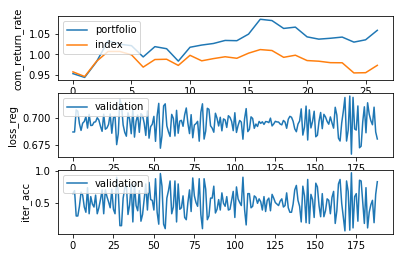

Epochs :  6 Iterations :  27 Loss :  0.6958473987049527 ACC :  0.4989106852423262 MCC :  nan Precision :  0.49118635844853187


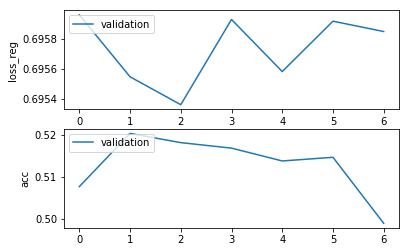

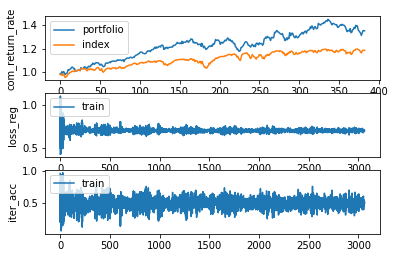

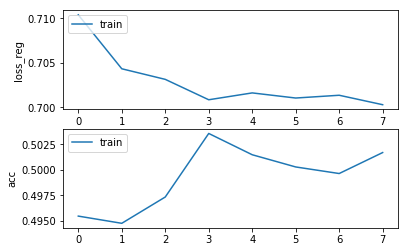

Epochs :  7 Iterations :  3064 Loss :  0.7002939896234955 ACC :  0.5017048227880393 MCC :  0.0017175778756331527 Precision :  0.5116275462611304
mode : validation


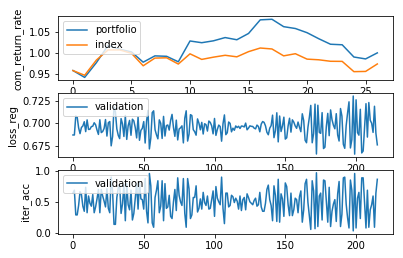

Epochs :  7 Iterations :  27 Loss :  0.6968068105203135 ACC :  0.4928104652574769 MCC :  nan Precision :  0.49112044605943894


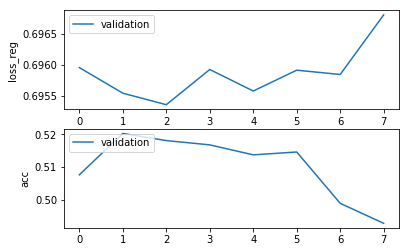

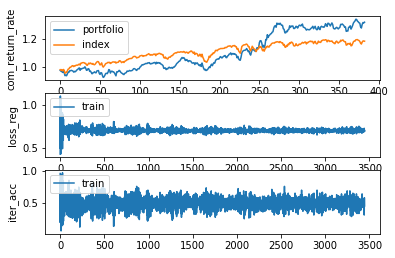

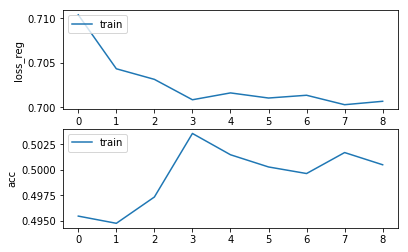

Epochs :  8 Iterations :  3447 Loss :  0.7006779059417565 ACC :  0.5005068494196661 MCC :  -0.009640753754158078 Precision :  0.5080861893844822
mode : validation


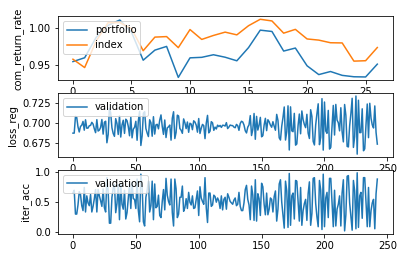

Epochs :  8 Iterations :  27 Loss :  0.6969018534377769 ACC :  0.4884531664558583 MCC :  nan Precision :  0.49065930396318436


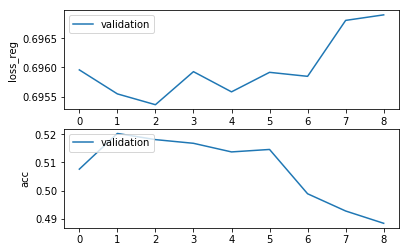

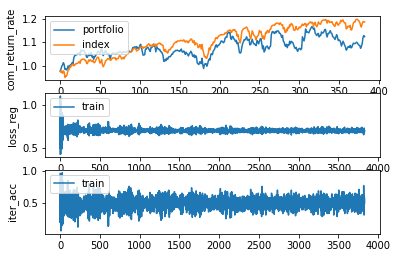

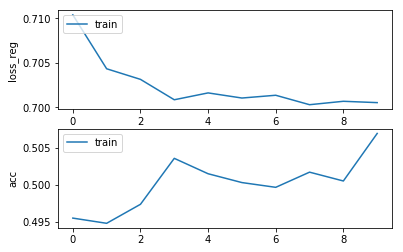

Epochs :  9 Iterations :  3830 Loss :  0.7005276234903162 ACC :  0.5069574723822641 MCC :  0.007043449016343851 Precision :  0.5144249836892356
mode : validation


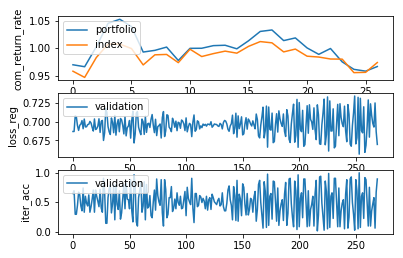

Epochs :  9 Iterations :  27 Loss :  0.696775906615787 ACC :  0.49542484370370704 MCC :  nan Precision :  0.49206465524103904


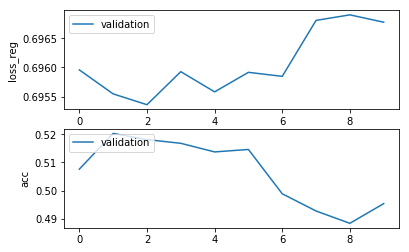

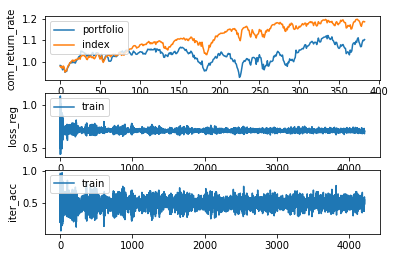

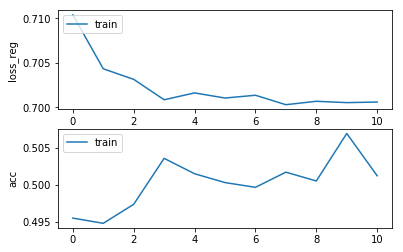

Epochs :  10 Iterations :  4213 Loss :  0.7005942387618221 ACC :  0.5012133468535799 MCC :  0.0013197578715316114 Precision :  0.5121202326280019
mode : validation


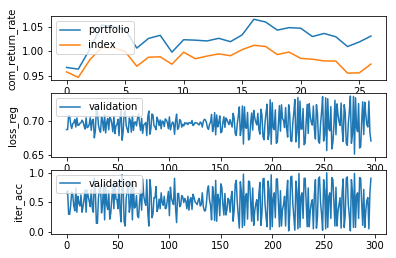

Epochs :  10 Iterations :  27 Loss :  0.6964849145324142 ACC :  0.49586057542236867 MCC :  nan Precision :  0.4910606206567199


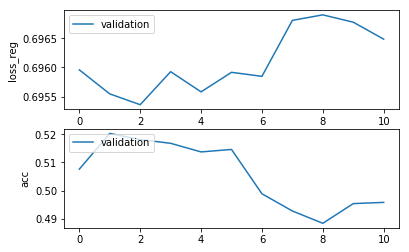

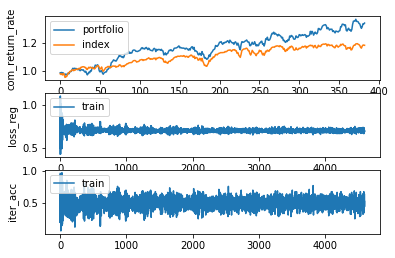

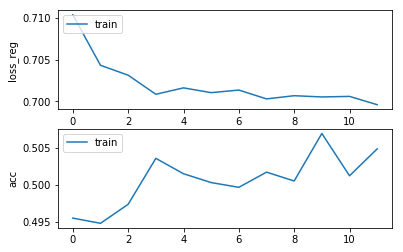

Epochs :  11 Iterations :  4596 Loss :  0.6995957557588582 ACC :  0.5048686991939345 MCC :  0.006287515114332664 Precision :  0.514068869932241
mode : validation


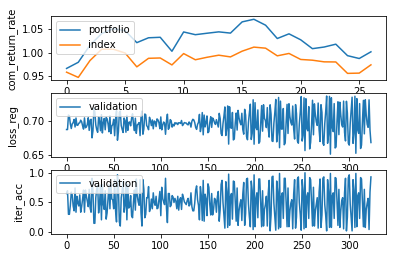

Epochs :  11 Iterations :  27 Loss :  0.6969269977675544 ACC :  0.492810464222674 MCC :  nan Precision :  0.49132216901138975


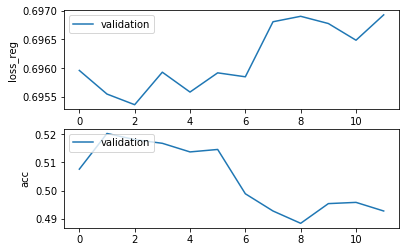

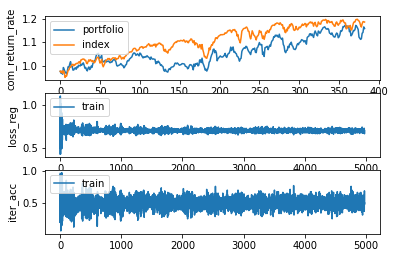

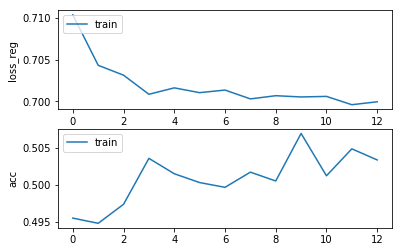

Epochs :  12 Iterations :  4979 Loss :  0.6999458922729791 ACC :  0.5033635531330856 MCC :  -0.0019226812595846837 Precision :  0.5105181151402837
mode : validation


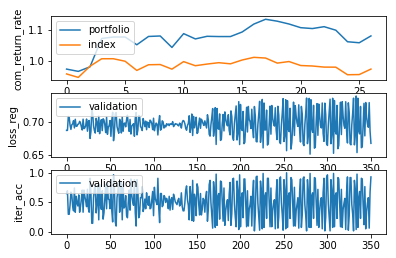

Epochs :  12 Iterations :  27 Loss :  0.6968884026562726 ACC :  0.4923747352634867 MCC :  nan Precision :  0.49223459318832113


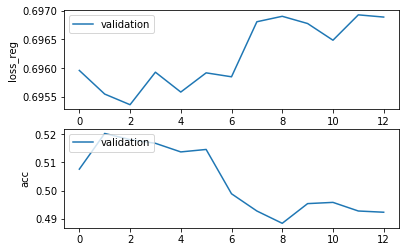

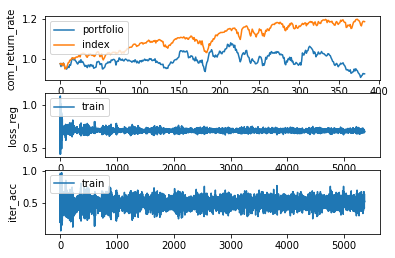

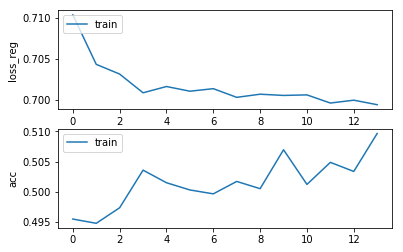

Epochs :  13 Iterations :  5362 Loss :  0.6993922242607834 ACC :  0.5096605902552294 MCC :  0.008325373268942775 Precision :  0.5146224517423864
mode : validation


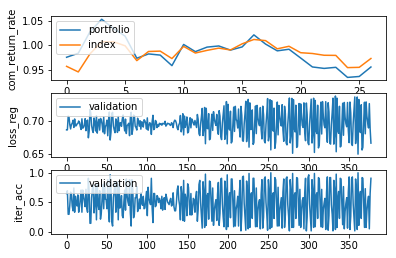

Epochs :  13 Iterations :  27 Loss :  0.6970013070989538 ACC :  0.49237473491855244 MCC :  nan Precision :  0.4916557353679781


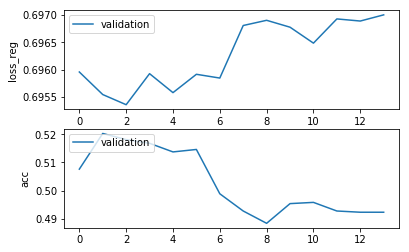

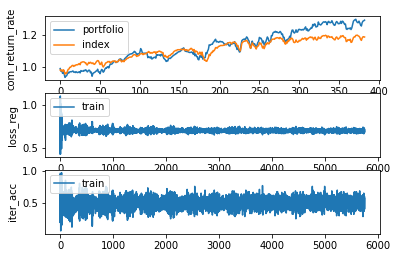

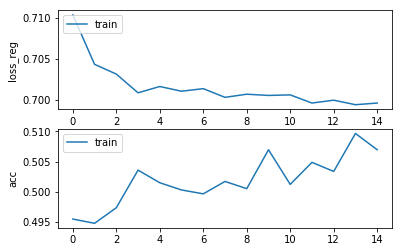

Epochs :  14 Iterations :  5745 Loss :  0.6995953025768071 ACC :  0.5069574723044512 MCC :  0.007261761209918989 Precision :  0.513998477211509
mode : validation


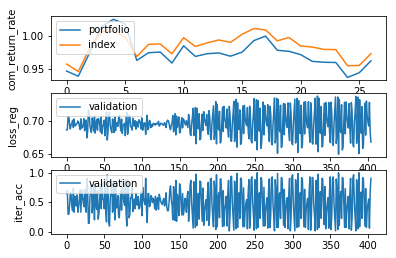

Epochs :  14 Iterations :  27 Loss :  0.6970759850961191 ACC :  0.49193900502804255 MCC :  nan Precision :  0.49123138078936823


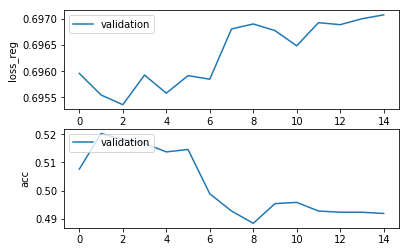

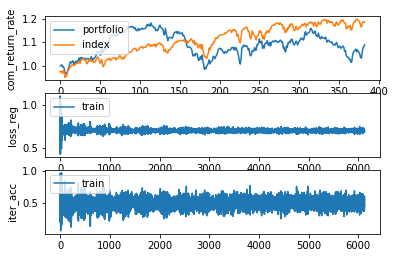

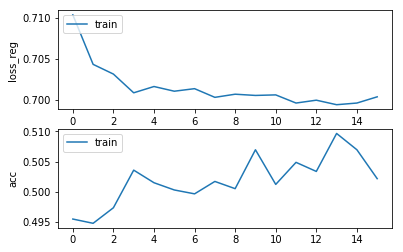

Epochs :  15 Iterations :  6128 Loss :  0.7003568759474991 ACC :  0.502165580931905 MCC :  0.0029801071868290245 Precision :  0.5123512336921053
mode : validation


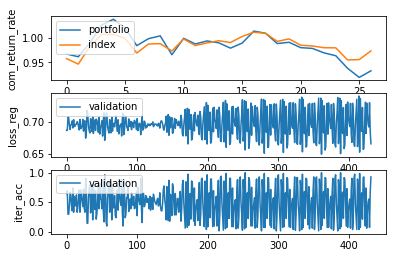

Epochs :  15 Iterations :  27 Loss :  0.6970705301673324 ACC :  0.49368192503849667 MCC :  nan Precision :  0.4917662710779243


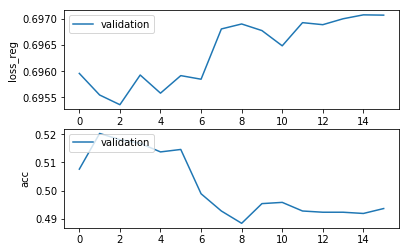

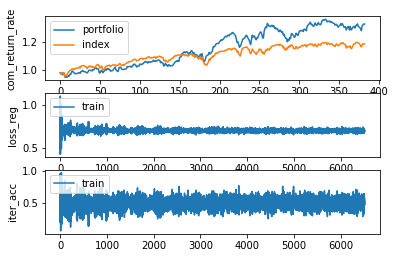

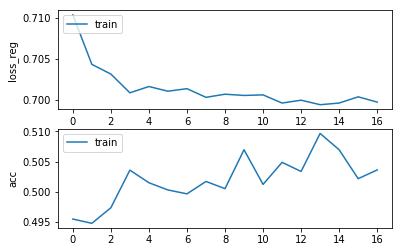

Epochs :  16 Iterations :  6511 Loss :  0.6997096879363994 ACC :  0.5036092916450052 MCC :  0.0003421235967587981 Precision :  0.5113603946054962
mode : validation


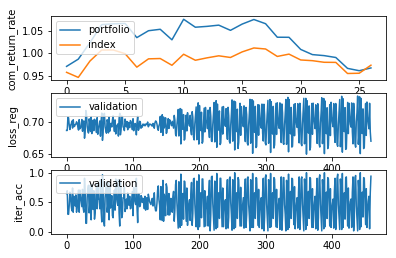

Epochs :  16 Iterations :  27 Loss :  0.6973175627213938 ACC :  0.49368192483153606 MCC :  nan Precision :  0.4909939234731374


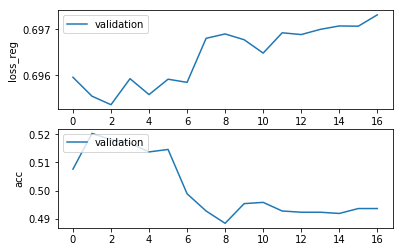

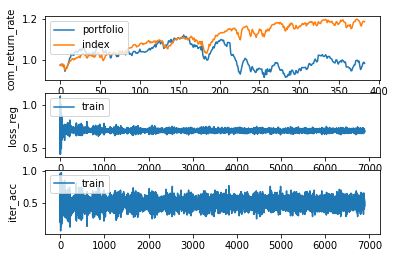

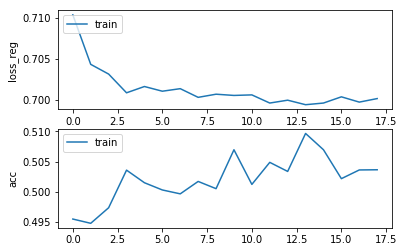

Epochs :  17 Iterations :  6894 Loss :  0.7001423298845715 ACC :  0.5036400088130961 MCC :  -0.003720579354892492 Precision :  0.5105266504125869
mode : validation


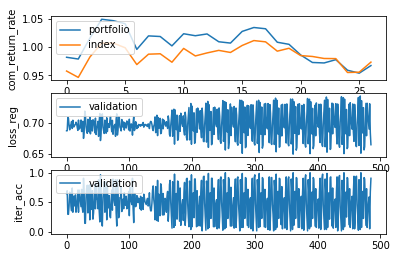

Epochs :  17 Iterations :  27 Loss :  0.6970217890209622 ACC :  0.4941176553429277 MCC :  nan Precision :  0.49143878605078767


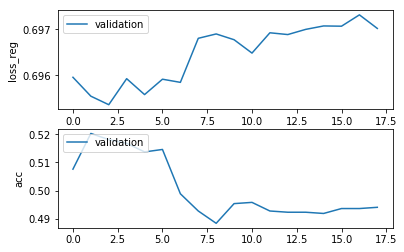

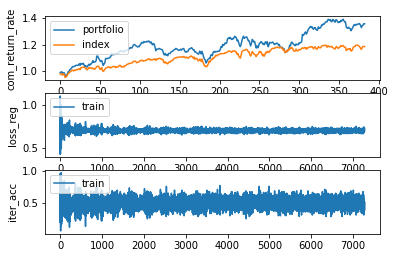

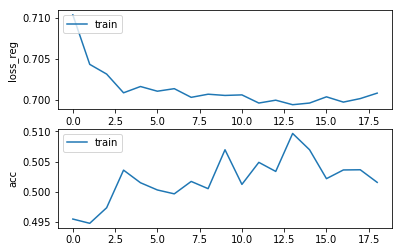

Epochs :  18 Iterations :  7277 Loss :  0.7008091832265531 ACC :  0.5015512362472694 MCC :  -0.003430534855252273 Precision :  0.510097098393322
mode : validation


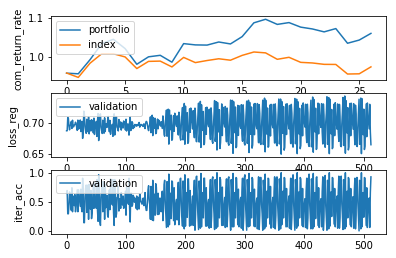

Epochs :  18 Iterations :  27 Loss :  0.6966695167400219 ACC :  0.490631816011888 MCC :  nan Precision :  0.49036158786879647


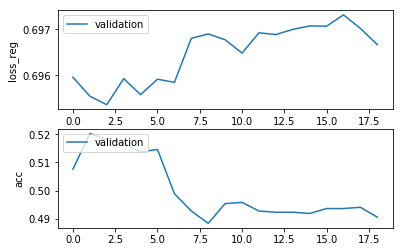

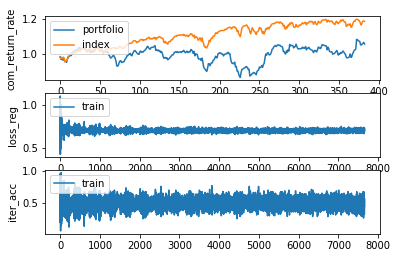

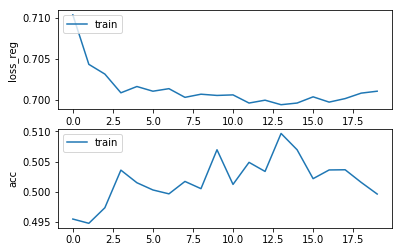

Epochs :  19 Iterations :  7660 Loss :  0.701046063912444 ACC :  0.4996160502222126 MCC :  -0.006306088577552307 Precision :  0.5100251485498782
mode : validation


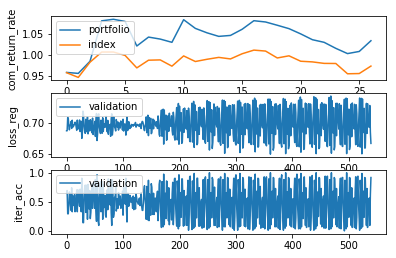

Epochs :  19 Iterations :  27 Loss :  0.6971673016194944 ACC :  0.4915032747236115 MCC :  nan Precision :  0.4898827505056505


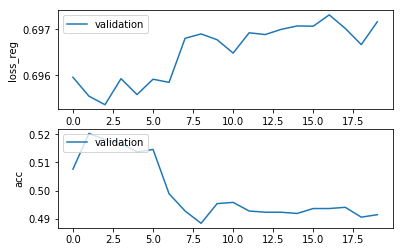

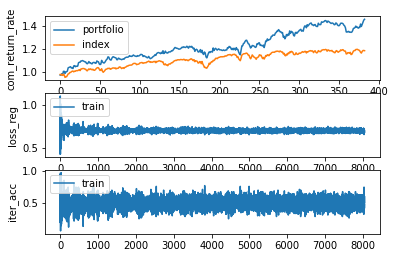

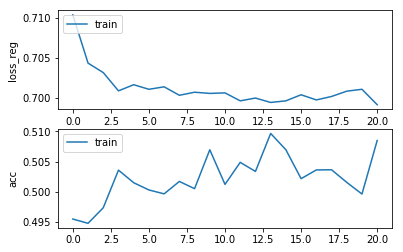

Epochs :  20 Iterations :  8043 Loss :  0.69910928661456 ACC :  0.5084933344440111 MCC :  0.012152269033820906 Precision :  0.5148097579574149
mode : validation


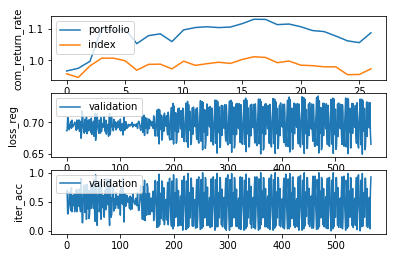

Epochs :  20 Iterations :  27 Loss :  0.6969212183245906 ACC :  0.49063181552898 MCC :  nan Precision :  0.4900605008006096


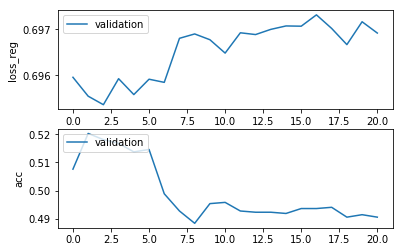

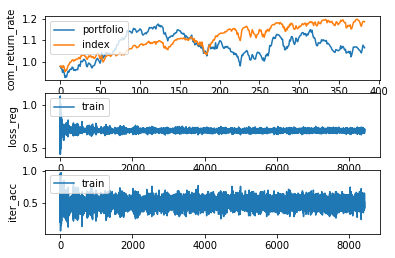

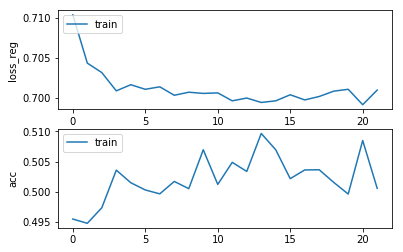

Epochs :  21 Iterations :  8426 Loss :  0.7009472400339092 ACC :  0.5005682830944385 MCC :  -0.009551323486605109 Precision :  0.5066609422897546
mode : validation


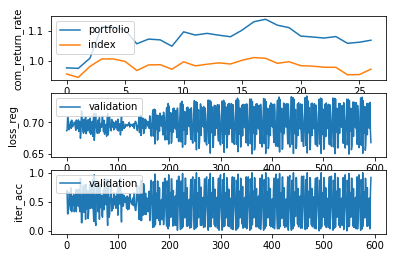

Epochs :  21 Iterations :  27 Loss :  0.6971271082207009 ACC :  0.4923747343666576 MCC :  nan Precision :  0.4909156727846022


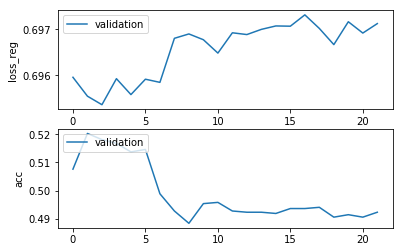

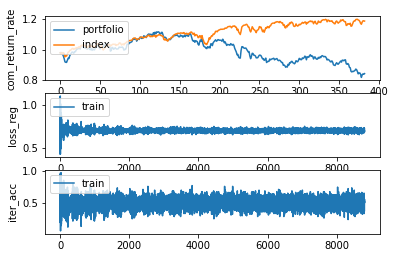

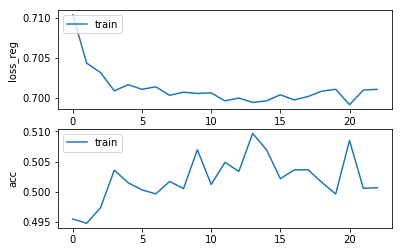

Epochs :  22 Iterations :  8809 Loss :  0.7010427730512993 ACC :  0.5006604364273131 MCC :  -0.00835523794966874 Precision :  0.5086616027137318
mode : validation


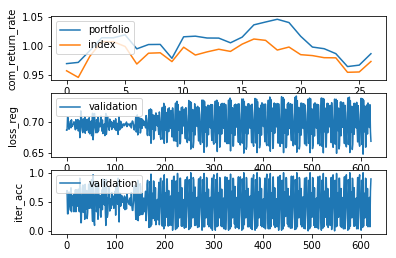

Epochs :  22 Iterations :  27 Loss :  0.696759268089577 ACC :  0.4919390052350031 MCC :  nan Precision :  0.490901576700034


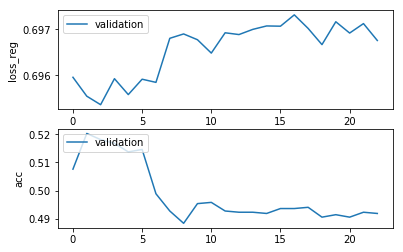

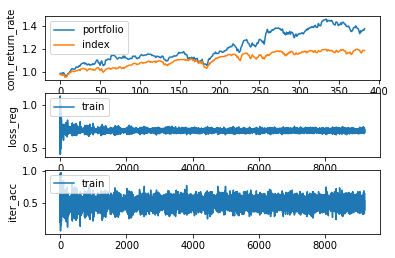

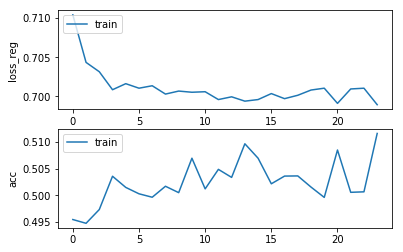

Epochs :  23 Iterations :  9192 Loss :  0.6989394930573107 ACC :  0.511595777914356 MCC :  0.013489985795066675 Precision :  0.517218722794059
mode : validation


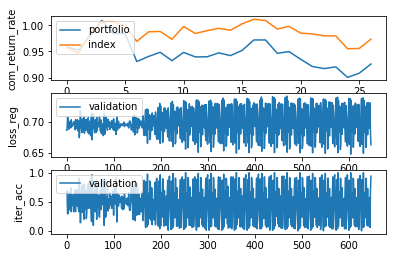

Epochs :  23 Iterations :  27 Loss :  0.6966361226858916 ACC :  0.49324619501001304 MCC :  nan Precision :  0.4918497937421004


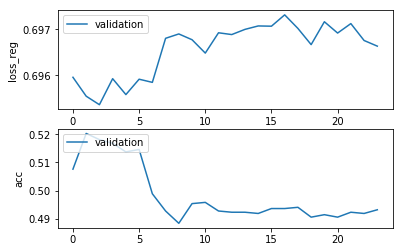

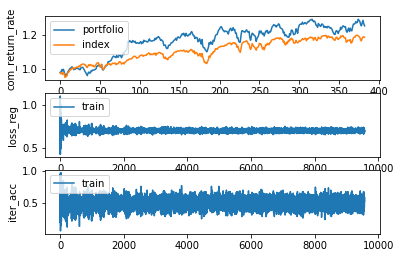

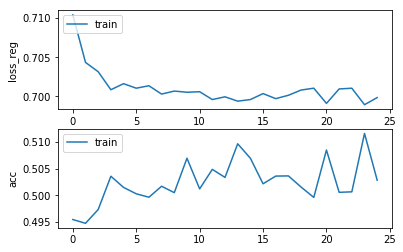

Epochs :  24 Iterations :  9575 Loss :  0.6998481601087605 ACC :  0.502841361197728 MCC :  0.0006150680171038867 Precision :  0.5114829578137818
mode : validation


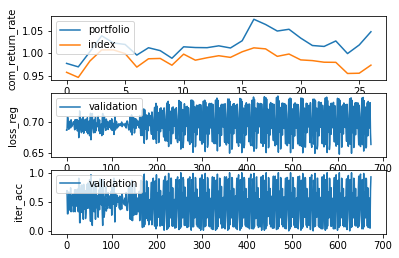

Epochs :  24 Iterations :  27 Loss :  0.6971766352653503 ACC :  0.4954248437726939 MCC :  nan Precision :  0.4912977007528146


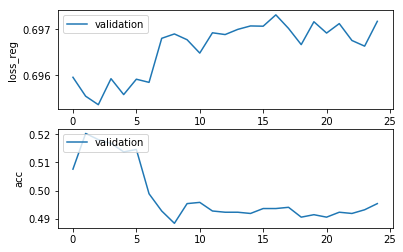

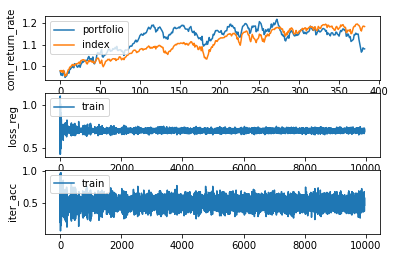

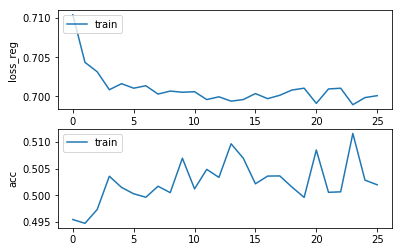

Epochs :  25 Iterations :  9958 Loss :  0.7000906651076075 ACC :  0.5019812776899213 MCC :  -0.004232759029402668 Precision :  0.5095295695437231
mode : validation


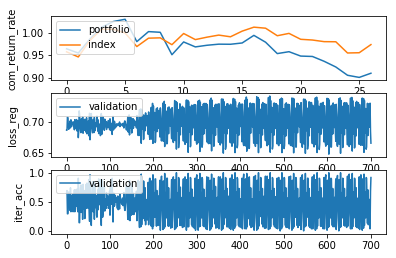

Epochs :  25 Iterations :  27 Loss :  0.6968218772499649 ACC :  0.49411765385971024 MCC :  nan Precision :  0.4913316680877297


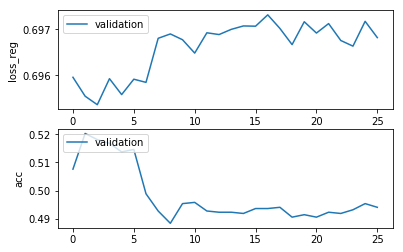

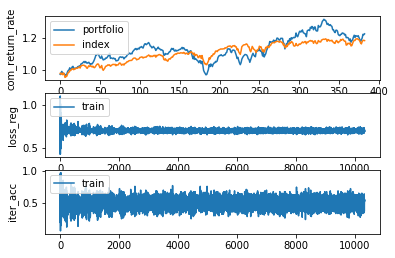

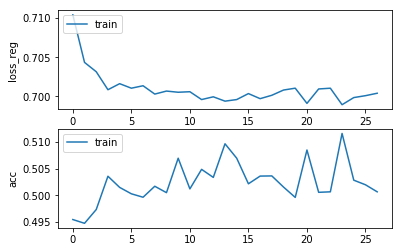

Epochs :  26 Iterations :  10341 Loss :  0.7004011569072932 ACC :  0.5006604362716874 MCC :  -0.005490677962237701 Precision :  0.510507275313917
mode : validation


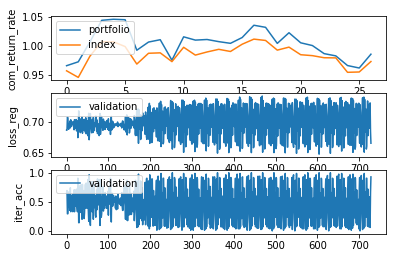

Epochs :  26 Iterations :  27 Loss :  0.6971790658103095 ACC :  0.4910675447986082 MCC :  nan Precision :  0.4902783403242076


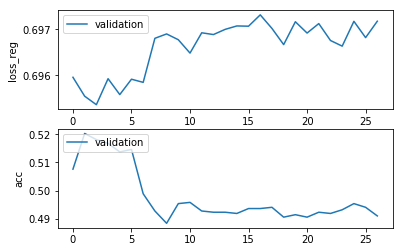

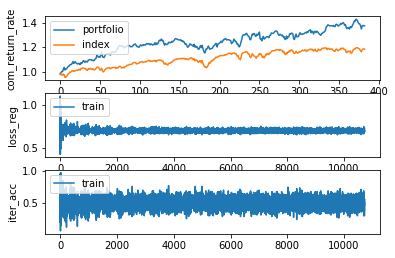

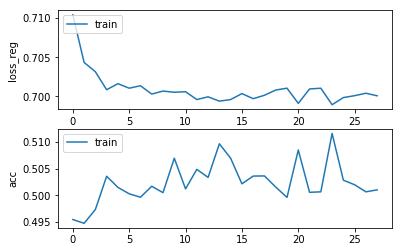

Epochs :  27 Iterations :  10724 Loss :  0.7000743791888961 ACC :  0.5010290433781577 MCC :  -0.0016771128970166722 Precision :  0.5098187795283355
mode : validation


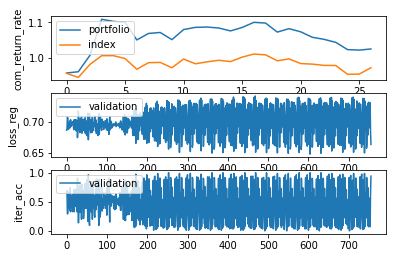

Epochs :  27 Iterations :  27 Loss :  0.6973092533923961 ACC :  0.49019608543150955 MCC :  nan Precision :  0.48985981154772973


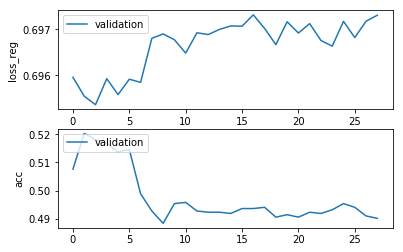

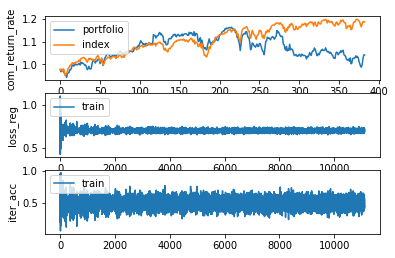

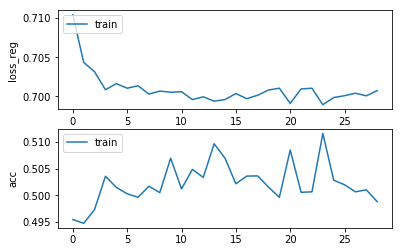

Epochs :  28 Iterations :  11107 Loss :  0.7007371464223837 ACC :  0.49881740058371044 MCC :  -0.009172160092099296 Precision :  0.5082786153787966
mode : validation


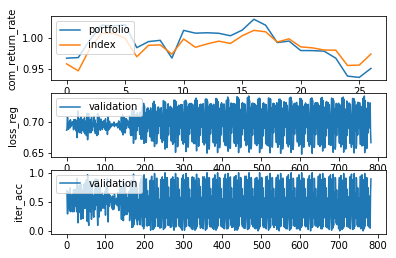

Epochs :  28 Iterations :  27 Loss :  0.6971745137815122 ACC :  0.4897603559549208 MCC :  nan Precision :  0.4897357163329919


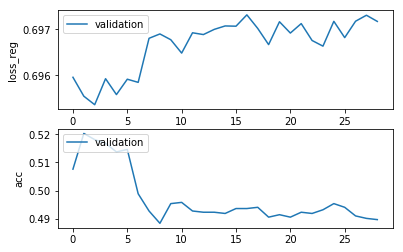

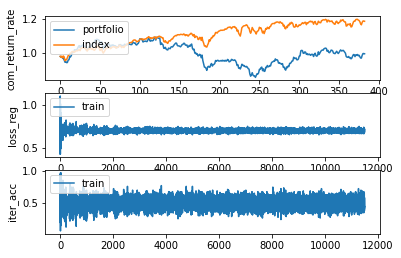

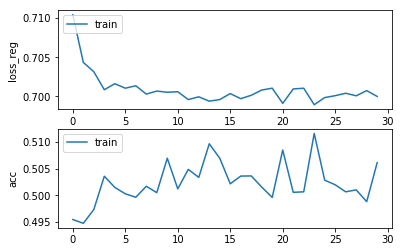

Epochs :  29 Iterations :  11490 Loss :  0.6999918332921619 ACC :  0.5061281061203611 MCC :  0.006825171254955806 Precision :  0.5142060279038883
mode : validation


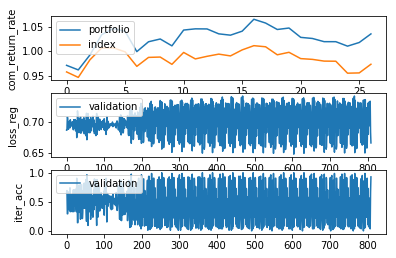

Epochs :  29 Iterations :  27 Loss :  0.6972989108827379 ACC :  0.4893246254435292 MCC :  nan Precision :  0.48973857542430915


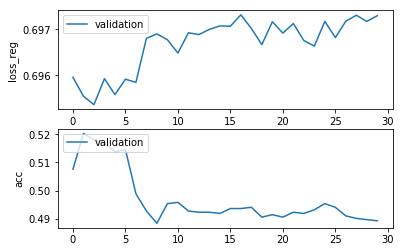

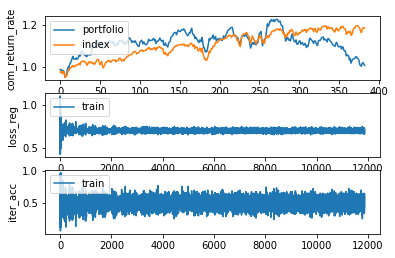

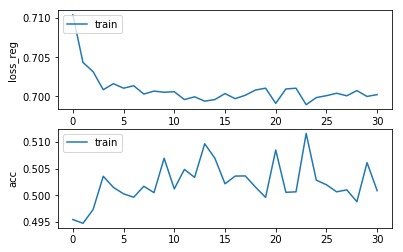

Epochs :  30 Iterations :  11873 Loss :  0.7002309209061665 ACC :  0.500875456681762 MCC :  -0.00038060752763692535 Precision :  0.5115929525102398
mode : validation


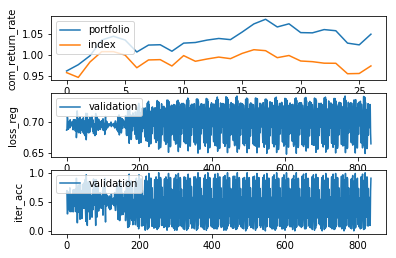

Epochs :  30 Iterations :  27 Loss :  0.6963936421606276 ACC :  0.49673203496193447 MCC :  nan Precision :  0.49214904106877466


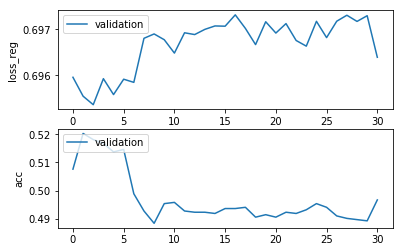

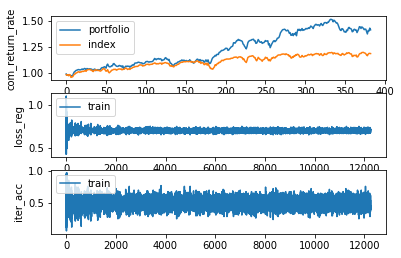

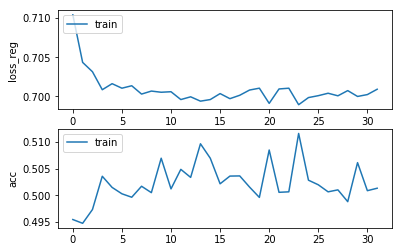

Epochs :  31 Iterations :  12256 Loss :  0.7009120633334466 ACC :  0.5013362149034406 MCC :  -0.00417641732402817 Precision :  0.509991668884499
mode : validation


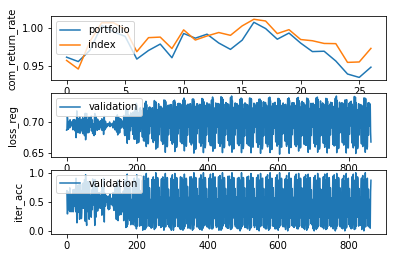

Epochs :  31 Iterations :  27 Loss :  0.6970886212808115 ACC :  0.4888888958289667 MCC :  nan Precision :  0.4905160432336507


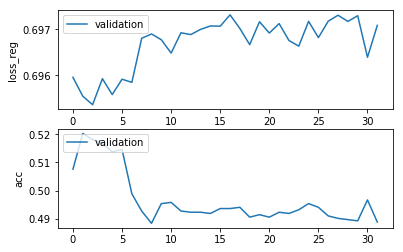

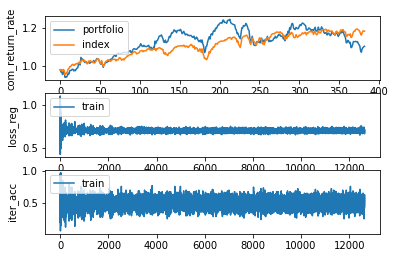

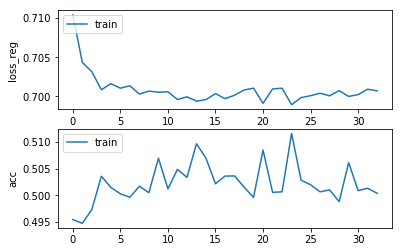

Epochs :  32 Iterations :  12639 Loss :  0.7007064431827934 ACC :  0.5003839809029282 MCC :  -0.0025942705865881306 Precision :  0.5103083056332082
mode : validation


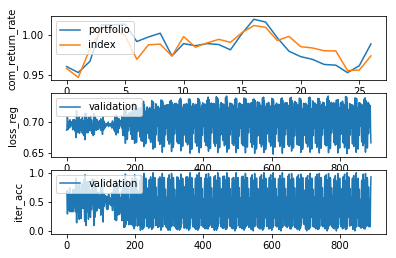

Epochs :  32 Iterations :  27 Loss :  0.6970998446146647 ACC :  0.49193900478658853 MCC :  nan Precision :  0.4902844885709109


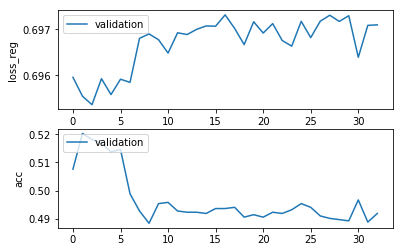

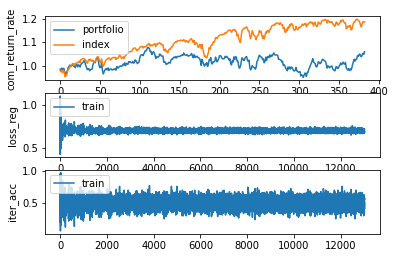

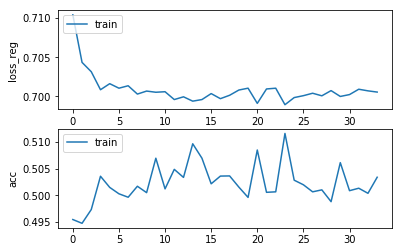

Epochs :  33 Iterations :  13022 Loss :  0.700549210798647 ACC :  0.5033942713905564 MCC :  -0.003156799031847081 Precision :  0.5110444471084418
mode : validation


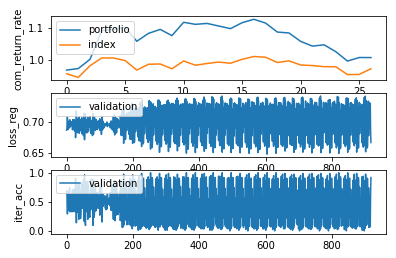

Epochs :  33 Iterations :  27 Loss :  0.6972758725837425 ACC :  0.4910675453160096 MCC :  nan Precision :  0.49062661178134104


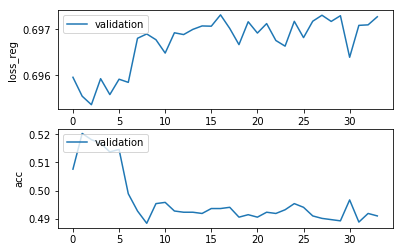

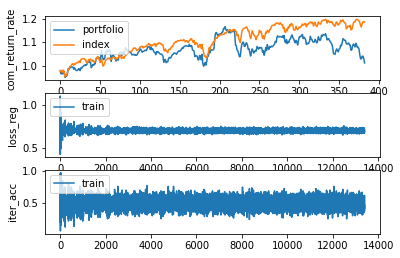

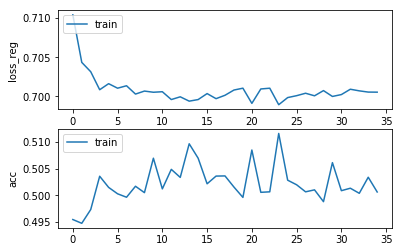

Epochs :  34 Iterations :  13405 Loss :  0.7005384923895096 ACC :  0.500629718870158 MCC :  -0.0030289635693839224 Precision :  0.5090999814436112
mode : validation


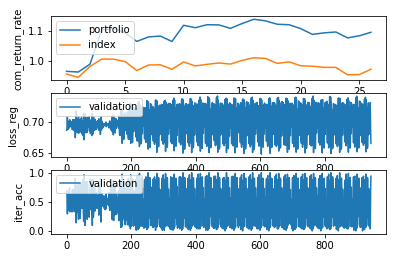

Epochs :  34 Iterations :  27 Loss :  0.69748412238227 ACC :  0.4915032751720261 MCC :  nan Precision :  0.4914416226523894


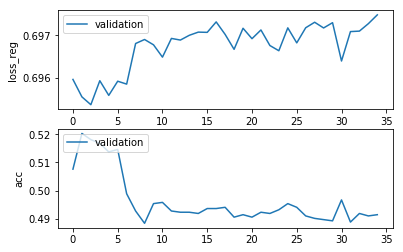

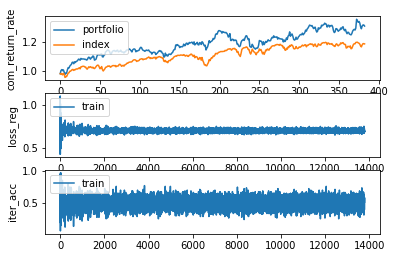

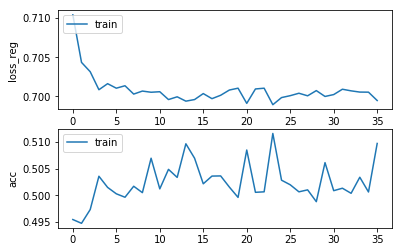

Epochs :  35 Iterations :  13788 Loss :  0.6994723537572058 ACC :  0.5097220250582882 MCC :  0.017599695756686146 Precision :  0.518274210797083
mode : validation


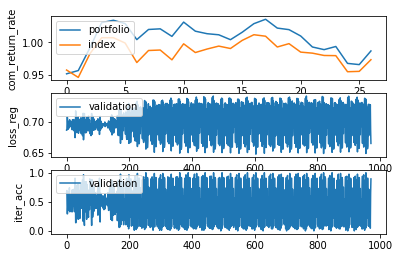

Epochs :  35 Iterations :  27 Loss :  0.696932973685088 ACC :  0.48671024668685814 MCC :  nan Precision :  0.4893096515701877


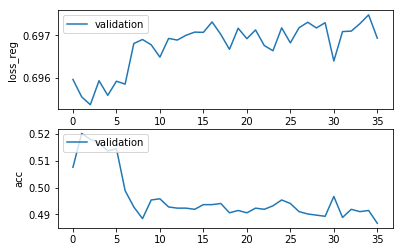

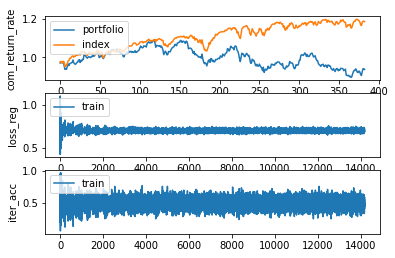

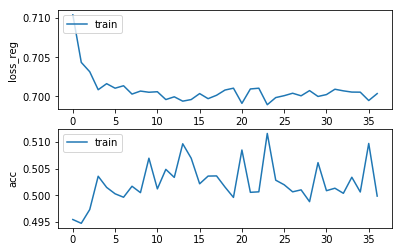

Epochs :  36 Iterations :  14171 Loss :  0.7003552384538376 ACC :  0.4998617872556881 MCC :  -0.0033218811114753936 Precision :  0.5088052410710184
mode : validation


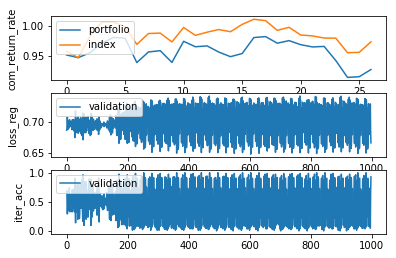

Epochs :  36 Iterations :  27 Loss :  0.6966778635978699 ACC :  0.4958605748359804 MCC :  nan Precision :  0.49205007942186463


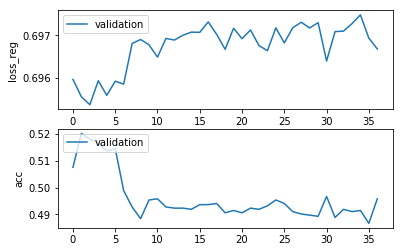

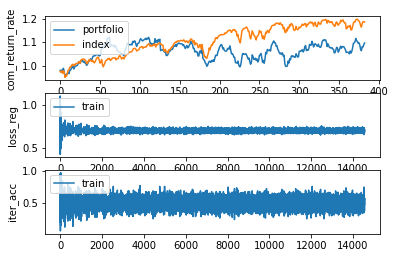

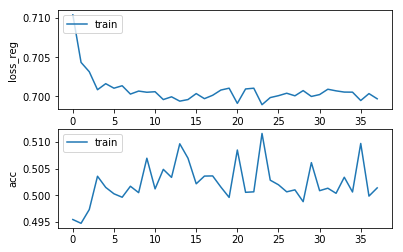

Epochs :  37 Iterations :  14554 Loss :  0.6996930776937201 ACC :  0.5013976498621251 MCC :  0.001665396337590713 Precision :  0.5120424743128974
mode : validation


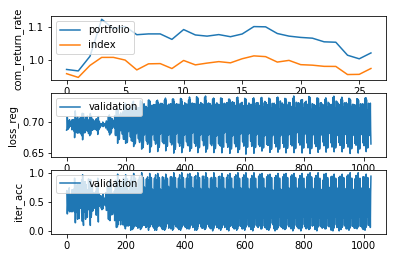

Epochs :  37 Iterations :  27 Loss :  0.6967782841788398 ACC :  0.49760349270784193 MCC :  nan Precision :  0.492582756612036


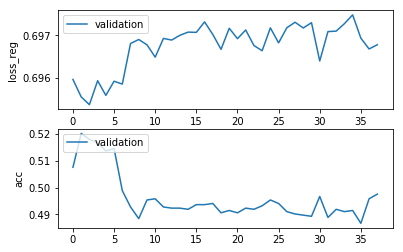

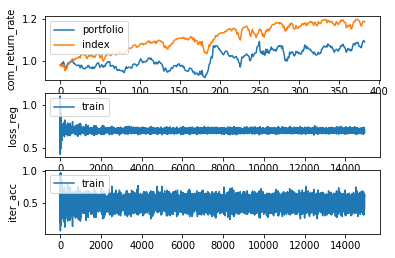

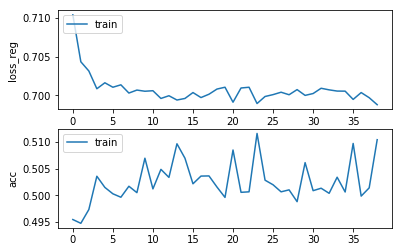

Epochs :  38 Iterations :  14937 Loss :  0.6987876185549146 ACC :  0.5104285216362607 MCC :  0.011607497740857906 Precision :  0.5155350139933607
mode : validation


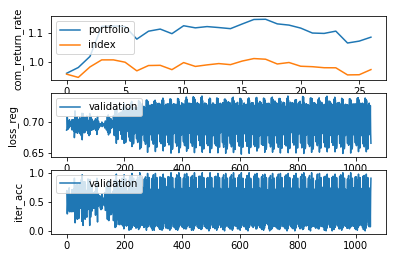

Epochs :  38 Iterations :  27 Loss :  0.6967393358548483 ACC :  0.4923747346770984 MCC :  nan Precision :  0.4912302445758272


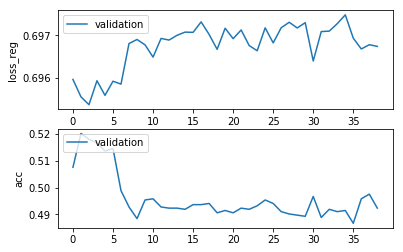

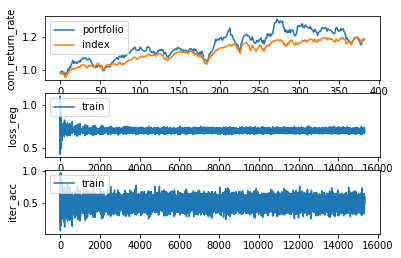

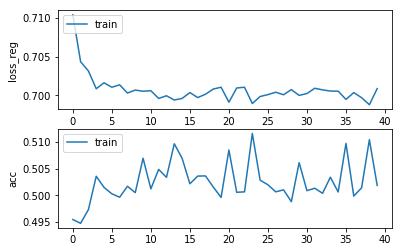

Epochs :  39 Iterations :  15320 Loss :  0.7008651672393161 ACC :  0.5018584090953707 MCC :  -0.00277087852017171 Precision :  0.5104309965664273
mode : validation


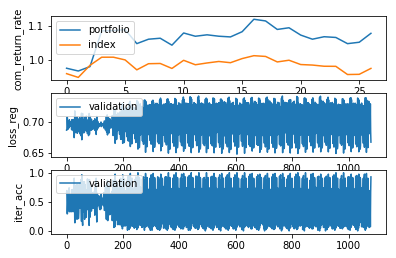

Epochs :  39 Iterations :  27 Loss :  0.6970483484091582 ACC :  0.4893246261678912 MCC :  nan Precision :  0.48933511158382453


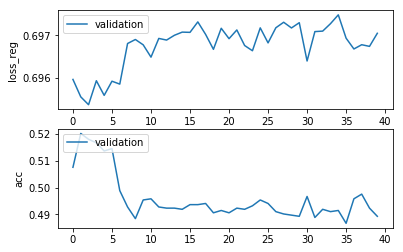

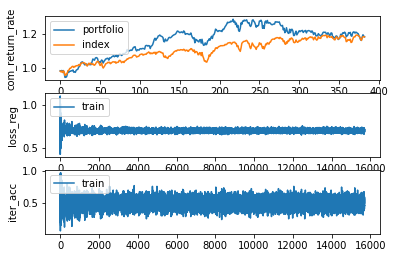

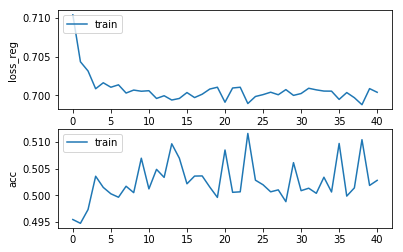

Epochs :  40 Iterations :  15703 Loss :  0.7003912549106011 ACC :  0.5028106432515087 MCC :  0.0031136258109533484 Precision :  0.5125855032461586
mode : validation


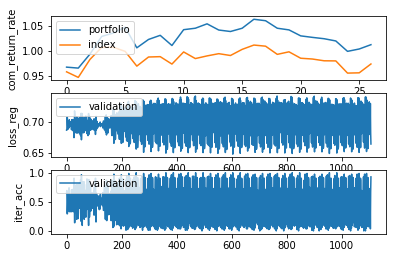

Epochs :  40 Iterations :  27 Loss :  0.6971845008708812 ACC :  0.490196086190365 MCC :  nan Precision :  0.49046121661861736


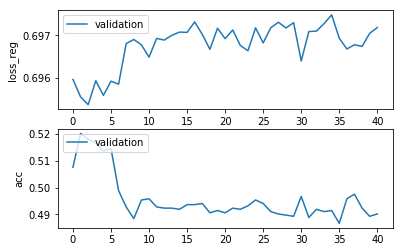

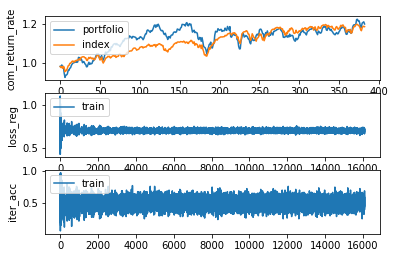

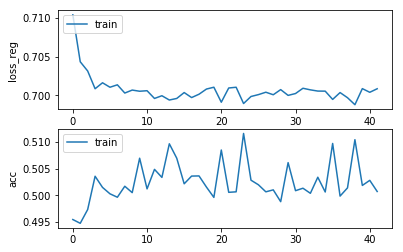

Epochs :  41 Iterations :  16086 Loss :  0.7008488557979893 ACC :  0.5007218697519278 MCC :  -0.003305433782464375 Precision :  0.5100471211485468
mode : validation


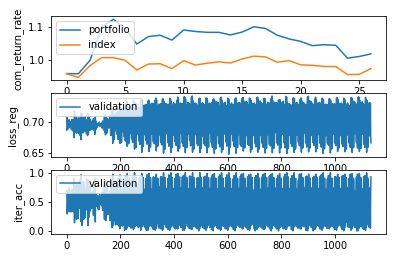

Epochs :  41 Iterations :  27 Loss :  0.6968660464993229 ACC :  0.4936819241761609 MCC :  nan Precision :  0.49147079553869033


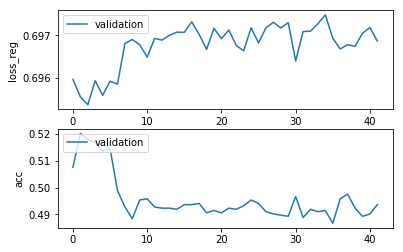

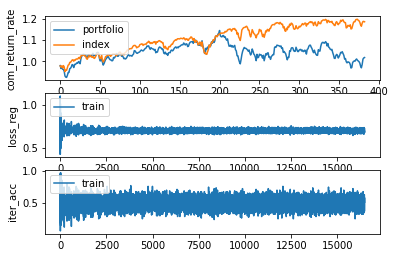

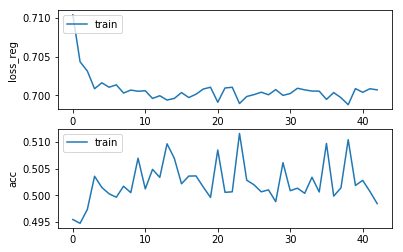

Epochs :  42 Iterations :  16469 Loss :  0.7007040235143418 ACC :  0.4984487934772402 MCC :  -0.007433596317286727 Precision :  0.5084148095361402
mode : validation


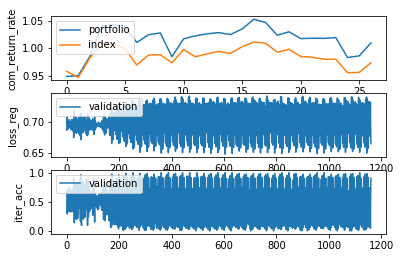

Epochs :  42 Iterations :  27 Loss :  0.6968141948735272 ACC :  0.49150327451665093 MCC :  nan Precision :  0.4910571430292394


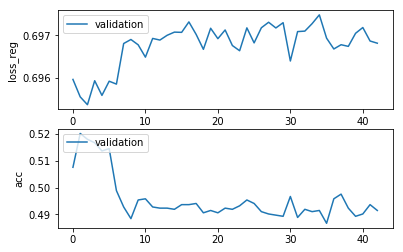

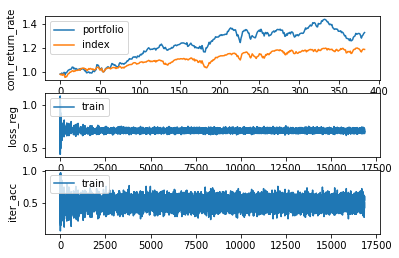

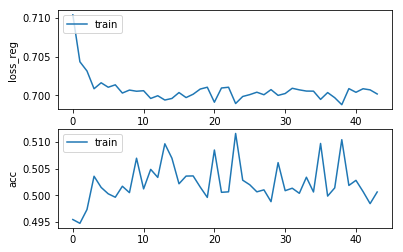

Epochs :  43 Iterations :  16852 Loss :  0.7001738585628977 ACC :  0.5006297184810937 MCC :  -0.0021711424082473856 Precision :  0.5106571310494027
mode : validation


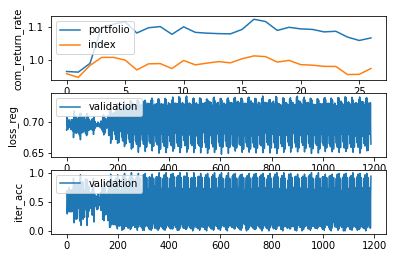

Epochs :  43 Iterations :  27 Loss :  0.6967904059975235 ACC :  0.4945533838537004 MCC :  nan Precision :  0.49235597239048395


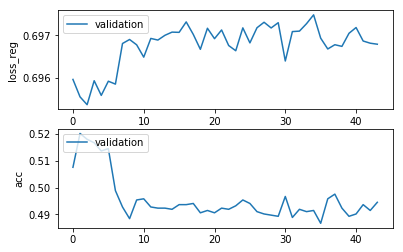

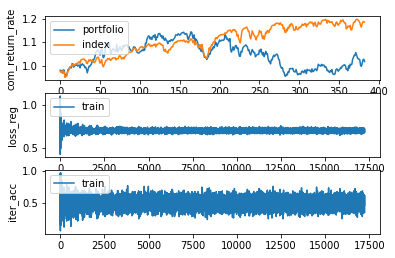

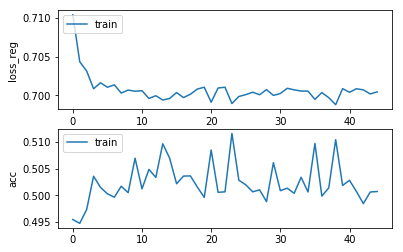

Epochs :  44 Iterations :  17235 Loss :  0.7004454772403906 ACC :  0.5007218702188049 MCC :  -0.0016558238327340283 Precision :  0.5103729790266283
mode : validation


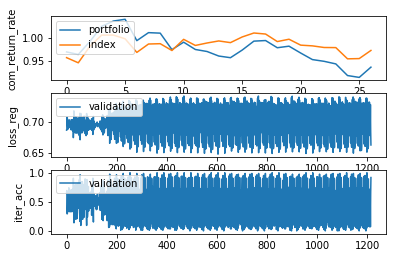

Epochs :  44 Iterations :  27 Loss :  0.6970997055371603 ACC :  0.4923747355739276 MCC :  nan Precision :  0.49141979645247813


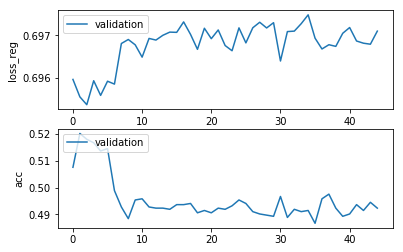

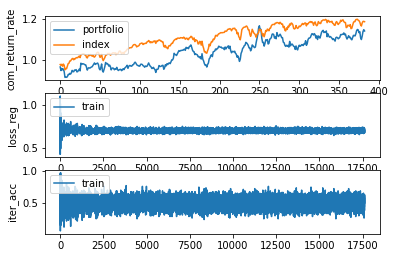

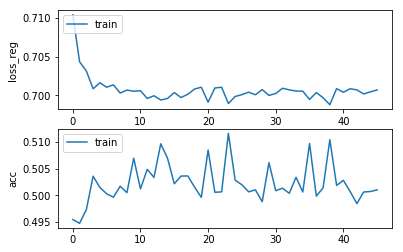

Epochs :  45 Iterations :  17618 Loss :  0.7006944961087199 ACC :  0.5010290427556549 MCC :  -0.002369138442573208 Precision :  0.5105621954158688
mode : validation


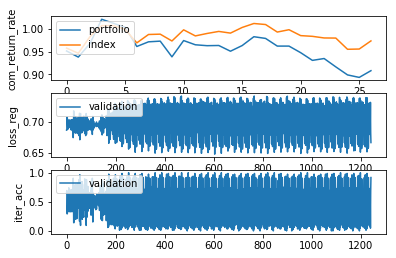

Epochs :  45 Iterations :  27 Loss :  0.6970974692591915 ACC :  0.49411765420464454 MCC :  nan Precision :  0.49187265267526664


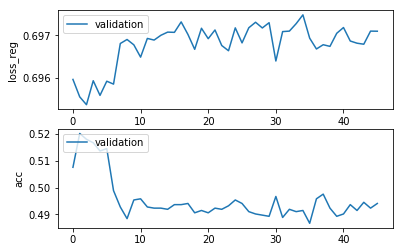

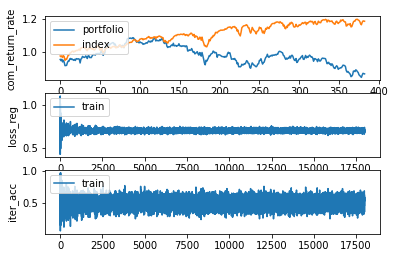

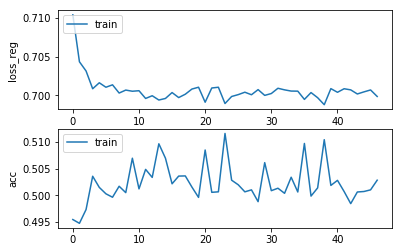

Epochs :  46 Iterations :  18001 Loss :  0.6998511417416307 ACC :  0.5028413604974125 MCC :  -0.0032016466067454658 Precision :  0.5107476532109101
mode : validation


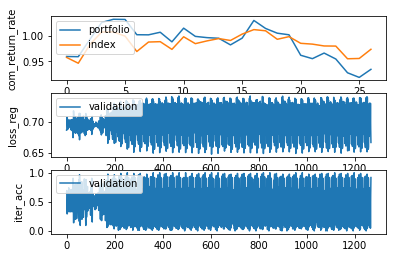

Epochs :  46 Iterations :  27 Loss :  0.6978402181907937 ACC :  0.48888889610491415 MCC :  nan Precision :  0.49065678138975743


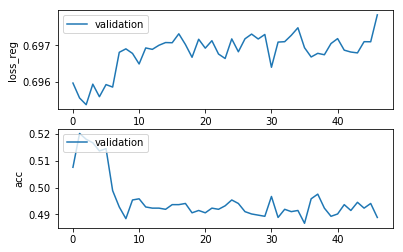

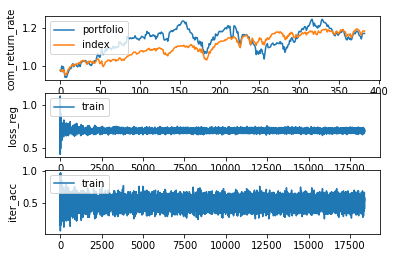

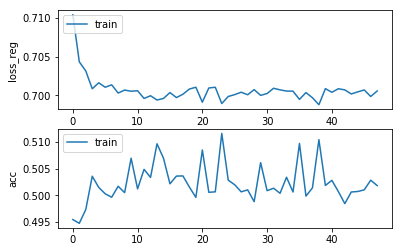

Epochs :  47 Iterations :  18384 Loss :  0.7005596195126327 ACC :  0.5018276917716542 MCC :  0.00043457097406730095 Precision :  0.5117891276396286
mode : validation


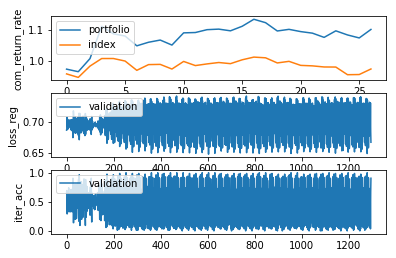

Epochs :  47 Iterations :  27 Loss :  0.6970709805135373 ACC :  0.48627451672736144 MCC :  nan Precision :  0.4886131086559207


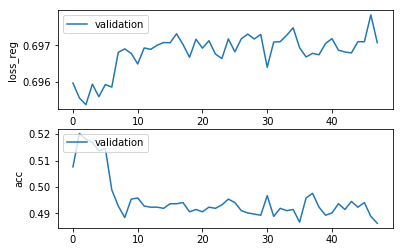

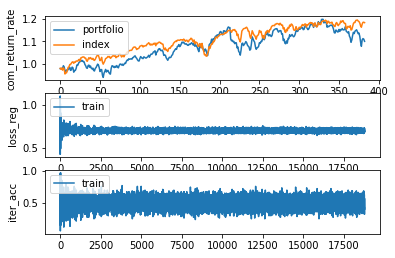

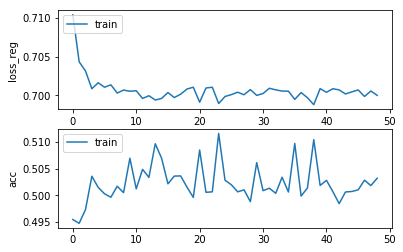

Epochs :  48 Iterations :  18767 Loss :  0.6999914222846766 ACC :  0.5032099676816956 MCC :  -0.00458960778289049 Precision :  0.510199811051821
mode : validation


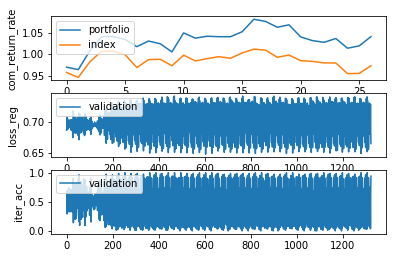

Epochs :  48 Iterations :  27 Loss :  0.696871675826885 ACC :  0.49324619404419706 MCC :  nan Precision :  0.49130899528110467


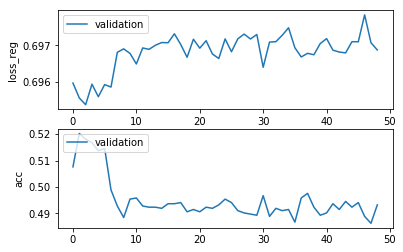

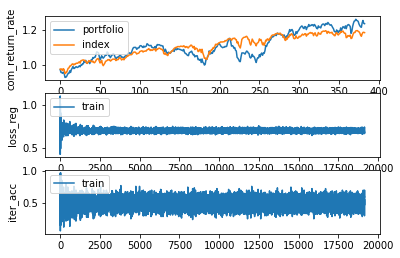

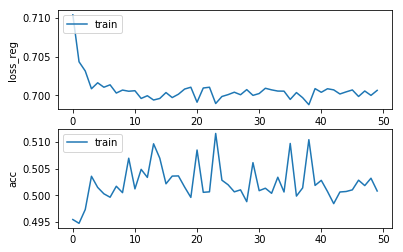

Epochs :  49 Iterations :  19150 Loss :  0.7006411774973956 ACC :  0.5008140211783875 MCC :  -0.005753193626924376 Precision :  0.5087497421241227
mode : validation


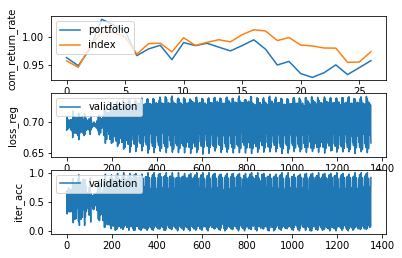

Epochs :  49 Iterations :  27 Loss :  0.6968578872857271 ACC :  0.49498911333028917 MCC :  nan Precision :  0.4908452120920022


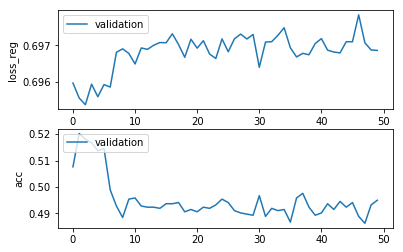

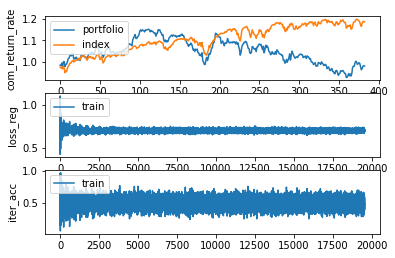

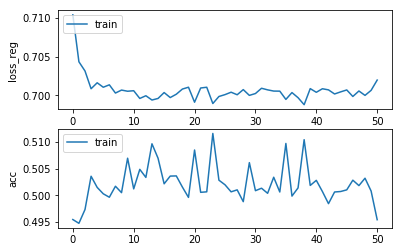

Epochs :  50 Iterations :  19533 Loss :  0.7019709645923684 ACC :  0.495438503067425 MCC :  -0.009524233671459648 Precision :  0.5072575882855346
mode : validation


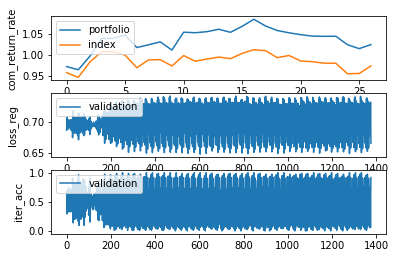

Epochs :  50 Iterations :  27 Loss :  0.6969160945327194 ACC :  0.49150327451665093 MCC :  nan Precision :  0.49097360629174447


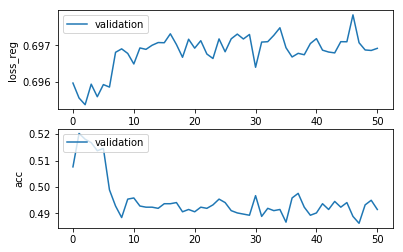

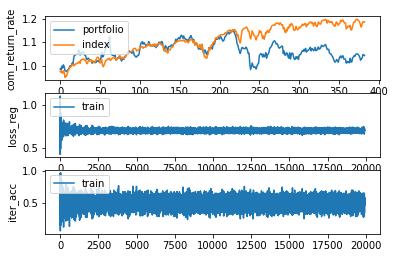

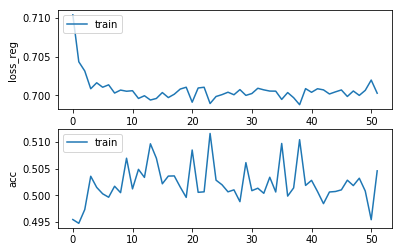

Epochs :  51 Iterations :  19916 Loss :  0.7002717163170598 ACC :  0.5045922439029883 MCC :  1.4999744910309116e-06 Precision :  0.5123369871363939
mode : validation


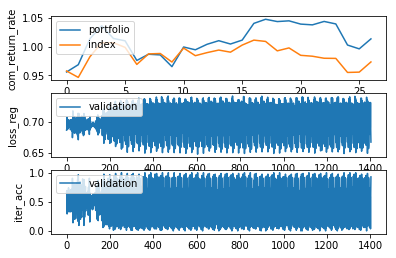

Epochs :  51 Iterations :  27 Loss :  0.6967475480503507 ACC :  0.49498911450306576 MCC :  nan Precision :  0.4919021804299619


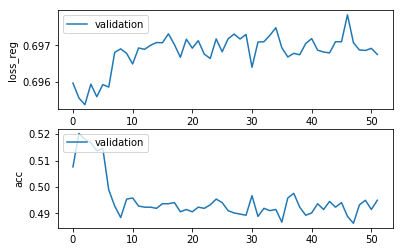

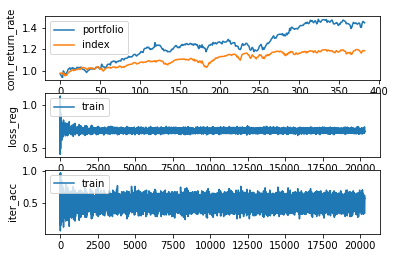

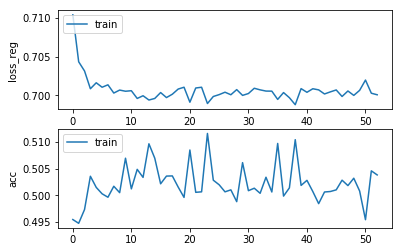

Epochs :  52 Iterations :  20299 Loss :  0.7000696833388924 ACC :  0.5038243118994541 MCC :  0.00025896228410366817 Precision :  0.5112453906726355
mode : validation


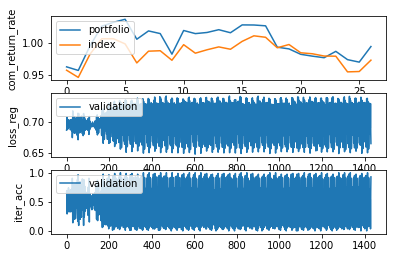

Epochs :  52 Iterations :  27 Loss :  0.6963362163967557 ACC :  0.49193900506253596 MCC :  nan Precision :  0.4904387551877234


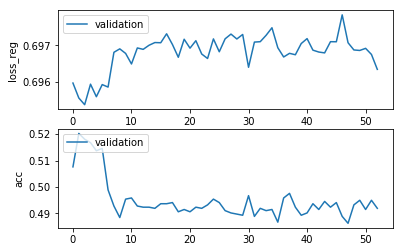

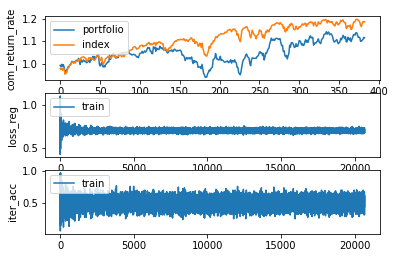

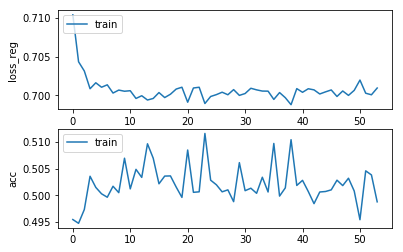

Epochs :  53 Iterations :  20682 Loss :  0.7009430428086622 ACC :  0.4987866828709296 MCC :  -0.004399669010437752 Precision :  0.5090876153765086
mode : validation


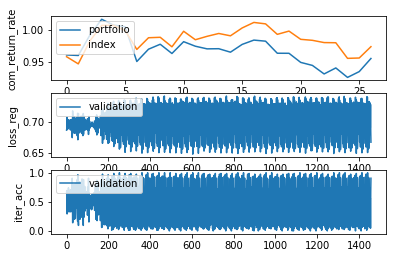

Epochs :  53 Iterations :  27 Loss :  0.6971121584927594 ACC :  0.4928104640502069 MCC :  nan Precision :  0.4901801950677677


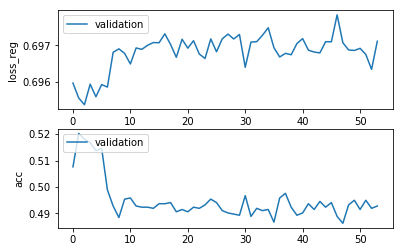

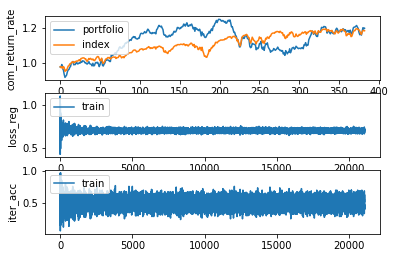

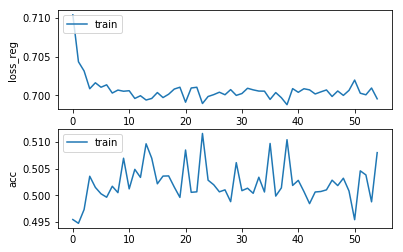

Epochs :  54 Iterations :  21065 Loss :  0.6995479067685398 ACC :  0.5080018592098674 MCC :  0.006012331403782178 Precision :  0.5140150265899479
mode : validation


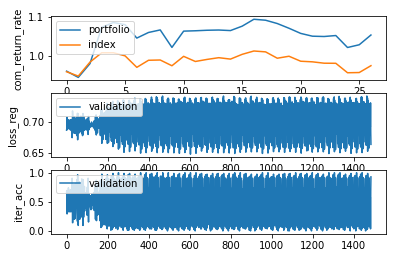

Epochs :  54 Iterations :  27 Loss :  0.6971243465388263 ACC :  0.49193900720112854 MCC :  nan Precision :  0.49191042380752387


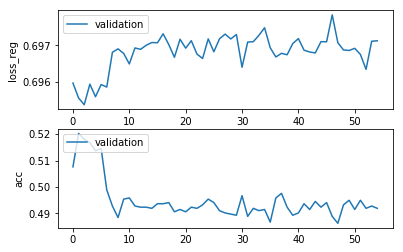

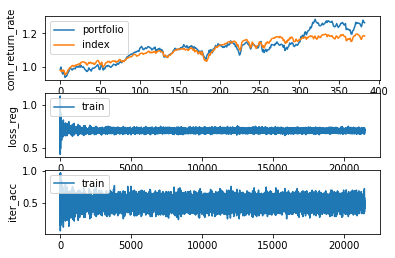

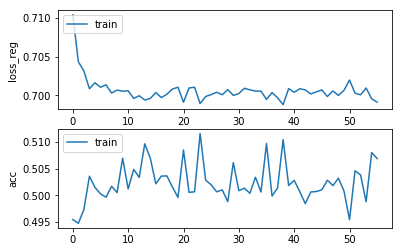

Epochs :  55 Iterations :  21448 Loss :  0.6991147159285085 ACC :  0.5068960379682695 MCC :  0.006865140123295236 Precision :  0.5139558518514543
mode : validation


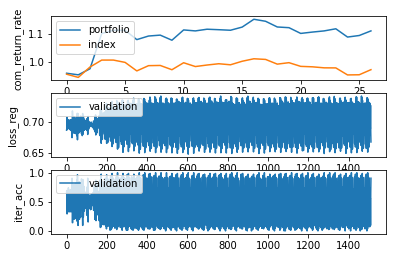

Epochs :  55 Iterations :  27 Loss :  0.6968245440059238 ACC :  0.4949891156068555 MCC :  nan Precision :  0.49155563557589493


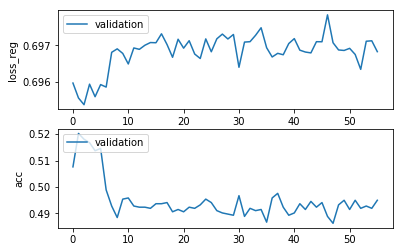

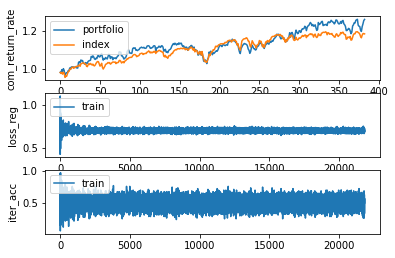

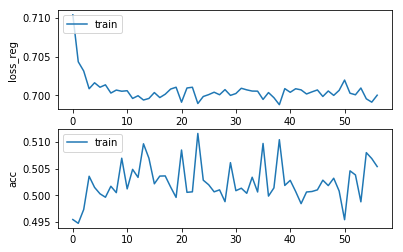

Epochs :  56 Iterations :  21831 Loss :  0.7000154888661039 ACC :  0.5053908927633619 MCC :  0.00729299242323746 Precision :  0.5139973896942235
mode : validation


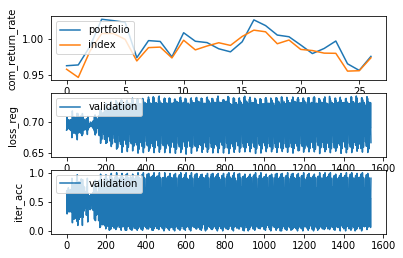

Epochs :  56 Iterations :  27 Loss :  0.6970571566511083 ACC :  0.4945533841986347 MCC :  nan Precision :  0.49054120467216883


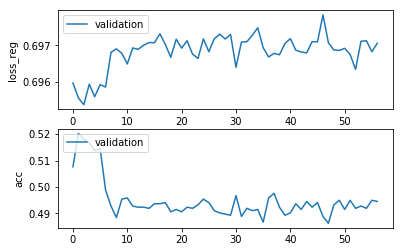

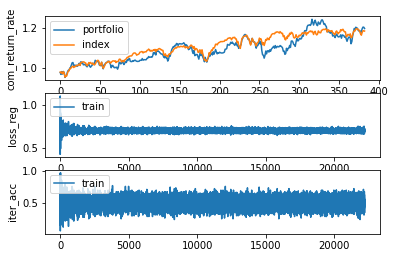

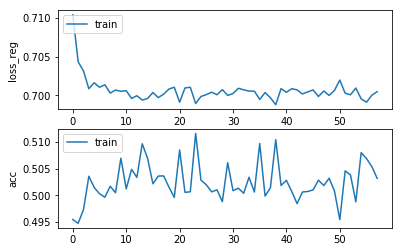

Epochs :  57 Iterations :  22214 Loss :  0.7004716144218146 ACC :  0.5031792503190725 MCC :  -0.0027887375989452236 Precision :  0.5110348336515321
mode : validation


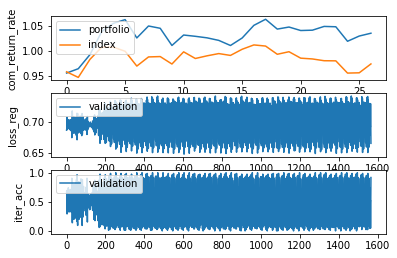

Epochs :  57 Iterations :  27 Loss :  0.6968373391363356 ACC :  0.4875817060884502 MCC :  nan Precision :  0.4884806891420373


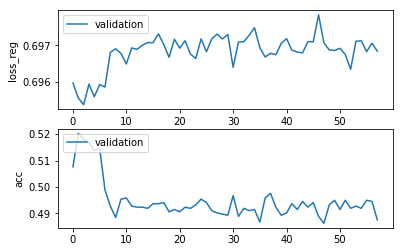

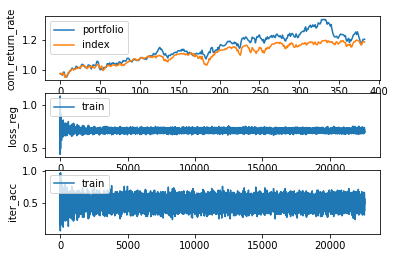

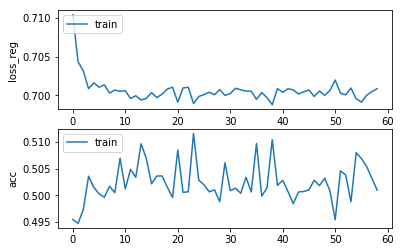

Epochs :  58 Iterations :  22597 Loss :  0.7008617416063114 ACC :  0.5009676094310402 MCC :  -0.0015621633492604715 Precision :  0.5104420800831937
mode : validation


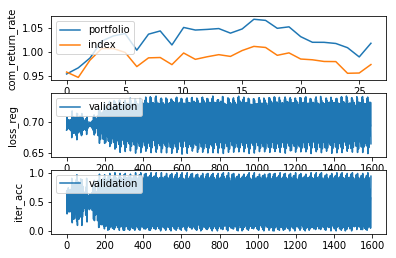

Epochs :  58 Iterations :  27 Loss :  0.6970945375937002 ACC :  0.4932461939407168 MCC :  nan Precision :  0.4915706431148229


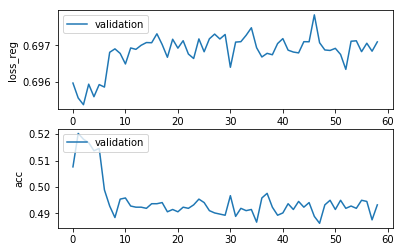

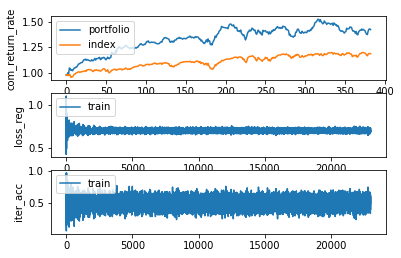

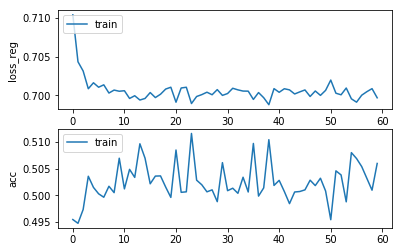

Epochs :  59 Iterations :  22980 Loss :  0.699679715981994 ACC :  0.5059745205133453 MCC :  0.0064859562424283874 Precision :  0.5127620139784197
mode : validation


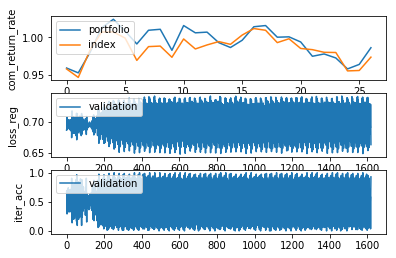

Epochs :  59 Iterations :  27 Loss :  0.696841593141909 ACC :  0.48583878690583837 MCC :  nan Precision :  0.48894740627319727


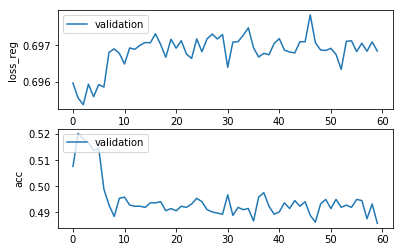

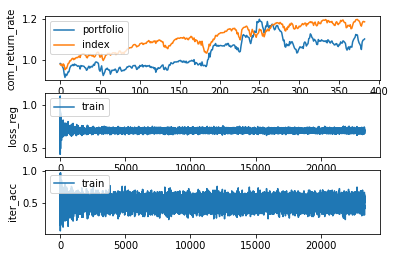

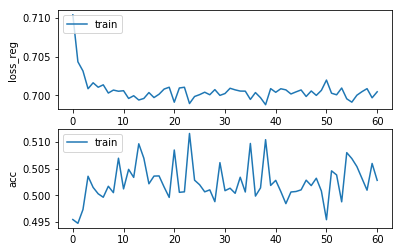

Epochs :  60 Iterations :  23363 Loss :  0.7004553979121674 ACC :  0.5028106435627601 MCC :  0.0030258668102713074 Precision :  0.5120137934779685
mode : validation


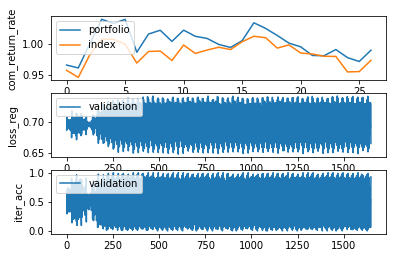

Epochs :  60 Iterations :  27 Loss :  0.6974828044573466 ACC :  0.4910675445916476 MCC :  nan Precision :  0.49025353644457126


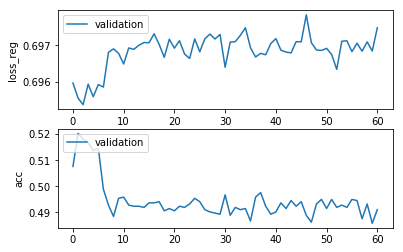

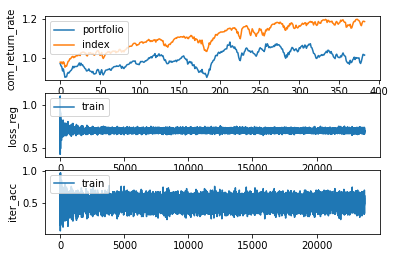

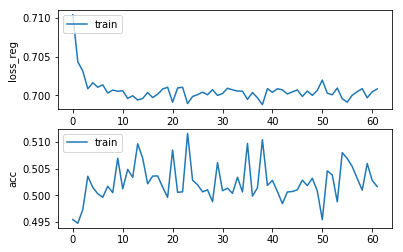

Epochs :  61 Iterations :  23746 Loss :  0.7008236044380746 ACC :  0.5016433876737291 MCC :  -0.0017185173301067563 Precision :  0.5109003986968773
mode : validation


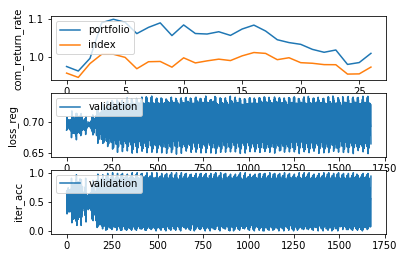

Epochs :  61 Iterations :  27 Loss :  0.6970550484127469 ACC :  0.4949891147100263 MCC :  nan Precision :  0.4911791774685736


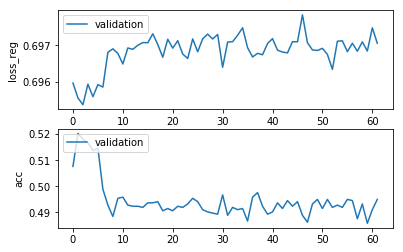

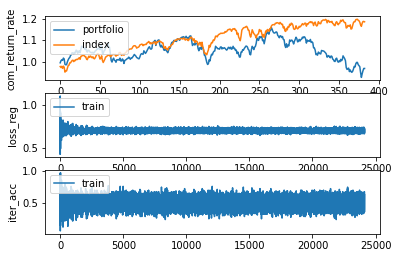

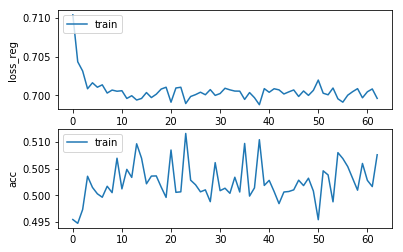

Epochs :  62 Iterations :  24129 Loss :  0.6996021469952854 ACC :  0.5076025349353063 MCC :  0.007864328205838371 Precision :  0.513997030383652
mode : validation


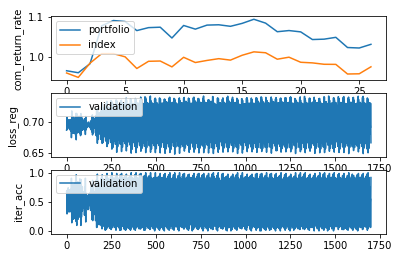

Epochs :  62 Iterations :  27 Loss :  0.6967136396302117 ACC :  0.4949891139856643 MCC :  nan Precision :  0.4909210977730928


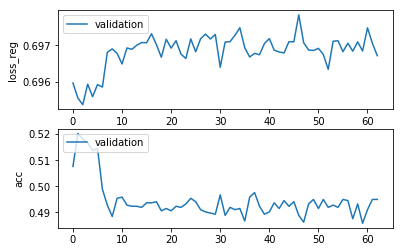

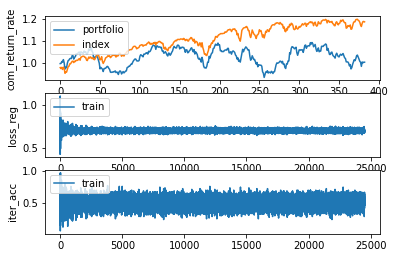

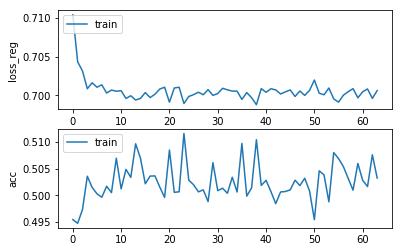

Epochs :  63 Iterations :  24512 Loss :  0.7006132920168088 ACC :  0.5032406848497863 MCC :  0.0019807982700451353 Precision :  0.5124261637775145
mode : validation


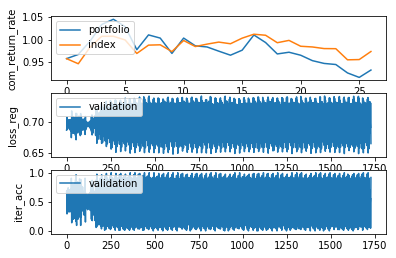

Epochs :  63 Iterations :  27 Loss :  0.6972773295861704 ACC :  0.49498911374421034 MCC :  nan Precision :  0.4911784667659689


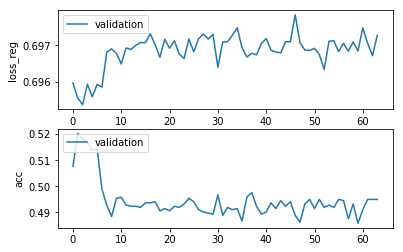

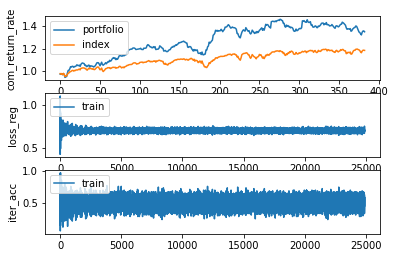

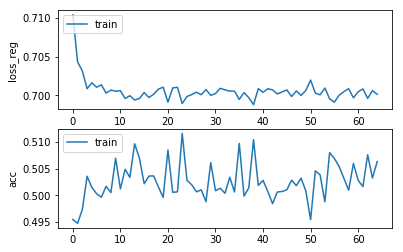

Epochs :  64 Iterations :  24895 Loss :  0.7001298750038246 ACC :  0.5063124096735961 MCC :  0.005724011381781677 Precision :  0.5133029653912036
mode : validation


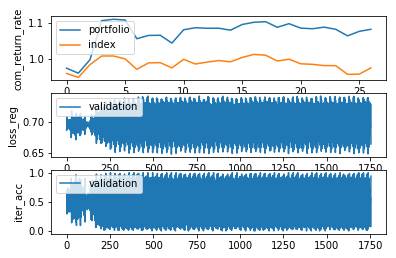

Epochs :  64 Iterations :  27 Loss :  0.6969062376905371 ACC :  0.492810464222674 MCC :  nan Precision :  0.4910738138412988


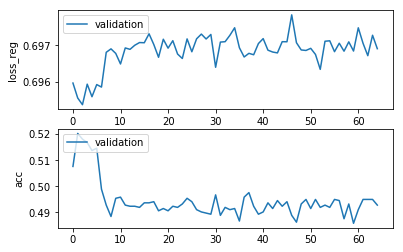

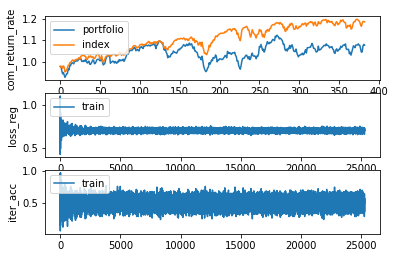

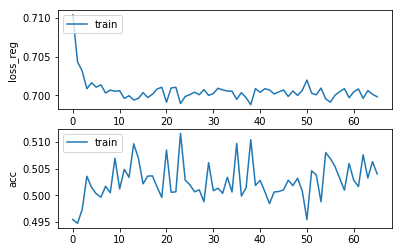

Epochs :  65 Iterations :  25278 Loss :  0.6998192255553004 ACC :  0.5040086157639406 MCC :  0.005064234836330983 Precision :  0.5125818235347384
mode : validation


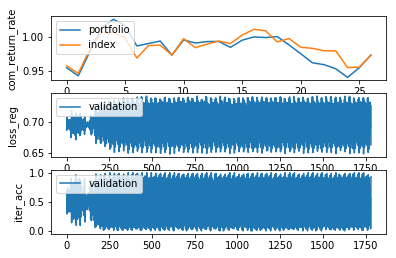

Epochs :  65 Iterations :  27 Loss :  0.6967000674318384 ACC :  0.49150327527550636 MCC :  nan Precision :  0.4901486535867055


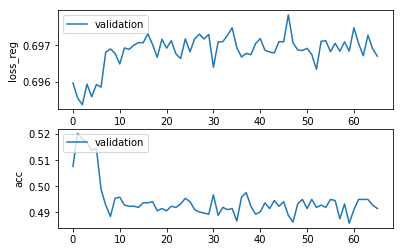

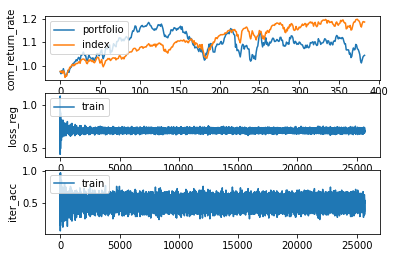

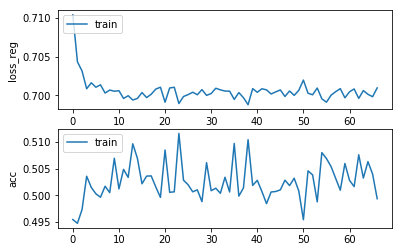

Epochs :  66 Iterations :  25661 Loss :  0.7009592127862239 ACC :  0.49937031147685434 MCC :  -0.006549315216437993 Precision :  0.5091511813179631
mode : validation


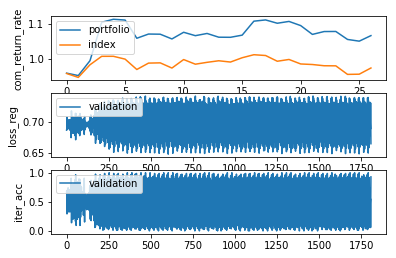

Epochs :  66 Iterations :  27 Loss :  0.6970274382167392 ACC :  0.4919390049935491 MCC :  nan Precision :  0.48963274654966815


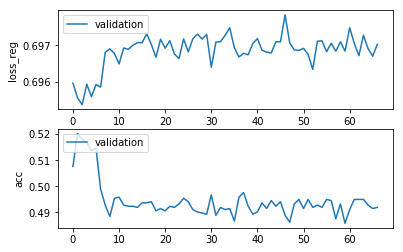

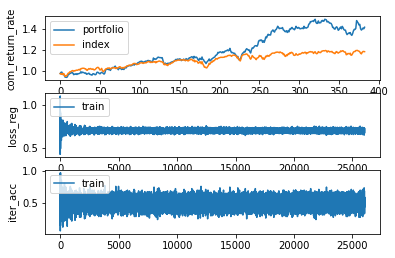

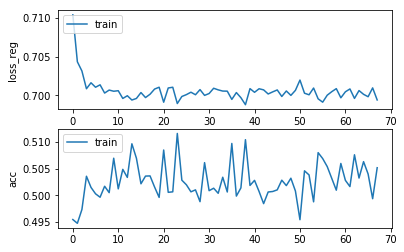

Epochs :  67 Iterations :  26044 Loss :  0.6994008680236558 ACC :  0.505175870952656 MCC :  0.004976507744237576 Precision :  0.5134933732167937
mode : validation


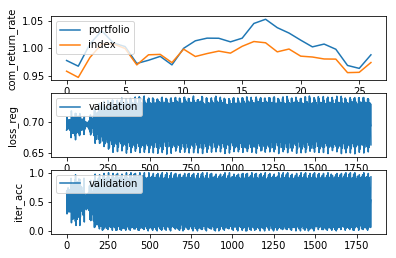

Epochs :  67 Iterations :  27 Loss :  0.6970729938259831 ACC :  0.48801743615142723 MCC :  nan Precision :  0.4893449495236079


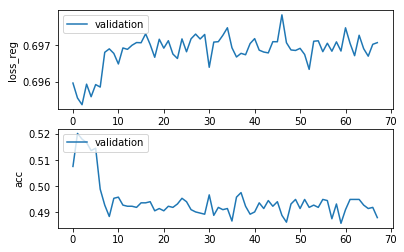

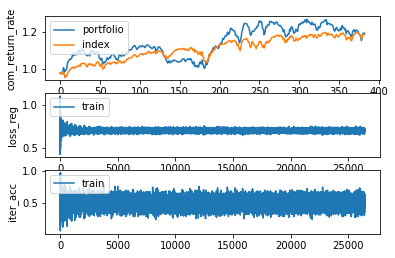

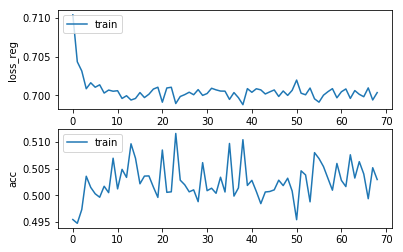

Epochs :  68 Iterations :  26427 Loss :  0.7003511581034947 ACC :  0.5029642293254015 MCC :  0.0026039270531840854 Precision :  0.5113043909741678
mode : validation


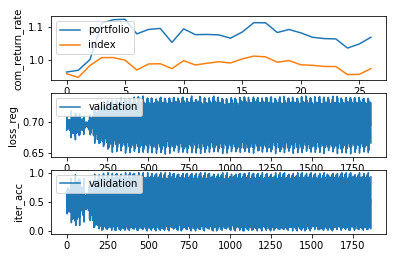

Epochs :  68 Iterations :  27 Loss :  0.6970933852372346 ACC :  0.48845316580048315 MCC :  nan Precision :  0.48907093345015135


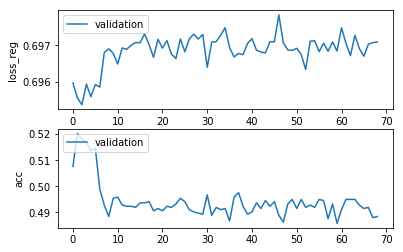

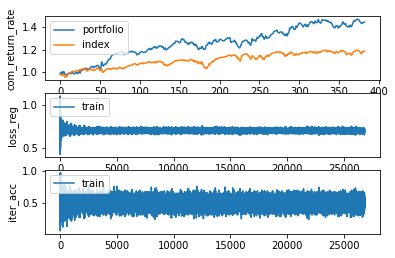

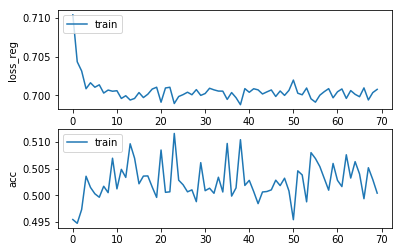

Epochs :  69 Iterations :  26810 Loss :  0.7007699618140337 ACC :  0.5004146975263292 MCC :  -0.0069544202346882395 Precision :  0.5086198242201273
mode : validation


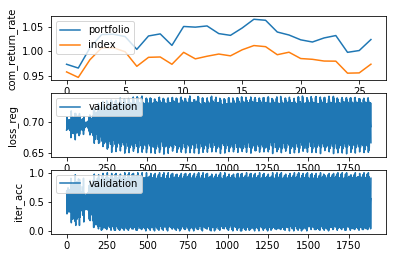

Epochs :  69 Iterations :  27 Loss :  0.697075225688793 ACC :  0.4915032764137895 MCC :  nan Precision :  0.49009469399849576


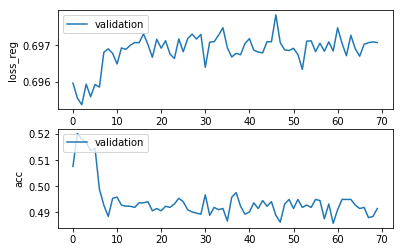

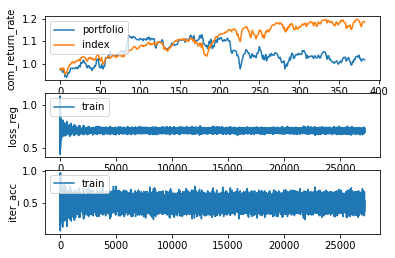

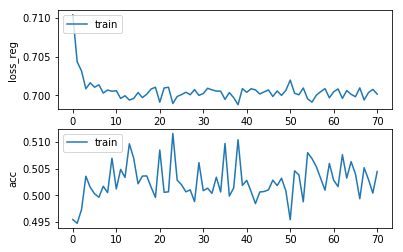

Epochs :  70 Iterations :  27193 Loss :  0.7001531843105745 ACC :  0.504469374608122 MCC :  0.011953689243070605 Precision :  0.5147852950945847
mode : validation


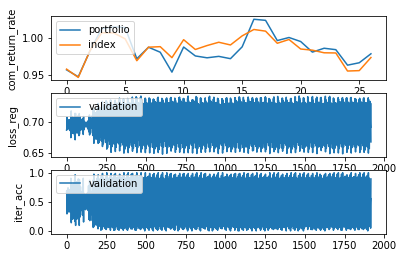

Epochs :  70 Iterations :  27 Loss :  0.6975836378556711 ACC :  0.48758170622642394 MCC :  nan Precision :  0.489633538932712


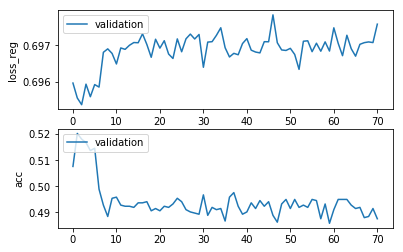

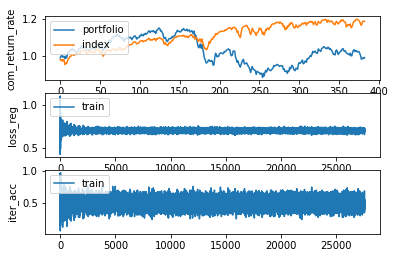

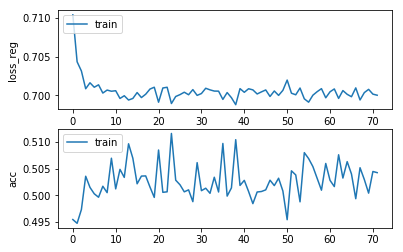

Epochs :  71 Iterations :  27576 Loss :  0.7000121225264925 ACC :  0.5042543541980474 MCC :  0.007888177207637063 Precision :  0.5139693372612989
mode : validation


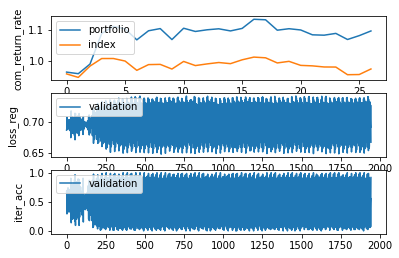

Epochs :  71 Iterations :  27 Loss :  0.6974630775275054 ACC :  0.49237473495304585 MCC :  nan Precision :  0.48964723806690286


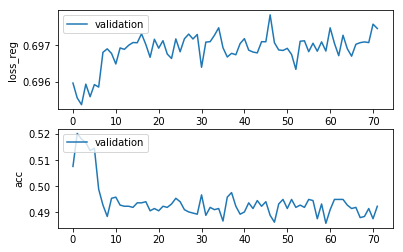

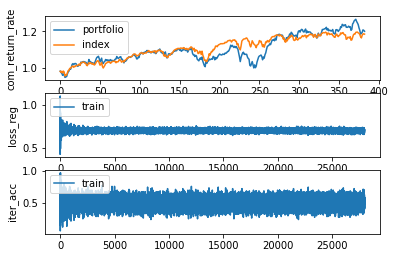

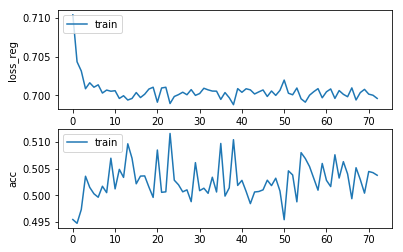

Epochs :  72 Iterations :  27959 Loss :  0.699598565425325 ACC :  0.5037628770963952 MCC :  -0.00028506694720236114 Precision :  0.5109598274700169
mode : validation


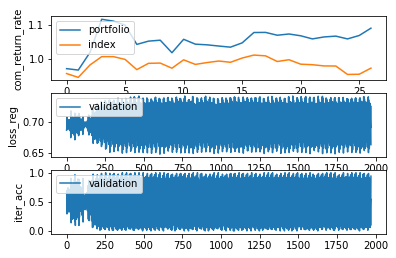

Epochs :  72 Iterations :  27 Loss :  0.6971401506000094 ACC :  0.4954248443590822 MCC :  nan Precision :  0.4901563906007343


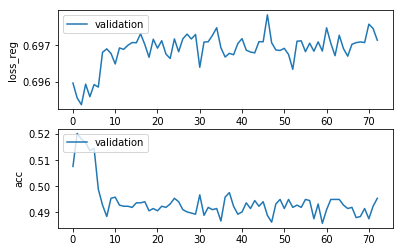

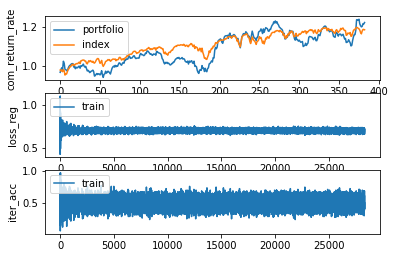

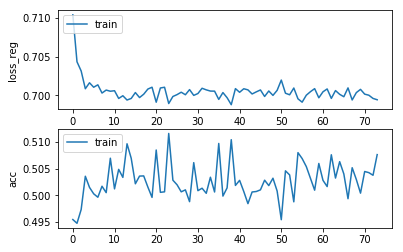

Epochs :  73 Iterations :  28342 Loss :  0.6994259251626913 ACC :  0.5076332517143329 MCC :  0.012387600968872725 Precision :  0.5163510234943802
mode : validation


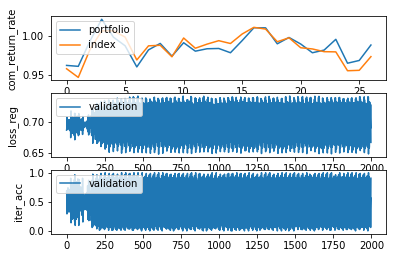

Epochs :  73 Iterations :  27 Loss :  0.6968986855612861 ACC :  0.49586057456003296 MCC :  nan Precision :  0.49254860094300024


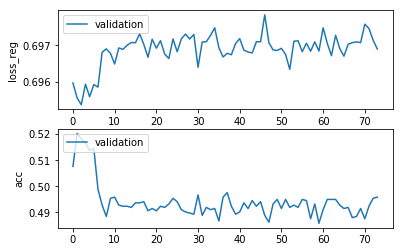

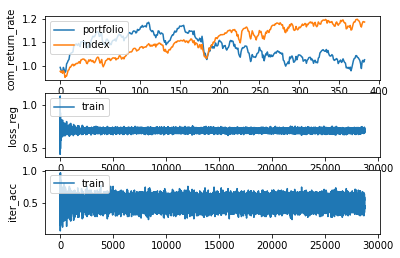

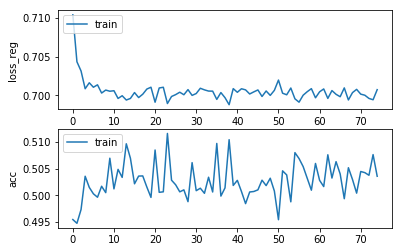

Epochs :  74 Iterations :  28725 Loss :  0.7007310555435659 ACC :  0.5035785752550429 MCC :  0.005788700203879374 Precision :  0.5136640834678013
mode : validation


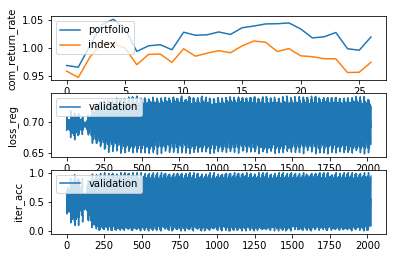

Epochs :  74 Iterations :  27 Loss :  0.6963916663770322 ACC :  0.49368192441761494 MCC :  nan Precision :  0.49055248016008624


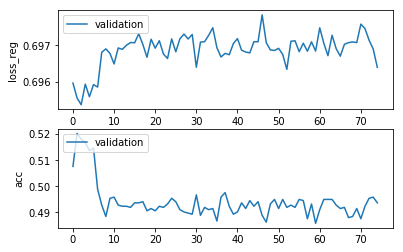

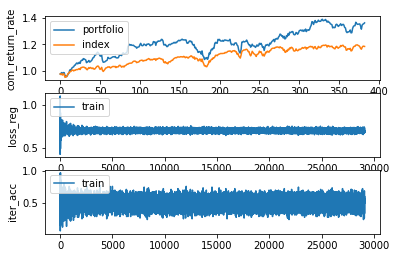

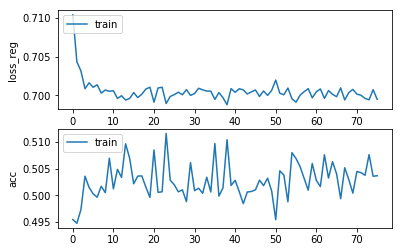

Epochs :  75 Iterations :  29108 Loss :  0.6994803865335629 ACC :  0.5036707263313448 MCC :  -0.0005002586944904129 Precision :  0.5124563735620393
mode : validation


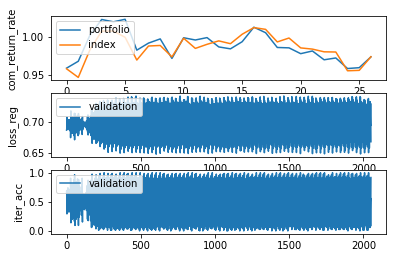

Epochs :  75 Iterations :  27 Loss :  0.6968340432202375 ACC :  0.4932461955619079 MCC :  nan Precision :  0.4922099979939284


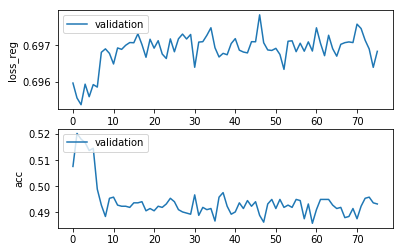

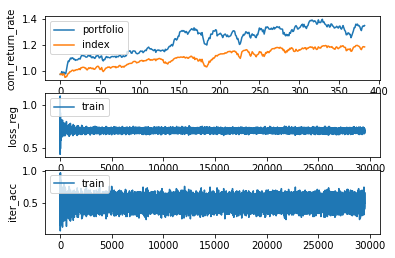

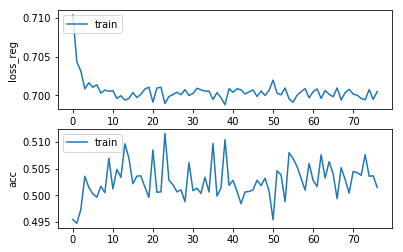

Epochs :  76 Iterations :  29491 Loss :  0.700490230835449 ACC :  0.5014898019889005 MCC :  0.0025841917618610664 Precision :  0.5121174486786827
mode : validation


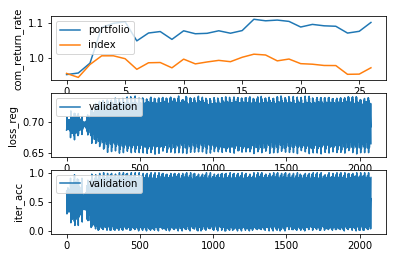

Epochs :  76 Iterations :  27 Loss :  0.6963482896486918 ACC :  0.49542484370370704 MCC :  nan Precision :  0.49222652089816554


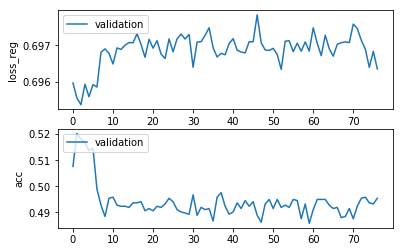

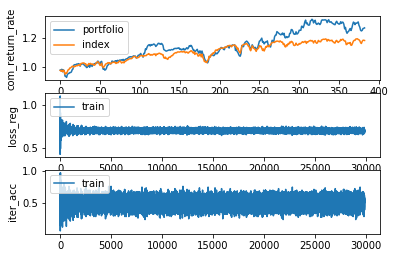

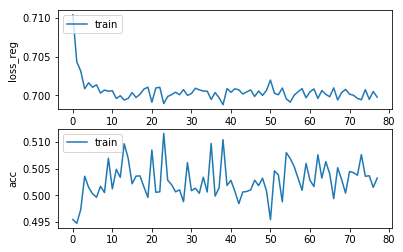

Epochs :  77 Iterations :  29874 Loss :  0.6997615696555952 ACC :  0.503240685083225 MCC :  -0.0029095324141146035 Precision :  0.5104796885082367
mode : validation


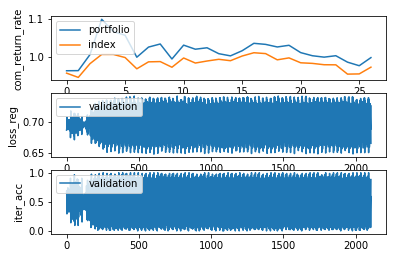

Epochs :  77 Iterations :  27 Loss :  0.6970471209949918 ACC :  0.48714597761217093 MCC :  nan Precision :  0.48965310829657094


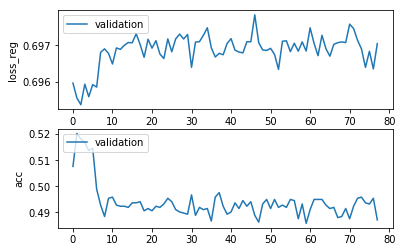

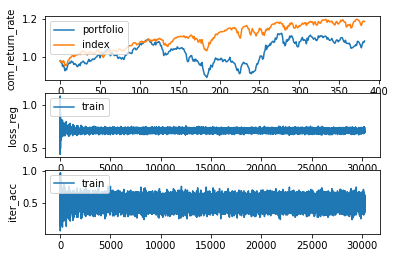

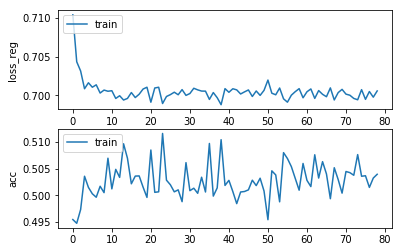

Epochs :  78 Iterations :  30257 Loss :  0.7005672255633083 ACC :  0.5039471816611975 MCC :  0.0033729805776122326 Precision :  0.5125735763012974
mode : validation


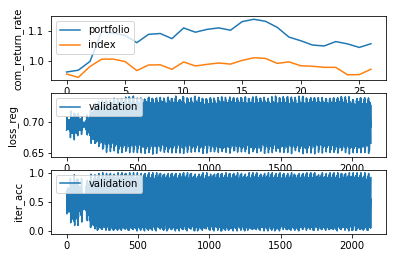

Epochs :  78 Iterations :  27 Loss :  0.6963868626841793 ACC :  0.4919390059593651 MCC :  nan Precision :  0.49141617257286


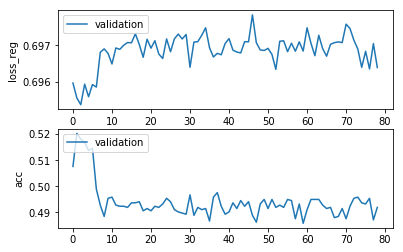

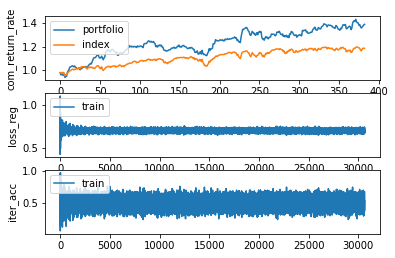

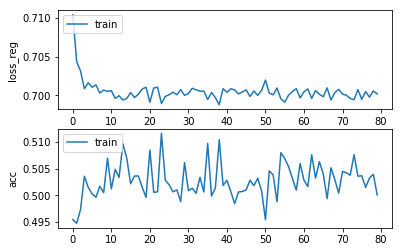

Epochs :  79 Iterations :  30640 Loss :  0.7001834577119693 ACC :  0.5000768075879498 MCC :  -0.005622511722607047 Precision :  0.5092943364039414
mode : validation


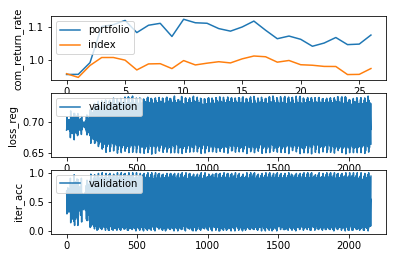

Epochs :  79 Iterations :  27 Loss :  0.69670127497779 ACC :  0.49542484322079905 MCC :  nan Precision :  0.4902887032539756


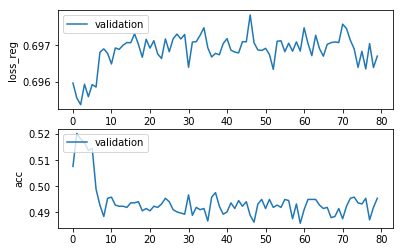

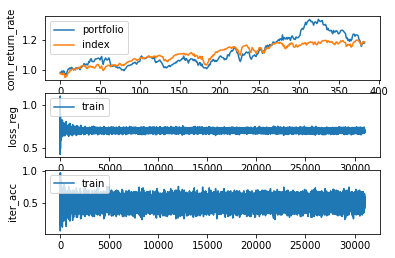

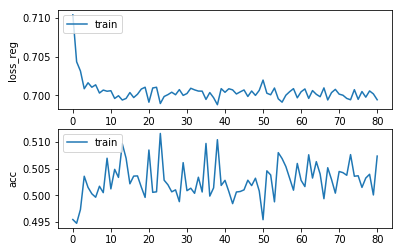

Epochs :  80 Iterations :  31023 Loss :  0.6994267448432763 ACC :  0.5073567965790123 MCC :  0.00286729788005245 Precision :  0.5128199025969126
mode : validation


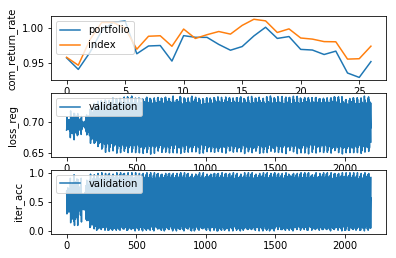

Epochs :  80 Iterations :  27 Loss :  0.697090208530426 ACC :  0.49411765461856566 MCC :  nan Precision :  0.492351317157348


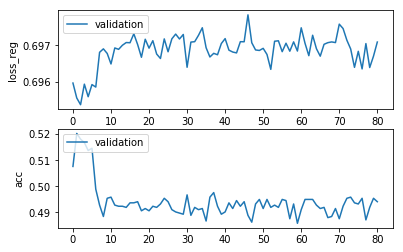

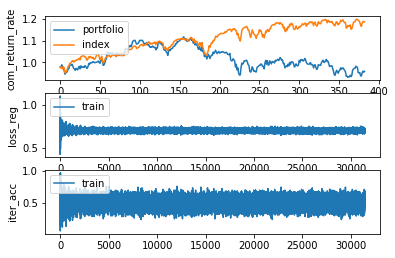

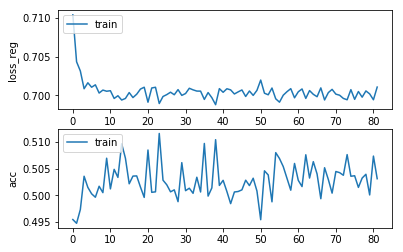

Epochs :  81 Iterations :  31406 Loss :  0.7010650013819064 ACC :  0.5031178161774229 MCC :  0.004107132762872344 Precision :  0.5130613906158247
mode : validation


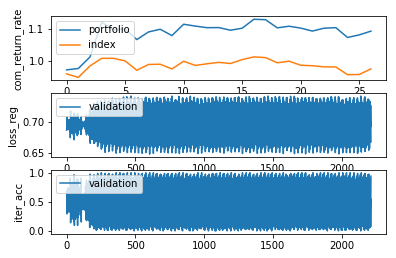

Epochs :  81 Iterations :  27 Loss :  0.6971202779699255 ACC :  0.48888889572548644 MCC :  nan Precision :  0.4898809894091553


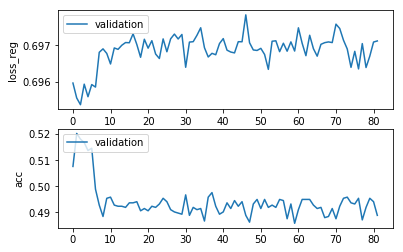

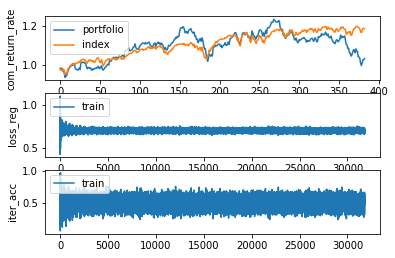

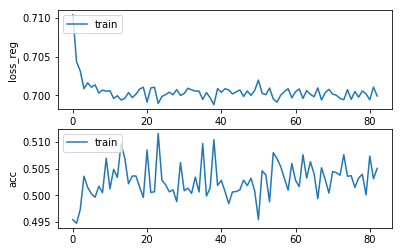

Epochs :  82 Iterations :  31789 Loss :  0.6999124739873502 ACC :  0.5050530024359182 MCC :  0.006760033885534979 Precision :  0.5142074886894257
mode : validation


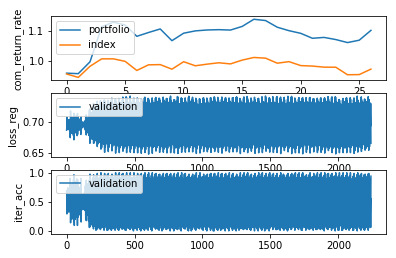

Epochs :  82 Iterations :  27 Loss :  0.6976979750174063 ACC :  0.4971677630932795 MCC :  nan Precision :  0.4911020313975988


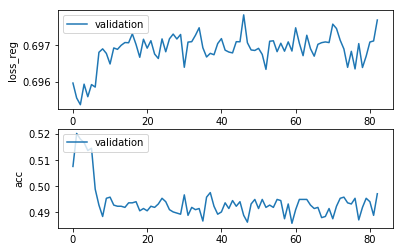

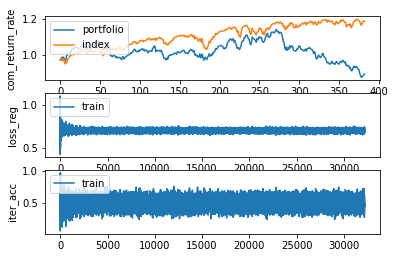

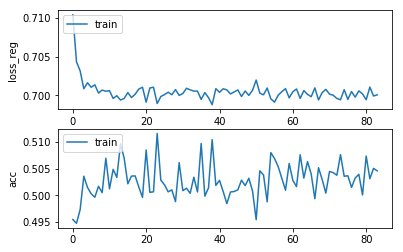

Epochs :  83 Iterations :  32172 Loss :  0.7000624316479457 ACC :  0.5045922438251754 MCC :  0.006950277134207109 Precision :  0.5128782510504555
mode : validation


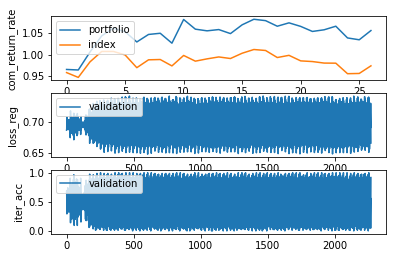

Epochs :  83 Iterations :  27 Loss :  0.6971367398897806 ACC :  0.4928104641536872 MCC :  nan Precision :  0.4914574997016677


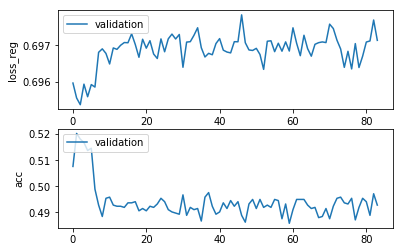

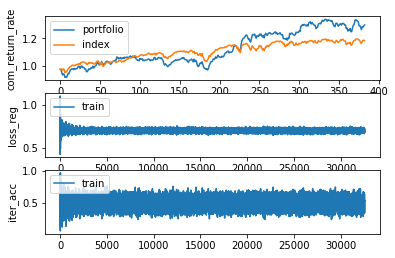

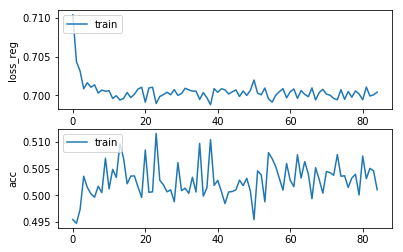

Epochs :  84 Iterations :  32555 Loss :  0.7004081287832236 ACC :  0.5010597600015585 MCC :  -0.0018486279379345439 Precision :  0.5100838390978992
mode : validation


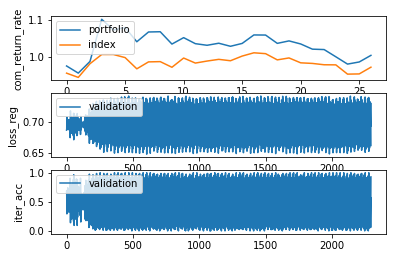

Epochs :  84 Iterations :  27 Loss :  0.6972496332945647 ACC :  0.49281046556791774 MCC :  nan Precision :  0.49101304290471254


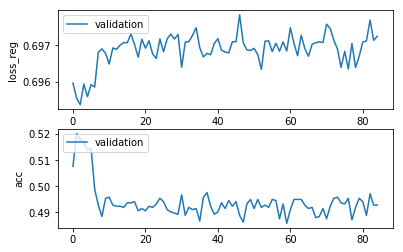

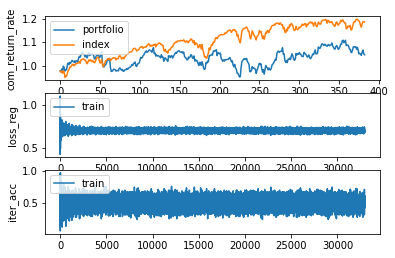

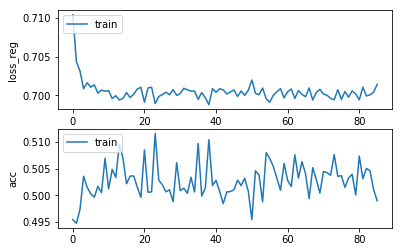

Epochs :  85 Iterations :  32938 Loss :  0.7014262771170693 ACC :  0.49897098704666754 MCC :  -0.006941057480847361 Precision :  0.5088176283810297
mode : validation


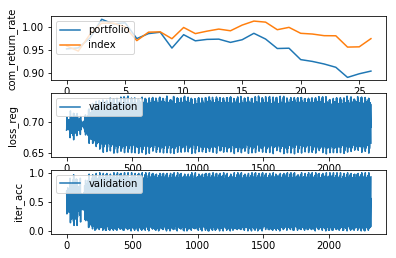

Epochs :  85 Iterations :  27 Loss :  0.6971823440657722 ACC :  0.4919390045451345 MCC :  nan Precision :  0.49124995467287524


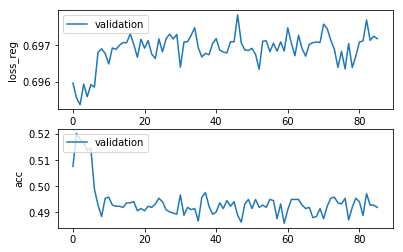

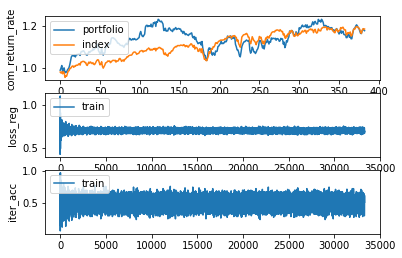

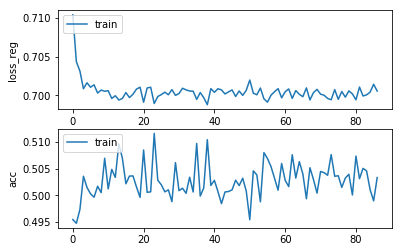

Epochs :  86 Iterations :  33321 Loss :  0.7005461104233645 ACC :  0.503332836898749 MCC :  -0.0072767967818725575 Precision :  0.5086087811368641
mode : validation


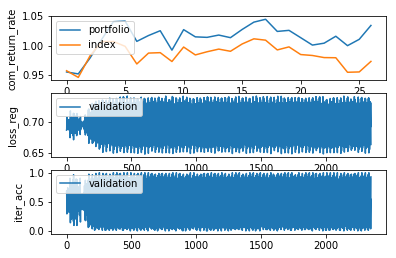

Epochs :  86 Iterations :  27 Loss :  0.6967880703784801 ACC :  0.4928104646710886 MCC :  nan Precision :  0.4909789061380757


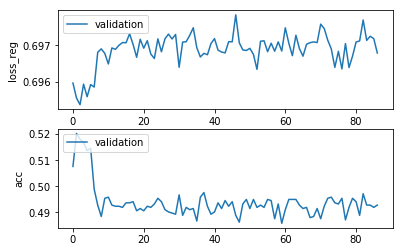

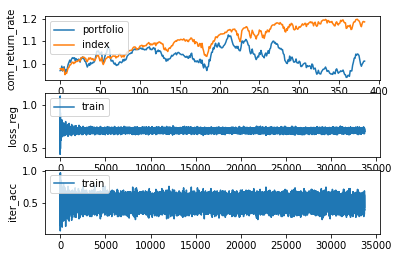

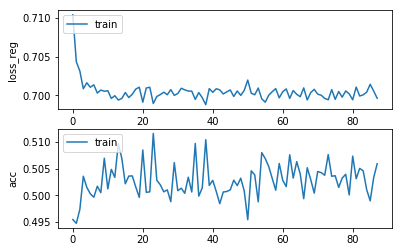

Epochs :  87 Iterations :  33704 Loss :  0.6996202531122352 ACC :  0.505913085399035 MCC :  0.004207388630414055 Precision :  0.5134130536624797
mode : validation


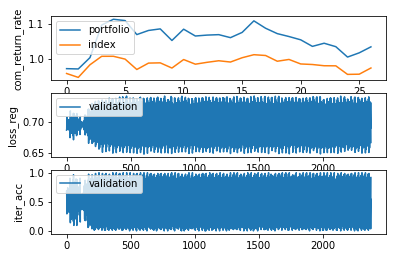

Epochs :  87 Iterations :  27 Loss :  0.6969521244366964 ACC :  0.4928104652919703 MCC :  nan Precision :  0.49189489183050616


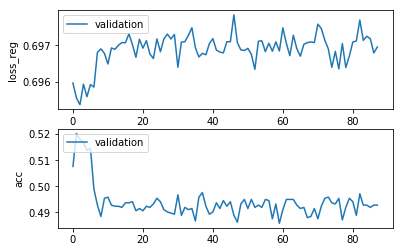

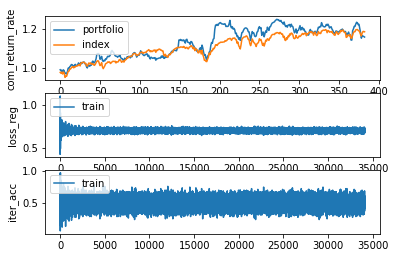

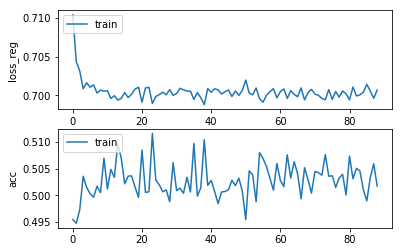

Epochs :  88 Iterations :  34087 Loss :  0.7006765152704623 ACC :  0.5017355401117559 MCC :  -0.006665503839638775 Precision :  0.5093073882113938
mode : validation


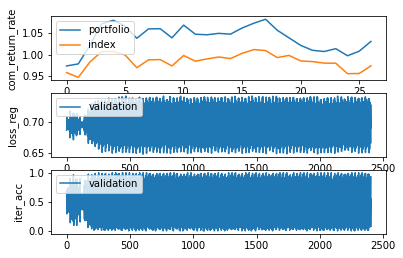

Epochs :  88 Iterations :  27 Loss :  0.6965389936058609 ACC :  0.4962963033467531 MCC :  nan Precision :  0.4917460305409299


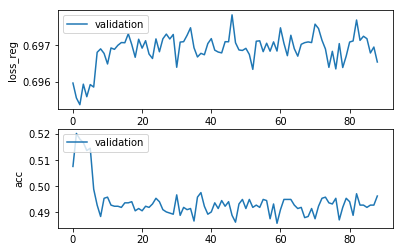

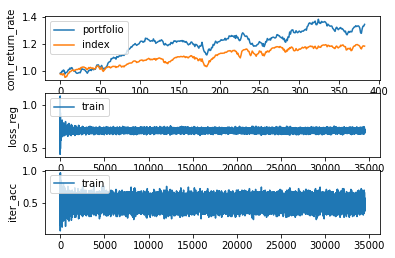

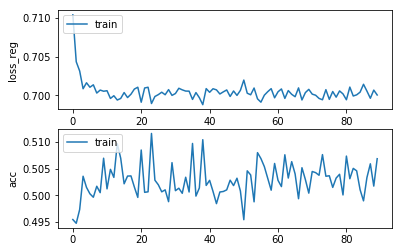

Epochs :  89 Iterations :  34470 Loss :  0.7000428533118325 ACC :  0.5068653203333016 MCC :  0.005272627829734537 Precision :  0.5132244366267331
mode : validation


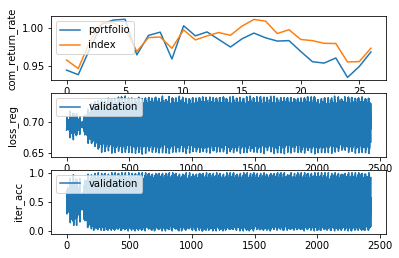

Epochs :  89 Iterations :  27 Loss :  0.6969229027077004 ACC :  0.4910675453849965 MCC :  nan Precision :  0.49159234306878513


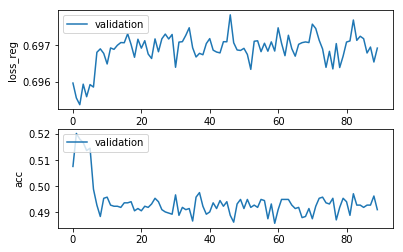

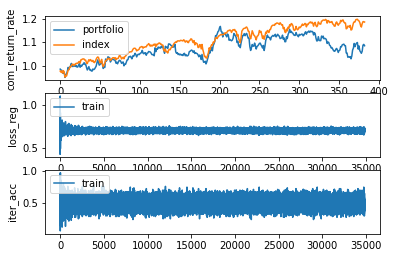

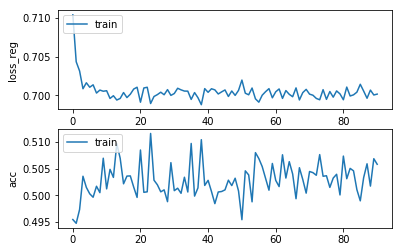

Epochs :  90 Iterations :  34853 Loss :  0.7001569042317861 ACC :  0.5058209342838268 MCC :  0.006393333876781487 Precision :  0.514200568797344
mode : validation


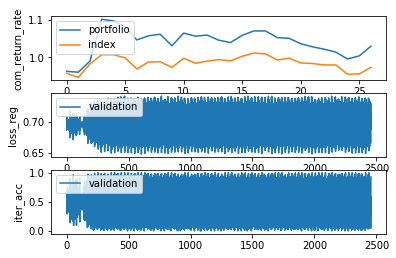

Epochs :  90 Iterations :  27 Loss :  0.6972110977879277 ACC :  0.49586057345624324 MCC :  nan Precision :  0.4914052035245631


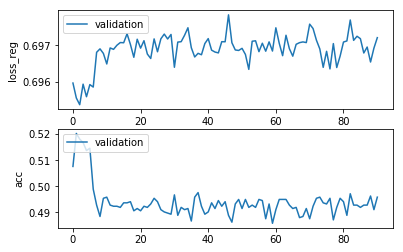

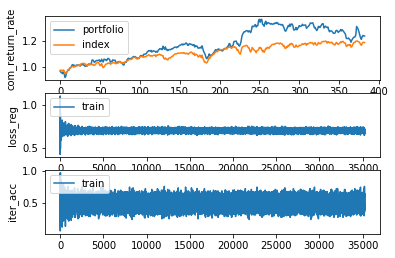

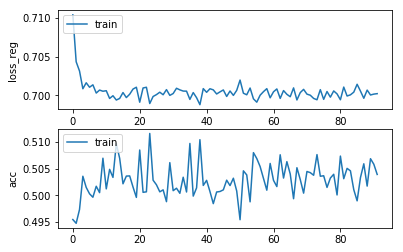

Epochs :  91 Iterations :  35236 Loss :  0.7002152601359096 ACC :  0.5039164644152938 MCC :  0.00314019486753698 Precision :  0.5118854259853264
mode : validation


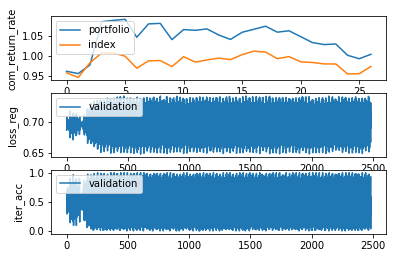

Epochs :  91 Iterations :  27 Loss :  0.6973577053458603 ACC :  0.4932461956653882 MCC :  nan Precision :  0.4922393737015901


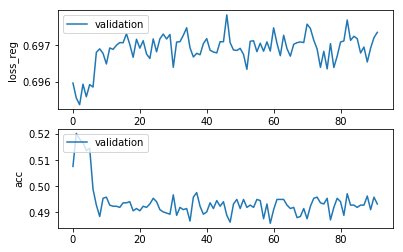

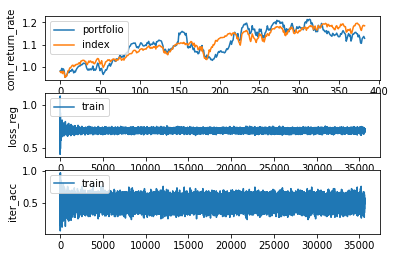

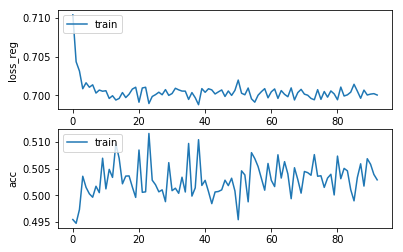

Epochs :  92 Iterations :  35619 Loss :  0.7000358909290703 ACC :  0.5029027956117227 MCC :  0.000296918485634632 Precision :  0.5127993722108263
mode : validation


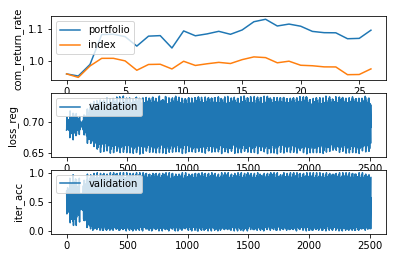

Epochs :  92 Iterations :  27 Loss :  0.6966886983977424 ACC :  0.4897603554030259 MCC :  nan Precision :  0.49091135310354056


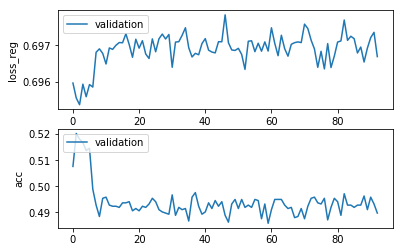

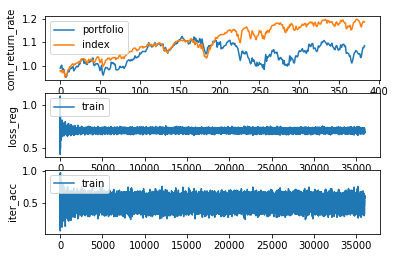

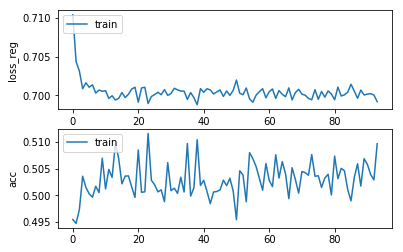

Epochs :  93 Iterations :  36002 Loss :  0.6991809894459677 ACC :  0.5096605903330422 MCC :  0.008008634057880791 Precision :  0.5147103194011176
mode : validation


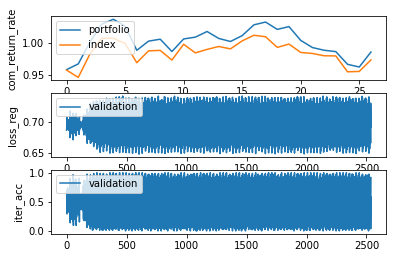

Epochs :  93 Iterations :  27 Loss :  0.6968478604599282 ACC :  0.4915032746891181 MCC :  nan Precision :  0.4916030062293565


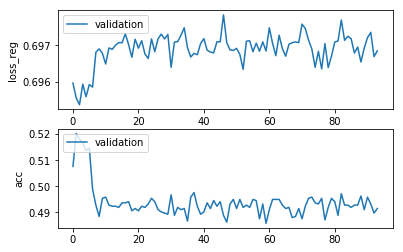

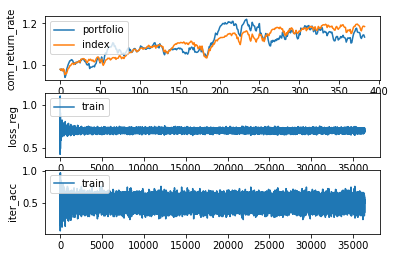

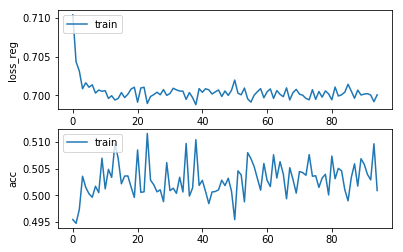

Epochs :  94 Iterations :  36385 Loss :  0.7000664755818738 ACC :  0.5009061743556363 MCC :  -0.0033101832877732718 Precision :  0.5101274539407722
mode : validation


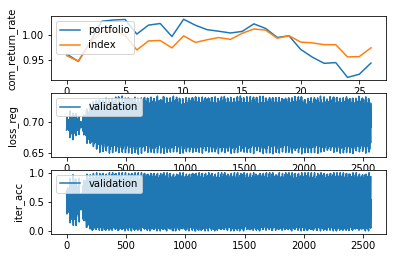

Epochs :  94 Iterations :  27 Loss :  0.6968635784255134 ACC :  0.4949891140891446 MCC :  nan Precision :  0.4909210606581635


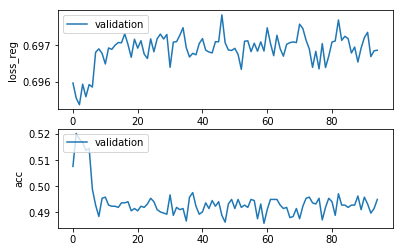

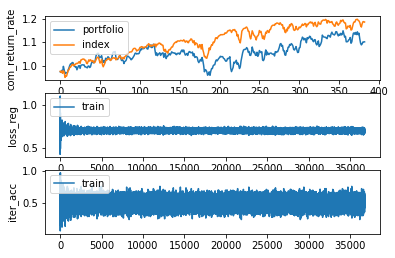

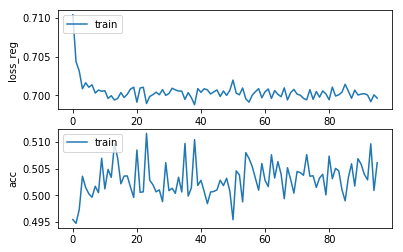

Epochs :  95 Iterations :  36768 Loss :  0.6996311799041908 ACC :  0.5060973894969601 MCC :  -0.001985270516155409 Precision :  0.5112698923543524
mode : validation


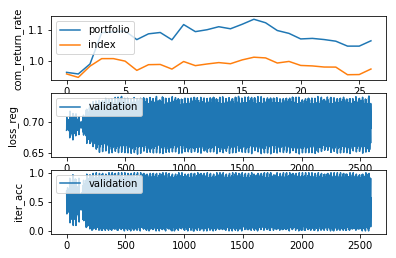

Epochs :  95 Iterations :  27 Loss :  0.6971235959618179 ACC :  0.49063181573594056 MCC :  nan Precision :  0.49059066769701465


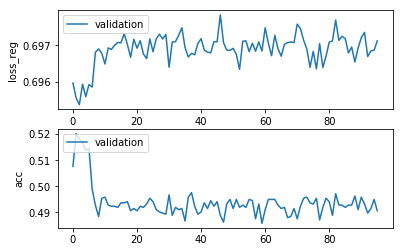

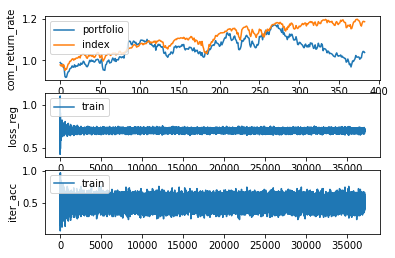

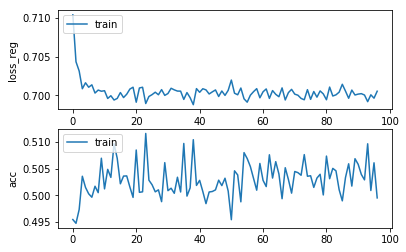

Epochs :  96 Iterations :  37151 Loss :  0.7005301242397597 ACC :  0.4995238975507472 MCC :  -0.009807453037290676 Precision :  0.5081230314696504
mode : validation


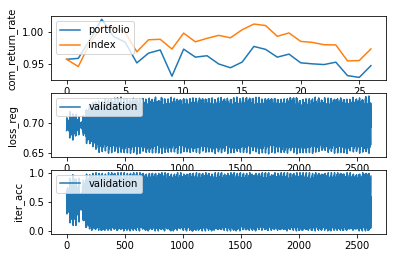

Epochs :  96 Iterations :  27 Loss :  0.6972405513127645 ACC :  0.4928104655334243 MCC :  nan Precision :  0.4905075248054884


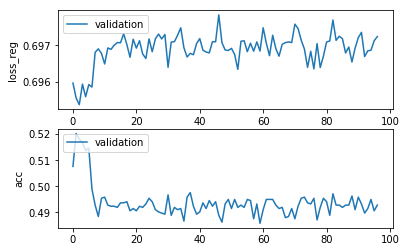

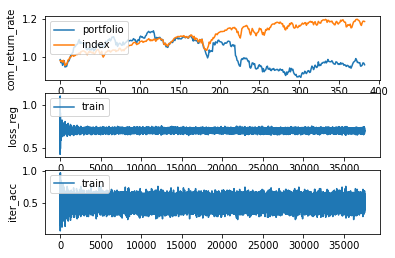

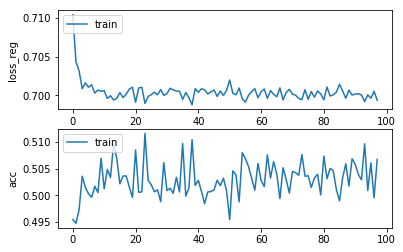

Epochs :  97 Iterations :  37534 Loss :  0.699363217185745 ACC :  0.5067117334812802 MCC :  0.00479076601754553 Precision :  0.5125591487480283
mode : validation


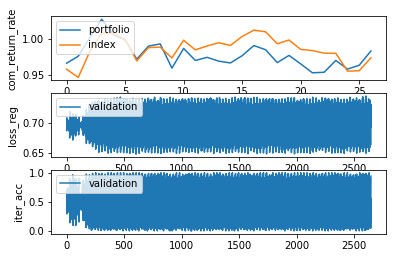

Epochs :  97 Iterations :  27 Loss :  0.6973576413260566 ACC :  0.4932461955619079 MCC :  nan Precision :  0.49035399627906306


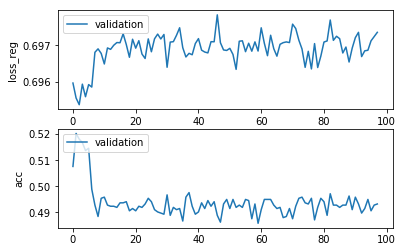

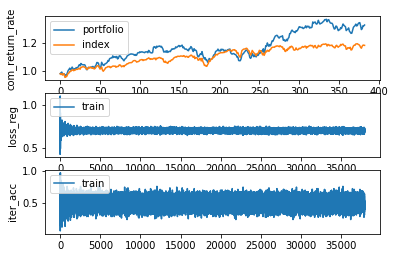

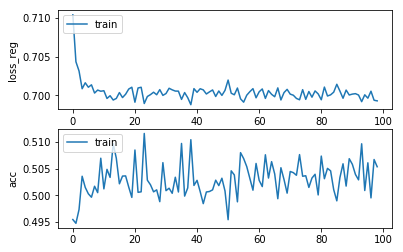

Epochs :  98 Iterations :  37917 Loss :  0.6992844716687115 ACC :  0.5053601750505811 MCC :  0.007672421158201428 Precision :  0.5140953201158629
mode : validation


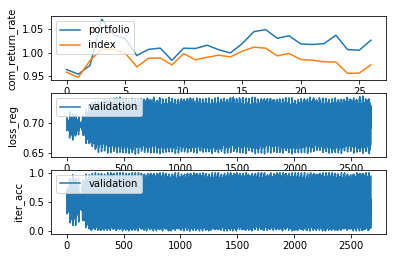

Epochs :  98 Iterations :  27 Loss :  0.6967972781923082 ACC :  0.4910675447986082 MCC :  nan Precision :  0.4908696789708402


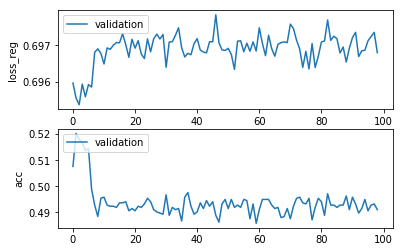

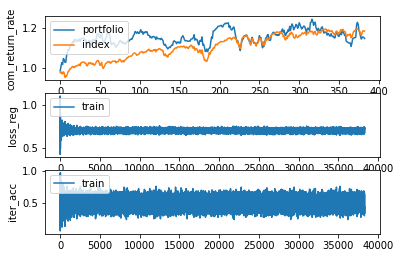

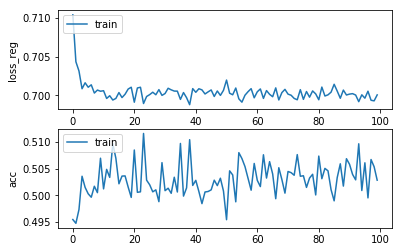

Epochs :  99 Iterations :  38300 Loss :  0.7000545723942491 ACC :  0.5028413606530381 MCC :  0.005089431484539898 Precision :  0.5132056038447367
mode : validation


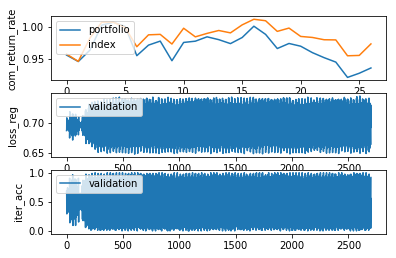

Epochs :  99 Iterations :  27 Loss :  0.6968489223056369 ACC :  0.4945533845780624 MCC :  nan Precision :  0.4926326433541598


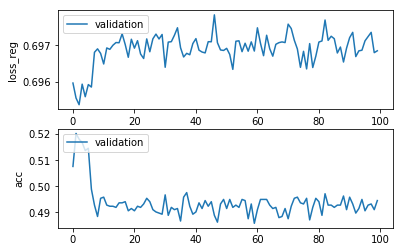

In [16]:
model.train()

epoch :  0 time_idx :  0 loss_reg :  tensor(0.6731, grad_fn=<AddBackward0>) acc :  tensor(0.6471) mcc :  tensor(0.1364) precision :  tensor(0.9259)


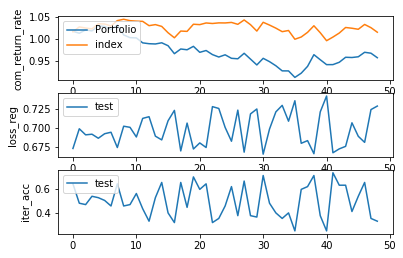

Epochs :  0 Iterations :  49 Loss :  0.6977355772135209 ACC :  0.5003601574167913 MCC :  0.02746203467630002 Precision :  0.48246878974747903


In [23]:
model.test()

In [ ]:
model.train()

In [ ]:
model.test()

In [ ]:
model.train() # dropout 없음, epochs = 5

In [ ]:
model.train() # dropout 0.15 적용

In [ ]:
model.test()

In [ ]:
model.test()

In [ ]:
model.train()

In [ ]:
model.train()

In [ ]:
model.test()

In [ ]:
model.epoch_losses

In [ ]:
model.train()

In [ ]:
model.test()

In [ ]:
model.return_rate.shape

In [ ]:
ㄴmodel.train()

In [ ]:
model.train()